# WGCNA
weighted gene co-expression network analysis

with the new reference genome (nov 2025 release)

# Phase 2

following [Hovrath Lab Tutorial](https://www.dropbox.com/scl/fo/4vqfiysan6rlurfo2pbnk/h?dl=0&e=1&preview=Consensus-NetworkConstruction-man.pdf&rlkey=thqg8wlpdn4spu3ihjuc1kmlu)

## 0. load libraries

In [2]:
library(tidyverse)
library(DESeq2)
library(WGCNA)
library(janitor) # for row_to_names()
library(zoo)
library(ComplexHeatmap)
library(circlize)
library(reshape)
library(fastDummies) # create 0/1 factor columns
library(ape) # for read.gff
library(cowplot) # for plot_grid()

In [3]:
# important setting, cannot omit
options(stringsAsFactors = FALSE)

In [4]:
# allow multi-threading within WGCNA
enableWGCNAThreads()

Allowing parallel execution with up to 55 working processes.


## 1. structure WGCNA input

**Expected input**:
- Rows = samples
- Columns = genes (or probes/features)
- Values = numeric expression values

### A. format vst normalized counts matrix

In [5]:
# read in deseq results and remove deseq columns - leave only gene name and vst expression
deseq_res <- read.csv('/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/deseq_res/bb_cc.csv') %>%
select(-baseMean, -log2FoldChange, -lfcSE, -stat, -pvalue, -padj, -svalue)

# set gene name as row name
rownames(deseq_res) <- deseq_res$Gene

dataExpr <- deseq_res %>% 
select(-Gene) %>% # remove gene name as column
t() # transpose so samples = rows, genes = columns

dim(dataExpr)
head(dataExpr)

[1]    94 29019

,LOC144621260,LOC144621269,LOC111120925,Trnae-cuc-2,Trnae-cuc-3,LOC144621283,LOC144621276,LOC111115920,Trnae-cuc-4,LOC144621308,⋯,LOC111110910,LOC111110817,LOC111111216,LOC111111215,LOC111111213,LOC111114497,LOC111114498,LOC111112304,LOC144621306,LOC144621888
B1_B1_O01,2495.692,52.27077,66.526433,0,0,540.7649,10722.16,160.61382,0,56.072279,⋯,604.4402,349.73896,135.9040,320.2773,11318.047,100.7400,2457.676,1218.3841,7.603021,3.801510
B1_W5_O50,2092.463,1648.11743,23.227145,0,0,870.5130,11074.30,182.78753,0,9.088883,⋯,1483.5077,81.79995,238.3307,194.9060,9510.001,120.1752,2850.880,1188.6239,28.276525,7.069131
B2_B5_O51,2064.163,2375.98692,448.606226,0,0,891.4734,12546.63,151.12960,0,59.304021,⋯,1660.5126,724.08297,186.5207,231.4770,12999.059,181.7381,3033.114,917.2993,0.000000,18.173813
B2_C4_O40,1825.307,889.77116,9.680992,0,0,740.1558,11113.78,108.25109,0,17.601803,⋯,684.7102,57.20586,189.2194,148.7352,9537.537,136.4140,2025.087,1159.0788,14.081443,17.601803
B3_B4_O41,1404.294,2454.89589,17.451866,0,0,819.0743,13593.84,89.58625,0,86.095875,⋯,779.5167,65.15363,30.2499,52.3556,11200.608,303.6625,2493.290,969.1603,2.326916,17.451866
B3_C3_O30,1381.734,1036.59320,8.189788,0,0,1091.5818,14838.73,78.38797,0,44.458851,⋯,834.1884,64.34834,219.9543,142.7363,9548.123,226.9741,2579.783,790.8996,0.000000,7.019819


### B. identify and remove genes with missing data 
genes with too many NAs or zero-counts

In [6]:
gsg <- goodSamplesGenes(dataExpr, verbose = 3)
gsg$allOK

dataExpr <- dataExpr[gsg$goodSamples, gsg$goodGenes]
dim(dataExpr) # 94 samples x 35396 genes

 Flagging genes and samples with too many missing values...
  ..step 1
  ..Excluding 51 genes from the calculation due to too many missing samples or zero variance.
  ..step 2


[1] FALSE

[1]    94 28968

### C. Sample size and gene filtering

removing low-variance genes first:

In [7]:
dataExpr <- dataExpr[, apply(dataExpr, 2, var) > quantile(apply(dataExpr, 2, var), 0.25)]
dim(dataExpr) # 94 samples x 26547 genes

[1]    94 21726

check again 

In [8]:
gsg <- goodSamplesGenes(dataExpr, verbose = 3)
gsg$allOK

dataExpr <- dataExpr[gsg$goodSamples, gsg$goodGenes]
dim(dataExpr) # 94 samples x 35396 genes

 Flagging genes and samples with too many missing values...
  ..step 1


[1] TRUE

[1]    94 21726

### D. Sample outlier detection

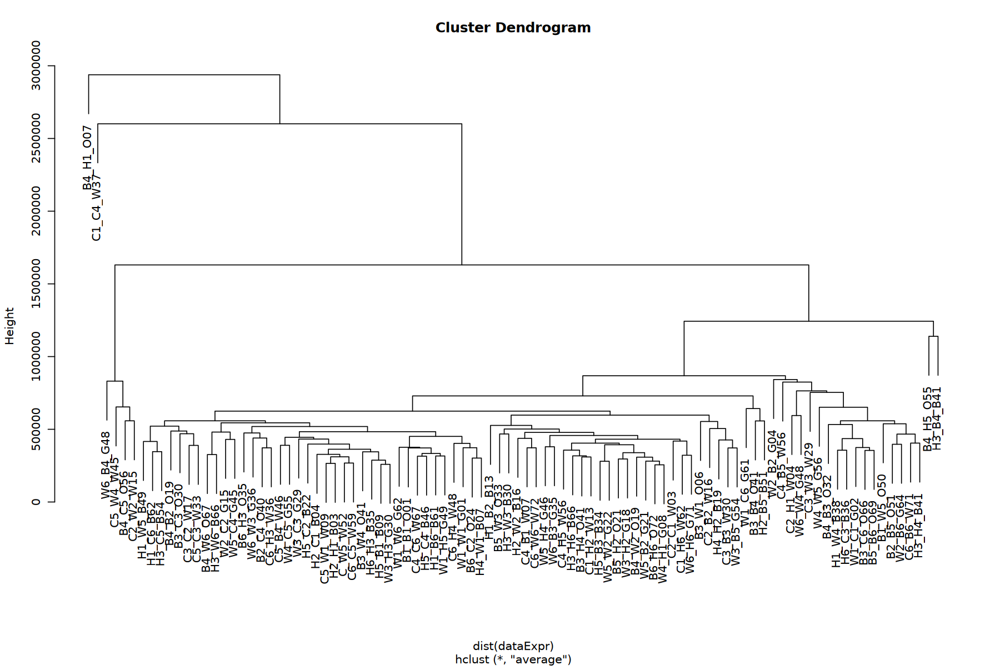

In [9]:
options(repr.plot.width = 15, repr.plot.height = 10)

sampleTree <- hclust(dist(dataExpr), method = "average")
plot(sampleTree)

only obvious outliers - B4_H1_O07 and C1_C4_W37 - becuase it clusters above the rest of the tree and is separated from the main cluster - going to remove it from analysis

In [10]:
dataExpr <- dataExpr[!rownames(dataExpr) %in% c("B4_H1_O07", "C1_C4_W37"), ]
dim(dataExpr) # 92 samples x 26547 genes

[1]    92 21726

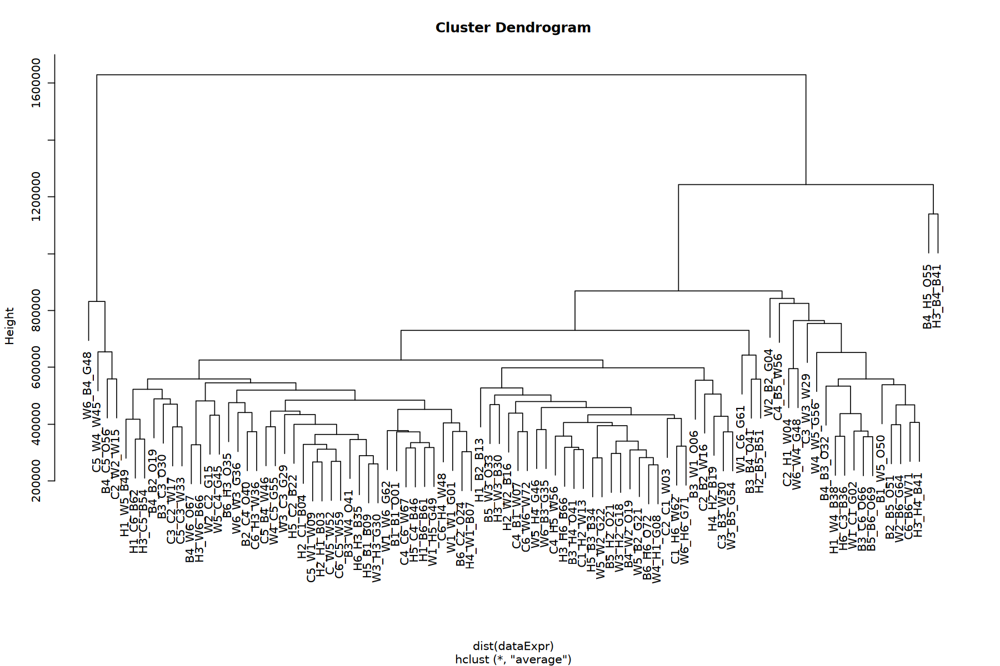

In [11]:
# replot without outliers
sampleTree <- hclust(dist(dataExpr), method = "average")
plot(sampleTree)

looks much better!

maybe I should also remove B4_H5_O55 and H3_B4_B41 too but I'll leave them in for now

### meta data
could add phenotypic data to this ...

In [12]:
meta <- read.csv('/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/metaData/sample_metaData.csv') %>%
filter(!grepl("Nu", Sample)) # filter out phase 1 samples - only want phase 2

# setting samples as rownames and deleting col from df
rownames(meta) <- meta$Sample
meta <- meta[, !colnames(meta) %in% "Sample"]

### caught this below but fixing here
# fix missing rep number
rownames(dataExpr)[rownames(dataExpr) == 'C_W5_W52'] <- 'C2_W5_W52'
rownames(meta)[rownames(meta) == 'C_W5_W52'] <- 'C2_W5_W52'

# fix wrong rep number to sample name
rownames(dataExpr)[rownames(dataExpr) == 'W2_B2_G04'] <- 'W2_B1_G04'
rownames(meta)[rownames(meta) == 'W2_B2_G04'] <- 'W2_B1_G04'

# removing same samples as dataExpr
meta <- meta[rownames(meta) %in% rownames(dataExpr), ]



head(meta)
dim(meta) # 92 samples

,Phase1_treatment,Phase1_temp,Phase1_DO,Phase1_TankRep,Phase2_treatment,Phase2_temp,Phase2_DO,Phase2_TankRep
,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
B1_B1_O01,both,warm,hypoxic,1,both,warm,hypoxic,1
B1_W5_O50,both,warm,hypoxic,1,warm,warm,normoxic,5
B2_B5_O51,both,warm,hypoxic,2,both,warm,hypoxic,5
B2_C4_O40,both,warm,hypoxic,2,control,ambient,normoxic,4
B3_B4_O41,both,warm,hypoxic,3,both,warm,hypoxic,4
B3_C3_O30,both,warm,hypoxic,3,control,ambient,normoxic,3


[1] 92  8

In [13]:
rownames(dataExpr)[!rownames(dataExpr) %in% rownames(meta)]

character(0)

In [14]:
rownames(dataExpr)[rownames(dataExpr) == 'C_W5_W52'] <- 'C2_W5_W52'
rownames(meta)[rownames(meta) == 'C_W5_W52'] <- 'C2_W5_W52'

# fix wrong rep number to sample name
rownames(dataExpr)[rownames(dataExpr) == 'W2_B2_G04'] <- 'W2_B1_G04'
rownames(meta)[rownames(meta) == 'W2_B2_G04'] <- 'W2_B1_G04'

creating new column for 'complete' treatment - so I can easily compare phase 1 to phase 2

In [15]:
meta$complete_trtmt <- paste(meta$Phase1_treatment, meta$Phase2_treatment)

In [16]:
# double checking the samples in rownames are the same
all(rownames(meta) == rownames(dataExpr))

[1] TRUE

## 2. simple WGCNA network construction and module identification
start with simple, can progress to consensus if deemed necessary

In [17]:
# final QC check
gsg <- goodSamplesGenes(dataExpr, verbose = 3)
if (!gsg$allOK) {
  dataExpr <- dataExpr[gsg$goodSamples, gsg$goodGenes]
}

gsg$allOK

 Flagging genes and samples with too many missing values...
  ..step 1


[1] TRUE

### A. choose soft thresholding power (β)
analysis of network topology

In [18]:
powers <- c(1:20)
sft <- pickSoftThreshold(
  dataExpr,
  powerVector = powers,
  networkType = "signed",
  verbose = 5
)


pickSoftThreshold: will use block size 2059.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 2059 of 21726
   ..working on genes 2060 through 4118 of 21726
   ..working on genes 4119 through 6177 of 21726
   ..working on genes 6178 through 8236 of 21726
   ..working on genes 8237 through 10295 of 21726
   ..working on genes 10296 through 12354 of 21726
   ..working on genes 12355 through 14413 of 21726
   ..working on genes 14414 through 16472 of 21726
   ..working on genes 16473 through 18531 of 21726
   ..working on genes 18532 through 20590 of 21726
   ..working on genes 20591 through 21726 of 21726
   Power SFT.R.sq  slope truncated.R.sq  mean.k. median.k. max.k.
1      1 0.000809   2.85          0.971 10900.00  1.09e+04  11200
2      2 0.186000 -21.20          0.918  5580.00  5.56e+03   6040
3      3 0.362000 -13.20          0.852  2930.00  2.90e+03   3370
4      4 0.509000  -9.75          0.867  1570.00  1.55e+03   2020
5      5 0.

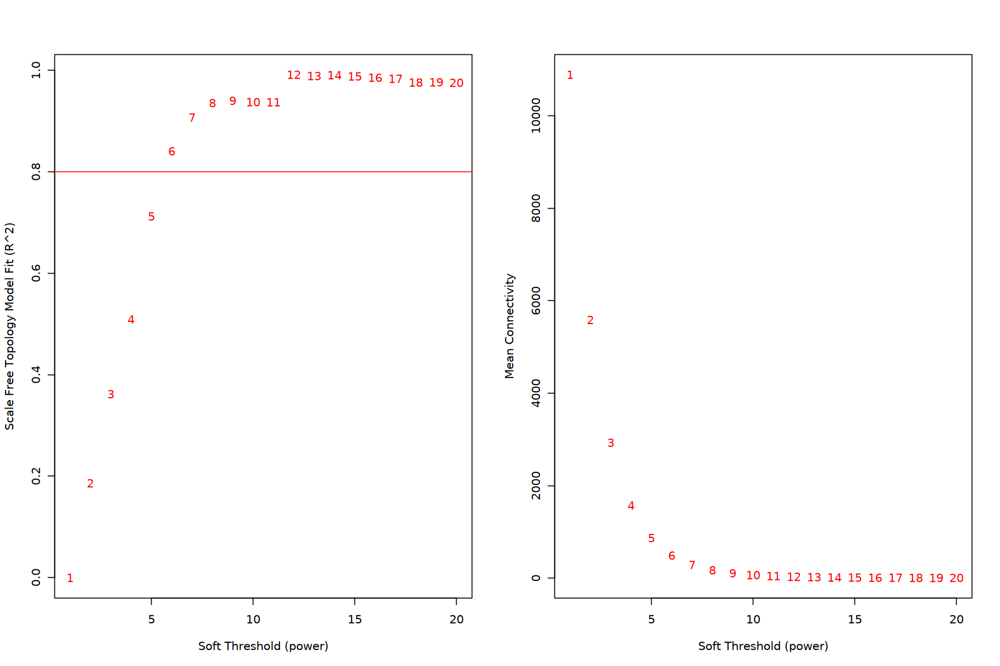

In [19]:
par(mfrow = c(1,2))
plot(
  sft$fitIndices[,1],
  -sign(sft$fitIndices[,3]) * sft$fitIndices[,2],
  xlab = "Soft Threshold (power)",
  ylab = "Scale Free Topology Model Fit (R^2)",
  type = "n"
)
text(
  sft$fitIndices[,1],
  -sign(sft$fitIndices[,3]) * sft$fitIndices[,2],
  labels = powers,
  col = "red"
)
abline(h = 0.8, col = "red")

plot(
  sft$fitIndices[,1],
  sft$fitIndices[,5],
  xlab = "Soft Threshold (power)",
  ylab = "Mean Connectivity",
  type = "n"
)
text(
  sft$fitIndices[,1],
  sft$fitIndices[,5],
  labels = powers,
  col = "red"
)


#### left plot - scale-free topology
the red line is where R^2 is 0.8 - you want the lowest power that reaches this - 6 is just above 0.8 and anything after 8 plateaus

#### right plot - mean connectivity
connectivity should not collapse to 0 - by power 8-10, the connectivity approaches 0

based on this, I think power of 6 should be appropriate

### B. co-expression similarity and adjacency

creating adjacency matrix

In [20]:
softPower <- 6

calculate co-expression adjacency using soft threshold power of 5

can do this signed or unsigned (default) - at this point, I'm not too sure what the difference is

In [21]:
# unsigned
adjacency_unsign <- adjacency(dataExpr, power = softPower, type = 'unsigned') 
head(adjacency_unsign)

# signed
adjacency_sign <- adjacency(dataExpr, power = softPower, type = 'signed') 
head(adjacency_sign)

,LOC144621260,LOC144621269,LOC111120925,LOC144621283,LOC144621276,LOC111115920,LOC144621308,LOC111112629,LOC111102827,LOC111102829,⋯,LOC144621545,LOC111110910,LOC111110817,LOC111111216,LOC111111215,LOC111111213,LOC111114497,LOC111114498,LOC111112304,LOC144621888
LOC144621260,1.000000e+00,5.065508e-03,1.227699e-02,1.614927e-04,4.150025e-08,7.147624e-08,1.060642e-08,1.337040e-13,1.876064e-04,2.349452e-10,⋯,5.563186e-06,8.587096e-11,2.039824e-07,7.921891e-06,1.188923e-04,1.478374e-09,2.463969e-03,7.621539e-05,2.631350e-05,7.026522e-08
LOC144621269,5.065508e-03,1.000000e+00,5.052434e-07,1.682728e-09,1.134265e-04,1.031832e-05,1.544810e-03,4.639638e-13,1.220439e-02,1.717199e-04,⋯,3.887101e-06,7.453735e-07,1.653103e-07,1.050290e-06,1.436908e-05,2.873346e-11,1.468458e-06,2.744729e-10,4.265017e-08,9.611056e-07
LOC111120925,1.227699e-02,5.052434e-07,1.000000e+00,1.552939e-16,8.424219e-10,1.010911e-09,8.753315e-08,1.038664e-08,4.201790e-04,7.100369e-08,⋯,1.194883e-06,1.357575e-06,1.398168e-11,1.836960e-13,2.234068e-06,5.312067e-08,2.827148e-06,4.634712e-10,3.291157e-08,5.296150e-11
LOC144621283,1.614927e-04,1.682728e-09,1.552939e-16,1.000000e+00,2.545835e-03,4.125060e-04,4.876327e-06,1.529280e-09,1.622522e-04,3.567126e-21,⋯,1.077476e-13,2.237475e-14,5.467785e-10,3.098739e-06,7.073379e-08,7.415050e-07,1.321359e-04,2.172612e-05,3.607875e-02,8.619378e-05
LOC144621276,4.150025e-08,1.134265e-04,8.424219e-10,2.545835e-03,1.000000e+00,2.057330e-03,1.263155e-06,2.705861e-10,1.223328e-07,8.813238e-08,⋯,2.534536e-04,1.487874e-10,5.049394e-09,5.789100e-08,4.623164e-10,1.293806e-02,9.301643e-03,3.891998e-07,8.576192e-03,1.236217e-04
LOC111115920,7.147624e-08,1.031832e-05,1.010911e-09,4.125060e-04,2.057330e-03,1.000000e+00,4.511586e-05,9.668459e-05,1.629218e-06,7.554464e-14,⋯,1.083798e-06,4.844372e-07,1.042137e-09,4.274576e-14,1.264767e-06,5.936211e-06,2.514300e-05,9.308233e-09,5.505208e-04,1.593863e-02


,LOC144621260,LOC144621269,LOC111120925,LOC144621283,LOC144621276,LOC111115920,LOC144621308,LOC111112629,LOC111102827,LOC111102829,⋯,LOC144621545,LOC111110910,LOC111110817,LOC111111216,LOC111111215,LOC111111213,LOC111114497,LOC111114498,LOC111112304,LOC144621888
LOC144621260,1.000000000,0.125107731,0.16440833,0.003172273,0.01085925,0.010478594,0.020567688,0.01630749,0.056597837,0.01343612,⋯,0.006631242,0.017700494,0.02434707,0.03451186,0.051964769,0.012716047,0.001000300,0.003917816,4.058965e-02,0.010490912
LOC144621269,0.125107731,1.000000000,0.02609596,0.012658023,0.05152419,0.005995675,0.090458472,0.01646823,0.164092345,0.05564483,⋯,0.006993583,0.026966752,0.02399089,0.02780485,0.037272551,0.017339209,0.007944339,0.013382292,1.084067e-02,0.008340314
LOC111120925,0.164408329,0.026095959,1.00000000,0.015408904,0.01873674,0.012880520,0.023009776,0.02054845,0.066707835,0.02271570,⋯,0.008138418,0.008018574,0.01422519,0.01493135,0.007541091,0.022329445,0.007310322,0.018421253,2.174241e-02,0.017532086
LOC144621283,0.003172273,0.012658023,0.01540890,1.000000000,0.10309343,0.002309972,0.006765074,0.01270097,0.003167743,0.01566168,⋯,0.014989346,0.015133900,0.01312865,0.03096404,0.022710475,0.026954560,0.052977820,0.005218588,9.229443e-05,0.003793220
LOC144621276,0.010859251,0.051524188,0.01873674,0.103093425,1.00000000,0.001108120,0.008086384,0.01816610,0.010079456,0.02301959,⋯,0.002746285,0.013587377,0.01212247,0.02244141,0.013192726,0.167238405,0.150460761,0.025554719,4.211816e-04,0.003433172
LOC111115920,0.010478594,0.005995675,0.01288052,0.002309972,0.00110812,1.000000000,0.044076352,0.05007709,0.028985151,0.01624454,⋯,0.027885133,0.008953904,0.01286767,0.01507878,0.028288935,0.006565075,0.005065747,0.011789082,7.076839e-02,0.179162774


In [22]:
#write.csv(data.frame(gene = rownames(adjacency_sign)), '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/p2.wgcna_UniversalGeneList.csv', row.names = FALSE)

### C. Topological Overlap Matrix (TOM)
transform adjacency into TOM to minimize effects of noise and spurious associations - calculate corresponding dissimilarity

In [23]:
## UNSIGNED
# turn adjacency into topological overlap
TOM_unsign <- TOMsimilarity(adjacency_unsign)
head(TOM_unsign)

# calculate dissimilarity
dissTOM_unsign <- 1-TOM_unsign
head(dissTOM_unsign)


## SIGNED
# turn adjacency into topological overlap
TOM_sign <- TOMsimilarity(adjacency_sign)
head(TOM_sign)

# calculate dissimilarity
dissTOM_sign <- 1-TOM_sign
head(dissTOM_sign)

..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.


1.000000e+00,0.0509961026,9.018482e-02,2.234758e-04,4.995398e-04,4.871579e-05,6.148840e-04,3.439255e-05,0.0017645521,9.633342e-05,⋯,7.758194e-05,1.354672e-04,1.211634e-04,8.592914e-05,6.455663e-04,0.0001367236,0.0009850675,9.234765e-05,1.890493e-04,2.569801e-05
5.099610e-02,1.0000000000,6.367137e-04,2.238334e-04,2.753760e-03,1.017184e-03,6.126820e-02,1.376823e-04,0.0674109599,1.220800e-02,⋯,1.524626e-03,9.213388e-04,6.666159e-04,1.750307e-03,1.044808e-02,0.0003738479,0.0003046835,1.641717e-04,2.870714e-04,9.418756e-05
9.018482e-02,0.0006367137,1.000000e+00,4.035337e-05,3.406818e-05,4.626870e-05,1.279793e-03,4.519638e-05,0.0015672881,1.569109e-04,⋯,6.262020e-05,9.483816e-04,6.159287e-05,1.342191e-04,9.510698e-05,0.0000823715,0.0002187140,9.770559e-05,3.488078e-05,5.561373e-05
2.234758e-04,0.0002238334,4.035337e-05,1.000000e+00,3.093553e-02,7.650855e-04,1.787991e-04,5.398256e-05,0.0009388249,4.959218e-05,⋯,4.191850e-04,4.818045e-05,6.403359e-05,2.963694e-04,5.947727e-05,0.0010214218,0.0042995376,6.328380e-04,1.263244e-02,3.209679e-04
4.995398e-04,0.0027537596,3.406818e-05,3.093553e-02,1.000000e+00,1.115660e-02,4.734118e-04,2.323326e-04,0.0008671662,2.040565e-04,⋯,1.176733e-02,3.126273e-04,2.629115e-04,2.330175e-03,2.993043e-04,0.0289409299,0.0253695464,7.587874e-04,3.475555e-02,1.285139e-03
4.871579e-05,0.0010171838,4.626870e-05,7.650855e-04,1.115660e-02,1.000000e+00,7.903946e-05,1.809594e-04,0.0001601437,6.149028e-05,⋯,1.694035e-04,2.810854e-05,3.155730e-05,6.452279e-05,8.579903e-05,0.0010118158,0.0010574242,6.749497e-05,1.771011e-03,6.165362e-03


0.0000000,0.9490039,0.9098152,0.9997765,0.9995005,0.9999513,0.9993851,0.9999656,0.9982354,0.9999037,⋯,0.9999224,0.9998645,0.9998788,0.9999141,0.9993544,0.9998633,0.9990149,0.9999077,0.9998110,0.9999743
0.9490039,0.0000000,0.9993633,0.9997762,0.9972462,0.9989828,0.9387318,0.9998623,0.9325890,0.9877920,⋯,0.9984754,0.9990787,0.9993334,0.9982497,0.9895519,0.9996262,0.9996953,0.9998358,0.9997129,0.9999058
0.9098152,0.9993633,0.0000000,0.9999596,0.9999659,0.9999537,0.9987202,0.9999548,0.9984327,0.9998431,⋯,0.9999374,0.9990516,0.9999384,0.9998658,0.9999049,0.9999176,0.9997813,0.9999023,0.9999651,0.9999444
0.9997765,0.9997762,0.9999596,0.0000000,0.9690645,0.9992349,0.9998212,0.9999460,0.9990612,0.9999504,⋯,0.9995808,0.9999518,0.9999360,0.9997036,0.9999405,0.9989786,0.9957005,0.9993672,0.9873676,0.9996790
0.9995005,0.9972462,0.9999659,0.9690645,0.0000000,0.9888434,0.9995266,0.9997677,0.9991328,0.9997959,⋯,0.9882327,0.9996874,0.9997371,0.9976698,0.9997007,0.9710591,0.9746305,0.9992412,0.9652444,0.9987149
0.9999513,0.9989828,0.9999537,0.9992349,0.9888434,0.0000000,0.9999210,0.9998190,0.9998399,0.9999385,⋯,0.9998306,0.9999719,0.9999684,0.9999355,0.9999142,0.9989882,0.9989426,0.9999325,0.9982290,0.9938346


..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.


1.00000000,0.09499925,0.07349615,0.01841331,0.02756027,0.02285174,0.03158782,0.02264151,0.04445618,0.02776200,⋯,0.02238283,0.02598736,0.02941796,0.02706984,0.03335761,0.02245834,0.01393091,0.02100808,0.02784770,0.02409927
0.09499925,1.00000000,0.04001578,0.03348899,0.06091353,0.02448983,0.08588116,0.03611032,0.10048712,0.06772349,⋯,0.02552724,0.04664471,0.04364603,0.04851645,0.05982079,0.04014963,0.02551033,0.03476895,0.02700661,0.02752696
0.07349615,0.04001578,1.00000000,0.02492365,0.02614348,0.02426851,0.03114913,0.02778528,0.04207344,0.02941571,⋯,0.02450767,0.02208694,0.02694800,0.02840604,0.02565141,0.02826467,0.01871462,0.02927105,0.02779479,0.02803009
0.01841331,0.03348899,0.02492365,1.00000000,0.06770737,0.01524849,0.01868513,0.02095684,0.02136942,0.02174876,⋯,0.01856945,0.02250259,0.01996071,0.02976490,0.02059631,0.03578840,0.04714329,0.01759455,0.01091766,0.01636763
0.02756027,0.06091353,0.02614348,0.06770737,1.00000000,0.01478365,0.02916904,0.02705991,0.02886039,0.03096560,⋯,0.01626581,0.02800726,0.02552460,0.04531321,0.02846077,0.07214396,0.07625582,0.02923745,0.01188280,0.01884949
0.02285174,0.02448983,0.02426851,0.01524849,0.01478365,1.00000000,0.02412329,0.02531168,0.02985354,0.01981482,⋯,0.02730607,0.02034050,0.02218396,0.01896715,0.02383209,0.01740283,0.01605003,0.02358972,0.03778422,0.03462587


0.0000000,0.9050007,0.9265039,0.9815867,0.9724397,0.9771483,0.9684122,0.9773585,0.9555438,0.9722380,⋯,0.9776172,0.9740126,0.9705820,0.9729302,0.9666424,0.9775417,0.9860691,0.9789919,0.9721523,0.9759007
0.9050007,0.0000000,0.9599842,0.9665110,0.9390865,0.9755102,0.9141188,0.9638897,0.8995129,0.9322765,⋯,0.9744728,0.9533553,0.9563540,0.9514836,0.9401792,0.9598504,0.9744897,0.9652310,0.9729934,0.9724730
0.9265039,0.9599842,0.0000000,0.9750763,0.9738565,0.9757315,0.9688509,0.9722147,0.9579266,0.9705843,⋯,0.9754923,0.9779131,0.9730520,0.9715940,0.9743486,0.9717353,0.9812854,0.9707289,0.9722052,0.9719699
0.9815867,0.9665110,0.9750763,0.0000000,0.9322926,0.9847515,0.9813149,0.9790432,0.9786306,0.9782512,⋯,0.9814306,0.9774974,0.9800393,0.9702351,0.9794037,0.9642116,0.9528567,0.9824055,0.9890823,0.9836324
0.9724397,0.9390865,0.9738565,0.9322926,0.0000000,0.9852163,0.9708310,0.9729401,0.9711396,0.9690344,⋯,0.9837342,0.9719927,0.9744754,0.9546868,0.9715392,0.9278560,0.9237442,0.9707626,0.9881172,0.9811505
0.9771483,0.9755102,0.9757315,0.9847515,0.9852163,0.0000000,0.9758767,0.9746883,0.9701465,0.9801852,⋯,0.9726939,0.9796595,0.9778160,0.9810328,0.9761679,0.9825972,0.9839500,0.9764103,0.9622158,0.9653741


### D. Call the hierarchical clustering function - plot the tree
hierarchical clustering tree (dendrogram) of genes

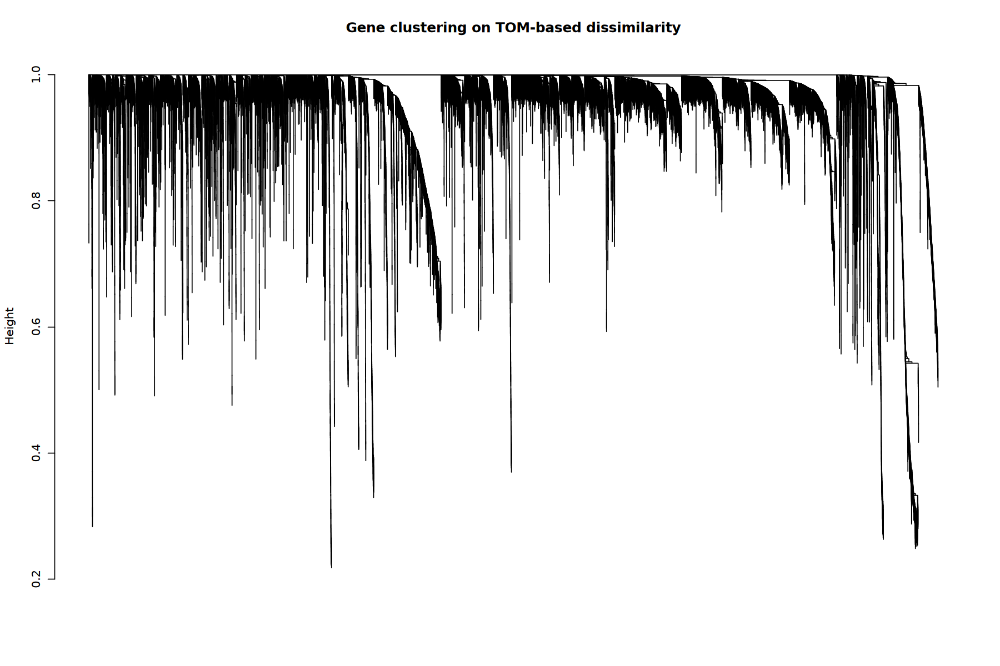

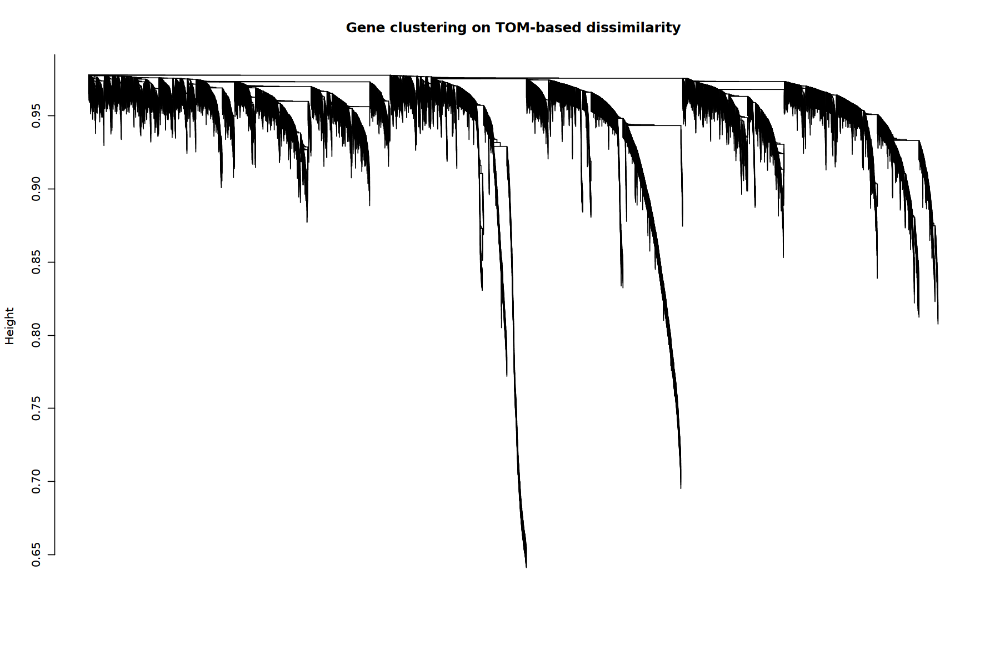

In [24]:
# call hierarchical clustering function
geneTree_unsign = hclust(as.dist(dissTOM_unsign), method = "average")
geneTree_sign = hclust(as.dist(dissTOM_sign), method = "average")

# plot the dendrogram
plot(geneTree_unsign, xlab="", sub="", main = "Gene clustering on TOM-based dissimilarity",labels = FALSE, hang = 0.04)
plot(geneTree_sign, xlab="", sub="", main = "Gene clustering on TOM-based dissimilarity",labels = FALSE, hang = 0.04)

looks like the signed adjacency matrix resulted in more distinct leafs than the unsigned matrix ...

from here on out, I'm going to use the ***signed*** correlation matrix

each leaf (short vertical line) corresponds to a gene - branches group together densely interconnected, highly co-expressed genes

module identification = cutting branches off the dendrogram

### E. module identification

set minimum module size - this is the smallest number of genes allowed to be put into a module 

then use Dynamic Tree Cut which is the default method for branch cutting and module detection

In [25]:
# would like large modules, so we set the minimum module size relatively high:
minModuleSize <- 100

## SIGNED
# Module identification using dynamic tree cut:
dynamicMods_sign <- cutreeDynamic(dendro = geneTree_sign, distM = dissTOM_sign, 
                             deepSplit = 2, pamRespectsDendro = FALSE,
                             minClusterSize = minModuleSize)
table(dynamicMods_sign) # number of genes per module

 ..cutHeight not given, setting it to 0.977  ===>  99% of the (truncated) height range in dendro.
 ..done.


dynamicMods_sign
   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
3500 2749 2677 2289 2021 1962 1399 1281  880  716  586  404  398  380  320  164 

16 modules generated

convert numeric network to colors and plots dendrogram:

dynamicColors_sign
       black         blue        brown         cyan        green  greenyellow 
        1399         2749         2677          380         2021          586 
   lightcyan      magenta midnightblue         pink       purple          red 
         164          880          320         1281          716         1962 
      salmon          tan    turquoise       yellow 
         398          404         3500         2289 

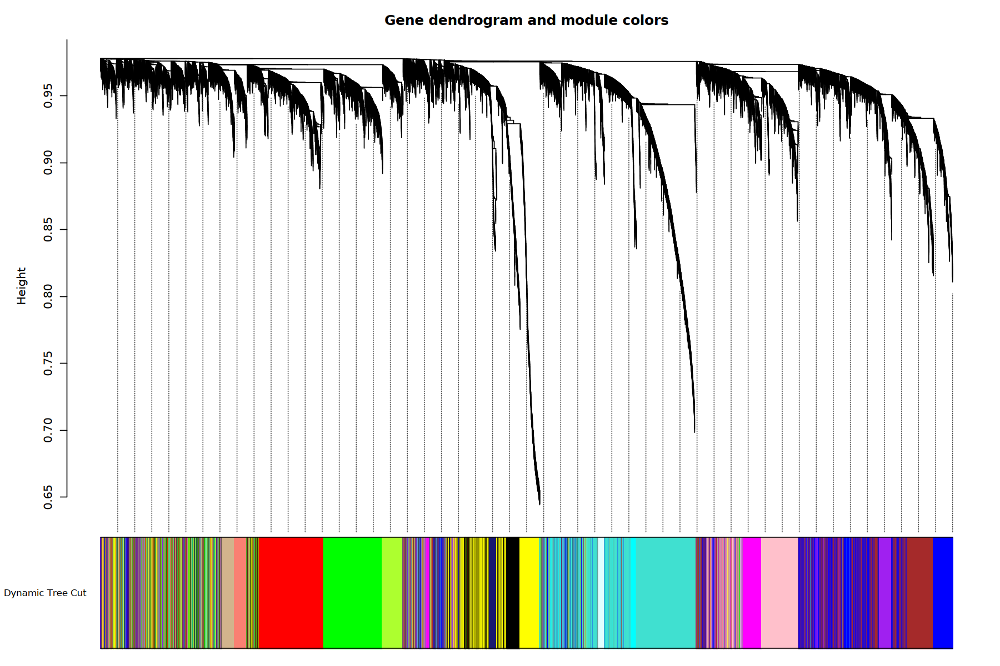

In [26]:
## SIGNED
# Convert numeric lables into colors
dynamicColors_sign <- labels2colors(dynamicMods_sign)
table(dynamicColors_sign)

# Plot the dendrogram and colors underneath
plotDendroAndColors(geneTree_sign, dynamicColors_sign, "Dynamic Tree Cut",
                    dendroLabels = FALSE, hang = 0.03,
                    addGuide = TRUE, guideHang = 0.05,
                    main = "Gene dendrogram and module colors")


### F. merging modules whose GE profiles are similar

this is based on eigengenes, which is the first principal component of a given a gene expression matrix/module that acts as a representative summary profile for a gene module or cluster

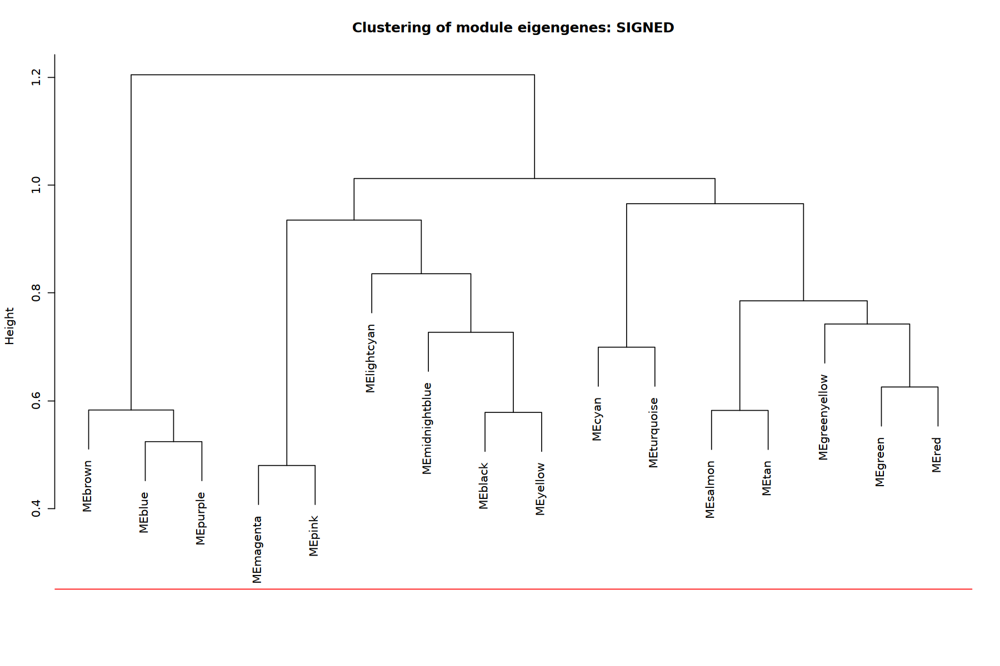

In [27]:
## SIGNED
# Calculate eigengenes
MEList_sign <- moduleEigengenes(dataExpr, colors = dynamicColors_sign)
MEs_sign <- MEList_sign$eigengenes

# Calculate dissimilarity of module eigengenes
MEDiss_sign <- 1-cor(MEs_sign)

# Cluster module eigengenes
METree_sign <- hclust(as.dist(MEDiss_sign), method = "average")

# Plot the result

# height cutoff of 0.25 - corresponds to a correlation of 0.75 to merge
MEDissThres <- 0.25

# Plot the cut line into the dendrogram
plot(METree_sign, main = "Clustering of module eigengenes: SIGNED", xlab = "", sub = "")
abline(h=MEDissThres, col = "red")

any branch with more than 75% correlation are related and will be merged - so blue and purple modules will be merged

 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.


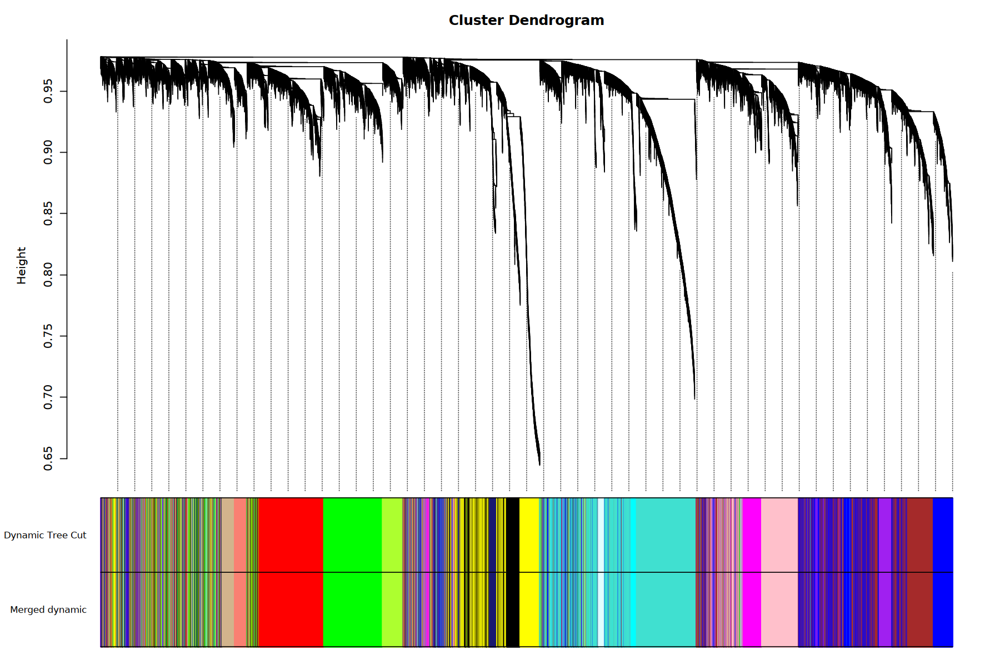

In [28]:
options(repr.plot.width = 15, repr.plot.height = 10)

## SIGNED
# Call an automatic merging function
merge_sign <- mergeCloseModules(dataExpr, dynamicColors_sign, cutHeight = MEDissThres, verbose = 3)

# The merged module colors
mergedColors_sign <- merge_sign$colors

# Eigengenes of the new merged modules:
mergedMEs_sign <- merge_sign$newMEs

# plot merged module colors
plotDendroAndColors(geneTree_sign, cbind(dynamicColors_sign, mergedColors_sign), 
                    c("Dynamic Tree Cut", "Merged dynamic"),
                    dendroLabels = FALSE, hang = 0.03,
                    addGuide = TRUE, guideHang = 0.05)


In [29]:
png("/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/plots/mergedColors_dendrogram_p2.png", 
    width = 20, height = 12, units = "in", res = 300)

plotDendroAndColors(geneTree_sign, cbind(dynamicColors_sign, mergedColors_sign),
                     c("Dynamic Tree Cut", "Merged dynamic"),
                     dendroLabels = FALSE, hang = 0.03,
                     addGuide = TRUE, guideHang = 0.05)
dev.off()

png 
  2

In [30]:
table(mergedColors_sign)

mergedColors_sign
       black         blue        brown         cyan        green  greenyellow 
        1399         2749         2677          380         2021          586 
   lightcyan      magenta midnightblue         pink       purple          red 
         164          880          320         1281          716         1962 
      salmon          tan    turquoise       yellow 
         398          404         3500         2289 

16 co-expression modules with between 164 and 2749 genes

In [31]:
# write.csv(mergedColors_sign, '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/mergedColors_sign.csv', row.names = FALSE)

## 3. quantifying module-trait associations
identify modules that are significantly associated with treatment exposures or measured traits (like growth)

### A. read in and format metadata

both treatment metadata and growth data

#### treatment data

In [32]:
# read in phase info
dataMeta <- read.csv('/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/metaData/sample_metaData.csv') %>%
filter(!grepl('Nu', Sample))

# add missing rep number to sample name
dataMeta$Sample[dataMeta$Sample == "C_W5_W52"] <- "C2_W5_W52"

# fix wrong rep number to sample name
dataMeta$Sample[dataMeta$Sample == 'W2_B2_G04'] <- 'W2_B1_G04'

# keep only the samples seen in dataExpr
dataMeta <- dataMeta[dataMeta$Sample %in% rownames(dataExpr),]

# create combo trtmt column
dataMeta$combo_trtmt <- paste0(dataMeta$Phase1_treatment, '_', dataMeta$Phase2_treatment)


# check it out
dim(dataMeta)
head(dataMeta)


[1] 92 10

,Sample,Phase1_treatment,Phase1_temp,Phase1_DO,Phase1_TankRep,Phase2_treatment,Phase2_temp,Phase2_DO,Phase2_TankRep,combo_trtmt
,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<chr>
1,B1_B1_O01,both,warm,hypoxic,1,both,warm,hypoxic,1,both_both
2,B1_W5_O50,both,warm,hypoxic,1,warm,warm,normoxic,5,both_warm
3,B2_B5_O51,both,warm,hypoxic,2,both,warm,hypoxic,5,both_both
4,B2_C4_O40,both,warm,hypoxic,2,control,ambient,normoxic,4,both_control
5,B3_B4_O41,both,warm,hypoxic,3,both,warm,hypoxic,4,both_both
6,B3_C3_O30,both,warm,hypoxic,3,control,ambient,normoxic,3,both_control


values have to be numerical, so going to create a code for my treatments:

**phase 1 and 2 treatments**
1. control
2. warm
3. hypoxic
4. both

**temperature**
1. ambient
2. warm

**dissolved oxygen**
1. normoxic
2. hypoxic

In [53]:
# set factors
dataMeta$Phase1_treatment <- factor(dataMeta$Phase1_treatment, c('control', 'warm', 'hypoxic', 'both'))
dataMeta$Phase1_temp <- factor(dataMeta$Phase1_temp, c('ambient', 'warm'))
dataMeta$Phase1_DO <- factor(dataMeta$Phase1_DO, c('normoxic', 'hypoxic'))

dataMeta$Phase2_treatment <- factor(dataMeta$Phase2_treatment, c('control', 'warm', 'hypoxic', 'both'))
dataMeta$Phase2_temp <- factor(dataMeta$Phase2_temp, c('ambient', 'warm'))
dataMeta$Phase2_DO <- factor(dataMeta$Phase2_DO, c('normoxic', 'hypoxic'))

# convert categorical to numerical code for treatment info
### PHASE 1
dataMeta$P1_trtmt_code <- as.numeric(factor(dataMeta$Phase1_treatment))
dataMeta$P1_temp_code <- as.numeric(factor(dataMeta$Phase1_temp))
dataMeta$P1_DO_code <- as.numeric(factor(dataMeta$Phase1_DO))
### PHASE 2
dataMeta$P2_trtmt_code <- as.numeric(factor(dataMeta$Phase2_treatment))
dataMeta$P2_temp_code <- as.numeric(factor(dataMeta$Phase2_temp))
dataMeta$P2_DO_code <- as.numeric(factor(dataMeta$Phase2_DO))

# select only columns needed
metaData <- dataMeta[,-c(2:10)]

# set sample names as rownames
rownames(metaData) <- metaData$Sample
metaData <- metaData %>% select(-Sample)

dim(metaData)
head(metaData)


[1] 92  6

,P1_trtmt_code,P1_temp_code,P1_DO_code,P2_trtmt_code,P2_temp_code,P2_DO_code
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,4,2,2,4,2,2
B1_W5_O50,4,2,2,2,2,1
B2_B5_O51,4,2,2,4,2,2
B2_C4_O40,4,2,2,1,1,1
B3_B4_O41,4,2,2,4,2,2
B3_C3_O30,4,2,2,1,1,1


also creating binary variables for phase 1 and 2 treatments, so phase 1 both 0/1 (N/Y)

In [54]:
#### PHASE 1 ####
phase1.treatments <- dataMeta %>%
  select(Sample, Phase1_treatment) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase1_treatment,
    values_from = value,
    values_fill = list(value = 0)
  ) %>%
  rename_with(~ paste0("P1_", .x), -Sample)
head(phase1.treatments)

#### PHASE 2 ####
phase2.treatments <- dataMeta %>%
  select(Sample, Phase2_treatment) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase2_treatment,
    values_from = value,
    values_fill = list(value = 0)
  ) %>%
  rename_with(~ paste0("P2_", .x), -Sample)
head(phase2.treatments)

#### MERGE ####
trtmt_bin <- merge(phase1.treatments, phase2.treatments, by = 'Sample') %>%
column_to_rownames(var = 'Sample')
head(trtmt_bin)

Sample,P1_both,P1_control,P1_hypoxic,P1_warm
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,1,0,0,0
B1_W5_O50,1,0,0,0
B2_B5_O51,1,0,0,0
B2_C4_O40,1,0,0,0
B3_B4_O41,1,0,0,0
B3_C3_O30,1,0,0,0


Sample,P2_both,P2_warm,P2_control,P2_hypoxic
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,1,0,0,0
B1_W5_O50,0,1,0,0
B2_B5_O51,1,0,0,0
B2_C4_O40,0,0,1,0
B3_B4_O41,1,0,0,0
B3_C3_O30,0,0,1,0


,P1_both,P1_control,P1_hypoxic,P1_warm,P2_both,P2_warm,P2_control,P2_hypoxic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,1,0,0,0,1,0,0,0
B1_W5_O50,1,0,0,0,0,1,0,0
B2_B5_O51,1,0,0,0,1,0,0,0
B2_C4_O40,1,0,0,0,0,0,1,0
B3_B4_O41,1,0,0,0,1,0,0,0
B3_C3_O30,1,0,0,0,0,0,1,0


add this to the meta data df

In [56]:
metaData2 <- merge(metaData, trtmt_bin, by = 0) %>%
column_to_rownames(var = 'Row.names')
head(metaData2)

,P1_trtmt_code,P1_temp_code,P1_DO_code,P2_trtmt_code,P2_temp_code,P2_DO_code,P1_both,P1_control,P1_hypoxic,P1_warm,P2_both,P2_warm,P2_control,P2_hypoxic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,4,2,2,4,2,2,1,0,0,0,1,0,0,0
B1_W5_O50,4,2,2,2,2,1,1,0,0,0,0,1,0,0
B2_B5_O51,4,2,2,4,2,2,1,0,0,0,1,0,0,0
B2_C4_O40,4,2,2,1,1,1,1,0,0,0,0,0,1,0
B3_B4_O41,4,2,2,4,2,2,1,0,0,0,1,0,0,0
B3_C3_O30,4,2,2,1,1,1,1,0,0,0,0,0,1,0


In [57]:
metaData <- metaData2

#### growth data

In [58]:
p2_growth <- read.csv('/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/metaData/growth_phase2.1_weights.csv')

# add leading zeros to single digit tag num
p2_growth$Tag_num <- sprintf("%02d", p2_growth$Tag_num)

# make sample names same as my convention
p1_str <- str_sub(p2_growth$Phase_1_treat, 1, 1)
p2_str <- str_sub(p2_growth$Phase_2_treat, 1, 1)
p2_growth$Sample <- paste0(p1_str, p2_growth$Phase_1_rep, '_', p2_str, p2_growth$Phase_2_rep, '_', p2_growth$Tag_color, p2_growth$Tag_num)
head(p2_growth$Sample)

# pull out growth data for matching samples
p2_growth.df <- p2_growth[p2_growth$Sample %in% rownames(metaData), ]

# check it out
dim(p2_growth.df) # 91 samples
dim(metaData) # 93 samples

[1] "B1_B1_O01" "B1_B1_O02" "B1_B2_O13" "B1_B2_O14" "B1_B3_O25" "B1_B3_O26"

[1] 92 33

[1] 92 14

In [59]:
metaData[!rownames(metaData) %in% p2_growth.df$Sample,]

P1_trtmt_code,P1_temp_code,P1_DO_code,P2_trtmt_code,P2_temp_code,P2_DO_code,P1_both,P1_control,P1_hypoxic,P1_warm,P2_both,P2_warm,P2_control,P2_hypoxic
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


In [60]:
head(dataMeta)

,Sample,Phase1_treatment,Phase1_temp,Phase1_DO,Phase1_TankRep,Phase2_treatment,Phase2_temp,Phase2_DO,Phase2_TankRep,combo_trtmt,P1_trtmt_code,P1_temp_code,P1_DO_code,P2_trtmt_code,P2_temp_code,P2_DO_code
,<chr>,<fct>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,B1_B1_O01,both,warm,hypoxic,1,both,warm,hypoxic,1,both_both,4,2,2,4,2,2
2,B1_W5_O50,both,warm,hypoxic,1,warm,warm,normoxic,5,both_warm,4,2,2,2,2,1
3,B2_B5_O51,both,warm,hypoxic,2,both,warm,hypoxic,5,both_both,4,2,2,4,2,2
4,B2_C4_O40,both,warm,hypoxic,2,control,ambient,normoxic,4,both_control,4,2,2,1,1,1
5,B3_B4_O41,both,warm,hypoxic,3,both,warm,hypoxic,4,both_both,4,2,2,4,2,2
6,B3_C3_O30,both,warm,hypoxic,3,control,ambient,normoxic,3,both_control,4,2,2,1,1,1


i think C_W5_W52 should be **C2_W5_W52** actually and W2_B2_G04 should be **W2_B1_G04**

changing the names in both metaData and dataExpr 

In [61]:
rownames(dataMeta) <- dataMeta$Sample

# add missing rep number to sample name
rownames(dataExpr)[rownames(dataExpr) == 'C_W5_W52'] <- 'C2_W5_W52'
rownames(metaData)[rownames(metaData) == 'C_W5_W52'] <- 'C2_W5_W52'
rownames(dataMeta)[rownames(dataMeta) == 'C_W5_W52'] <- 'C2_W5_W52'

# fix wrong rep number to sample name
rownames(dataExpr)[rownames(dataExpr) == 'W2_B2_G04'] <- 'W2_B1_G04'
rownames(metaData)[rownames(metaData) == 'W2_B2_G04'] <- 'W2_B1_G04'
rownames(dataMeta)[rownames(dataMeta) == 'W2_B2_G04'] <- 'W2_B1_G04'

pulling out the growth data now - should be the same number of samples ...

In [62]:
# pull out growth data for matching samples
p2_growth.df2 <- p2_growth[p2_growth$Sample %in% rownames(metaData), ]

# check it out
dim(p2_growth.df2) # 93 samples
dim(metaData) # 93 samples

[1] 92 33

[1] 92 14

so all good now with matching sample names!

now pulling out only the growth columns and merging with the other meta data df 

In [63]:
# select growth columns
p2_growth.df2 <- p2_growth.df2 %>%
select(Sample, Actual_shell_growth_mg, Actual_tissue_growth_mg, Ratio_tissue_shell_mg)

# sample is the rowname
rownames(p2_growth.df2) <- p2_growth.df2$Sample
p2_growth.df2 <- p2_growth.df2 %>% select(-Sample)


head(p2_growth.df2)

,Actual_shell_growth_mg,Actual_tissue_growth_mg,Ratio_tissue_shell_mg
,<dbl>,<dbl>,<chr>
B1_B1_O01,210.2755,120.72448,0.574125224
B1_W5_O50,315.8883,85.61170,0.271018901
B2_B5_O51,114.3215,44.47852,0.389065292
B2_C4_O40,164.9903,55.10972,0.33401798
B3_B4_O41,197.9250,116.17500,0.586964759
B3_C3_O30,316.0466,241.35336,0.763663743


#### merge growth and treatment data

In [78]:
# merge dfs
metaData_merge <- merge(p2_growth.df2, metaData, by = 'row.names')

# set samples as rownames
metaData_merge <- metaData_merge %>% 
column_to_rownames(var = 'Row.names')

dim(metaData_merge)
head(metaData_merge)

[1] 92 17

,Actual_shell_growth_mg,Actual_tissue_growth_mg,Ratio_tissue_shell_mg,P1_trtmt_code,P1_temp_code,P1_DO_code,P2_trtmt_code,P2_temp_code,P2_DO_code,P1_both,P1_control,P1_hypoxic,P1_warm,P2_both,P2_warm,P2_control,P2_hypoxic
,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,210.2755,120.72448,0.574125224,4,2,2,4,2,2,1,0,0,0,1,0,0,0
B1_W5_O50,315.8883,85.61170,0.271018901,4,2,2,2,2,1,1,0,0,0,0,1,0,0
B2_B5_O51,114.3215,44.47852,0.389065292,4,2,2,4,2,2,1,0,0,0,1,0,0,0
B2_C4_O40,164.9903,55.10972,0.33401798,4,2,2,1,1,1,1,0,0,0,0,0,1,0
B3_B4_O41,197.9250,116.17500,0.586964759,4,2,2,4,2,2,1,0,0,0,1,0,0,0
B3_C3_O30,316.0466,241.35336,0.763663743,4,2,2,1,1,1,1,0,0,0,0,0,1,0


In [79]:
# define # of genes and samples
nSamples <- nrow(dataExpr) # 92 samples
nGenes <- ncol(dataExpr) # 21,726 genes

eigengene ~ summary profile of the module

now can correlate eigengenes with external traits and look for most significant associations

growth meaning the growth from the beginning of phase 2 to the end of phase 2 - we do not have data on these oysters' growth before and after phase 1. The ratio of tissue to shell growth is a proxy for fitness (more tissue = investing in reproduction, more shell = investing in defense)

### B. plot module-trait relationships

In [80]:
# Recalculate MEs (module eigengenes) with color labels

MEs0 <- moduleEigengenes(dataExpr, mergedColors_sign)$eigengenes # create module eigengenes

MEs <- orderMEs(MEs0) # order so more similar modules are closer together

moduleTraitCor <- cor(MEs, metaData_merge, use = "p") # correlate with traits - using Pearson correlations

moduleTraitPvalue <- corPvalueStudent(moduleTraitCor, nSamples) # compute p-values - uses student's t-distribution

In [81]:
# convert correlation matrix to df
cor.df <- as.data.frame(moduleTraitCor) %>% 
  rownames_to_column(var = "module") %>% 
pivot_longer(cols = !'module',
             names_to = 'Trait',
             values_to = 'Cor')

head(cor.df)

module,Trait,Cor
<chr>,<chr>,<dbl>
MEbrown,Actual_shell_growth_mg,0.274957044
MEbrown,Actual_tissue_growth_mg,0.234808463
MEbrown,Ratio_tissue_shell_mg,0.051299543
MEbrown,P1_trtmt_code,-0.009668209
MEbrown,P1_temp_code,-0.056221790
MEbrown,P1_DO_code,0.017402089


In [82]:
# convert pvalue matrix to df
pval.df <- as.data.frame(moduleTraitPvalue) %>% 
  rownames_to_column(var = "module") %>% 
pivot_longer(cols = !'module',
             names_to = 'Trait',
             values_to = 'pvalue')

head(pval.df)

module,Trait,pvalue
<chr>,<chr>,<dbl>
MEbrown,Actual_shell_growth_mg,0.00798814
MEbrown,Actual_tissue_growth_mg,0.02425861
MEbrown,Ratio_tissue_shell_mg,0.62722223
MEbrown,P1_trtmt_code,0.92712041
MEbrown,P1_temp_code,0.59451223
MEbrown,P1_DO_code,0.86922321


In [90]:
# merge the two dfs
module.df <- cor.df %>%
left_join(pval.df, by = c('module', 'Trait')) %>%
# add vol to denote significance for bold labeling
mutate(
    label = sprintf("%.2f\n(%.1g)", Cor, pvalue),
    sig = !is.na(pvalue) & pvalue < 0.05
  )

module.df <- module.df %>%
  mutate(
    Trait = factor(Trait, levels = sort(unique(Trait))),
    module = factor(module, levels = sort(unique(module)))
  )

head(module.df)

module,Trait,Cor,pvalue,label,sig
<fct>,<fct>,<dbl>,<dbl>,<chr>,<lgl>
MEbrown,Actual_shell_growth_mg,0.274957044,0.00798814,0.27 (0.008),TRUE
MEbrown,Actual_tissue_growth_mg,0.234808463,0.02425861,0.23 (0.02),TRUE
MEbrown,Ratio_tissue_shell_mg,0.051299543,0.62722223,0.05 (0.6),FALSE
MEbrown,P1_trtmt_code,-0.009668209,0.92712041,-0.01 (0.9),FALSE
MEbrown,P1_temp_code,-0.056221790,0.59451223,-0.06 (0.6),FALSE
MEbrown,P1_DO_code,0.017402089,0.86922321,0.02 (0.9),FALSE


In [103]:
unique(module.df$Trait)

[1] Actual_shell_growth_mg  Actual_tissue_growth_mg Ratio_tissue_shell_mg  
 [4] P1_trtmt_code           P1_temp_code            P1_DO_code             
 [7] P2_trtmt_code           P2_temp_code            P2_DO_code             
[10] P1_both                 P1_control              P1_hypoxic             
[13] P1_warm                 P2_both                 P2_warm                
[16] P2_control              P2_hypoxic             
17 Levels: Actual_shell_growth_mg Actual_tissue_growth_mg ... Ratio_tissue_shell_mg

In [106]:
df.clean <- module.df %>%
  mutate(Trait = case_match(Trait,
                           "Actual_shell_growth_mg" ~ "Shell Growth",
                           "Actual_tissue_growth_mg" ~ "Tissue Growth",
                            "Ratio_tissue_shell_mg" ~ "Tissue:Shell Growth",
                            "P1_trtmt_code" ~ "Phase 1 Interaction",
                            "P2_trtmt_code" ~ "Phase 2 Interaction",
                            "P1_temp_code" ~ "Phase 1 Temp",
                            "P2_temp_code" ~ "Phase 2 Temp",
                            "P1_DO_code" ~ "Phase 1 DO",
                            "P2_DO_code" ~ "Phase 2 DO",
                           .default = Trait)) %>% # Keeps unchanged values as they are
# add col that denotes if the trait is for treatment or growth data
mutate(trait_type = ifelse(
    grepl('Growth', Trait),
    'Phase 2 Growth',
    'Treatments'
    )
       )

head(df.clean)

module,Trait,Cor,pvalue,label,sig,trait_type
<fct>,<chr>,<dbl>,<dbl>,<chr>,<lgl>,<chr>
MEbrown,Shell Growth,0.274957044,0.00798814,0.27 (0.008),TRUE,Phase 2 Growth
MEbrown,Tissue Growth,0.234808463,0.02425861,0.23 (0.02),TRUE,Phase 2 Growth
MEbrown,Tissue:Shell Growth,0.051299543,0.62722223,0.05 (0.6),FALSE,Phase 2 Growth
MEbrown,Phase 1 Interaction,-0.009668209,0.92712041,-0.01 (0.9),FALSE,Treatments
MEbrown,Phase 1 Temp,-0.056221790,0.59451223,-0.06 (0.6),FALSE,Treatments
MEbrown,Phase 1 DO,0.017402089,0.86922321,0.02 (0.9),FALSE,Treatments


In [107]:
unique(df.clean$Trait)

[1] "Shell Growth"        "Tissue Growth"       "Tissue:Shell Growth"
 [4] "Phase 1 Interaction" "Phase 1 Temp"        "Phase 1 DO"         
 [7] "Phase 2 Interaction" "Phase 2 Temp"        "Phase 2 DO"         
[10] "P1_both"             "P1_control"          "P1_hypoxic"         
[13] "P1_warm"             "P2_both"             "P2_warm"            
[16] "P2_control"          "P2_hypoxic"

In [108]:
# making a copy of the above df
df.clean2 <- df.clean

saving df above as csv so I don't have to run all of the code to edit the heatmap

In [73]:
# write.csv(df.clean, '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/heatmap_data.csv', row.names = FALSE)

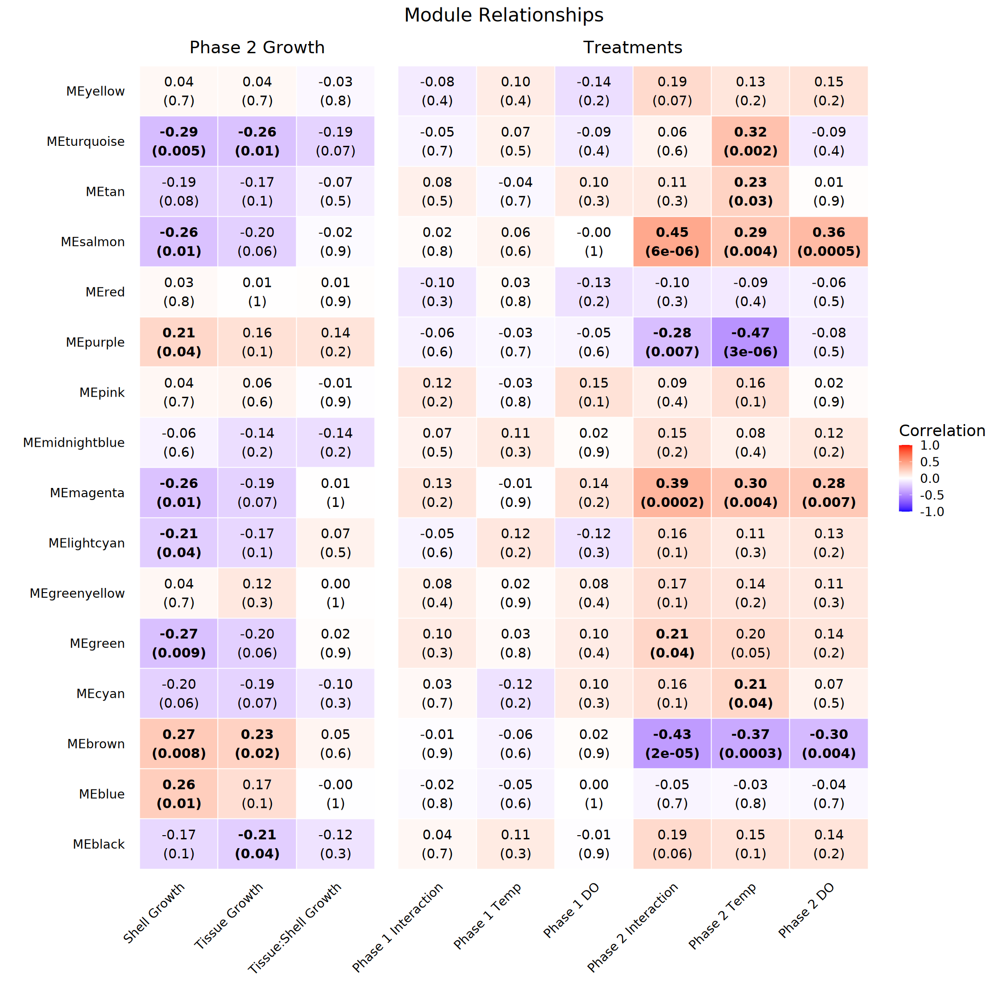

In [97]:
options(repr.plot.width = 18, repr.plot.height = 18)

# reorder x-axis
trait_order <- c("Shell Growth", "Tissue Growth", "Tissue:Shell Growth", "Phase 1 Interaction", "Phase 1 Temp", "Phase 1 DO", "Phase 2 Interaction", "Phase 2 Temp", "Phase 2 DO")
df.clean$Trait <- factor(df.clean$Trait, levels = trait_order)
# remove binary treatment bins - going to plot seperately
df.clean <- na.omit(df.clean)

heatmap1 <- ggplot(df.clean, aes(x = Trait, y = module, fill = Cor)) +
  geom_tile(color = "white") +
  
  # text annotations
  geom_text(
    aes(
      label = label,
      fontface = ifelse(sig, "bold", "plain")
    ),
    size = 6
  ) +
  
  scale_fill_gradient2(
    low = "blue",
    mid = "white",
    high = "red",
    limits = c(-1, 1)
  ) +

  facet_grid(
    ~ trait_type,
    scales = "free_x",
    space = "free_x"
  ) +

  theme_minimal(base_size = 20) +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, color = 'black'),
      axis.text.y = element_text(color = 'black'),
    panel.grid = element_blank(),
      plot.title = element_text(hjust = .5),
      strip.text = element_text(color = 'black', size = 22)
  ) +
  
  labs(
    title = "Module Relationships",
    x = "",
    y = "",
    fill = "Correlation"
  )

heatmap1

In [90]:
ggsave(
  filename = "/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/plots/module_trait_heatmap.png",
  plot = heatmap1,
  width = 18,
  height = 18,
  dpi = 300
)

#### binary treatments
now adding in the binary variables for phase 1 and 2 treatments

In [114]:
df.clean2 <- df.clean2 %>%
mutate(phase = ifelse(
    grepl('P1', Trait),
    'Phase 1 Treatment',
    'Phase 2 Treatment'
    )
       )

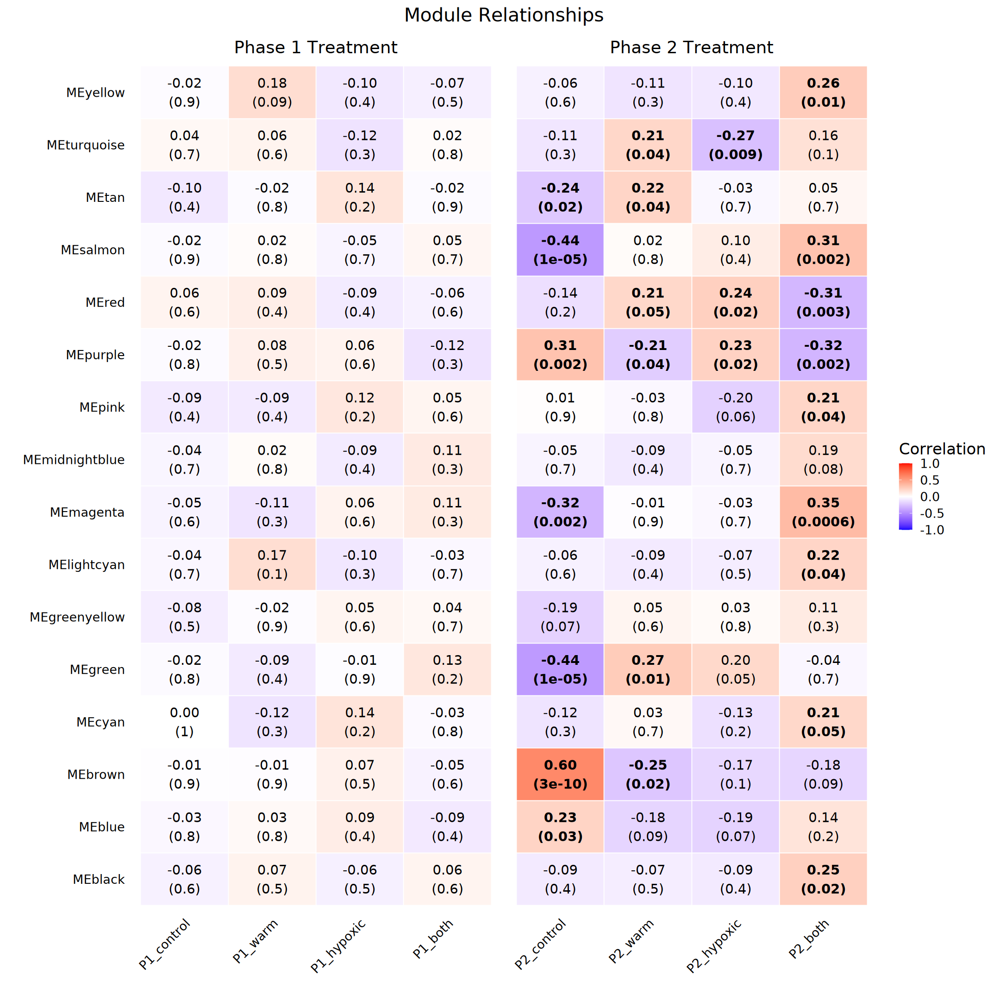

In [115]:
# reorder x-axis
trait_order <- c("P1_control", "P1_warm", "P1_hypoxic", "P1_both", "P2_control", "P2_warm", "P2_hypoxic", "P2_both")
df.clean2$Trait <- factor(df.clean2$Trait, levels = trait_order)
# remove binary treatment bins - going to plot seperately
df.clean2 <- na.omit(df.clean2)

heatmap_bin <- ggplot(df.clean2, aes(x = Trait, y = module, fill = Cor)) +
  geom_tile(color = "white") +
  
  # text annotations
  geom_text(
    aes(
      label = label,
      fontface = ifelse(sig, "bold", "plain")
    ),
    size = 6
  ) +
  
  scale_fill_gradient2(
    low = "blue",
    mid = "white",
    high = "red",
    limits = c(-1, 1)
  ) +

  facet_grid(
    ~ phase,
    scales = "free_x",
    space = "free_x"
  ) +

  theme_minimal(base_size = 20) +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, color = 'black'),
      axis.text.y = element_text(color = 'black'),
    panel.grid = element_blank(),
      plot.title = element_text(hjust = .5),
      strip.text = element_text(color = 'black', size = 22)
  ) +
  
  labs(
    title = "Module Relationships",
    x = "",
    y = "",
    fill = "Correlation"
  )

heatmap_bin

okay so yea, still don't see any modules that are significantly correlated with phase 1 treatments, even when we break it down. 

We do see some modules that are significantly correlated with specific treatments 
- yellow -> higher expression in p2 both compared to all other treatments
- turquoise -> higher expression in p2 warmer, lower expression in p2 hypoxic compared to all other treatments
- tan -> lower expression in p2 control, higher expression in p2 warm
- salmon -> lower expression in p2 control, higher expression in p2 both
- red -> higher expression in p2 warm and hypoxic, lower expression in p2 both (difference between single and multiple stressors?)
- purple -> higher expression in p2 control and hypoxic, lower expression in p2 warm and both (driven by temp treatment)
- pink -> highr expression in p2 both
- magenta -> lower expression in p2 control, higher in p2 both
- lightcyan -> higher expression in p2 both
- green -> lower expression in p2 control, higher expression in p2 warm
- cyan -> higher expression in p2 both
- brown -> higher expression in p2 control, lower expression in p2 warm
- blue -> higher expression in p2 control
- black -> higher expression in p2 both

so now we can see more clearly what's "under the hood" of the heatmap before (when we see phase 2 interaction, phase 2 temp and DO all correlated (like in salmon and magenta), it's bc we see a correlation with control treatment and both treatment)

it would be interesting to look more into the turquoise and purple modules, as the warm and hypoxic treatments have opposing correlations with these modules

In [116]:
ggsave(
  filename = "/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/plots/binary_treatments_heatmap.png",
  plot = heatmap_bin,
  width = 18,
  height = 18,
  dpi = 300
)

#### old heatmap

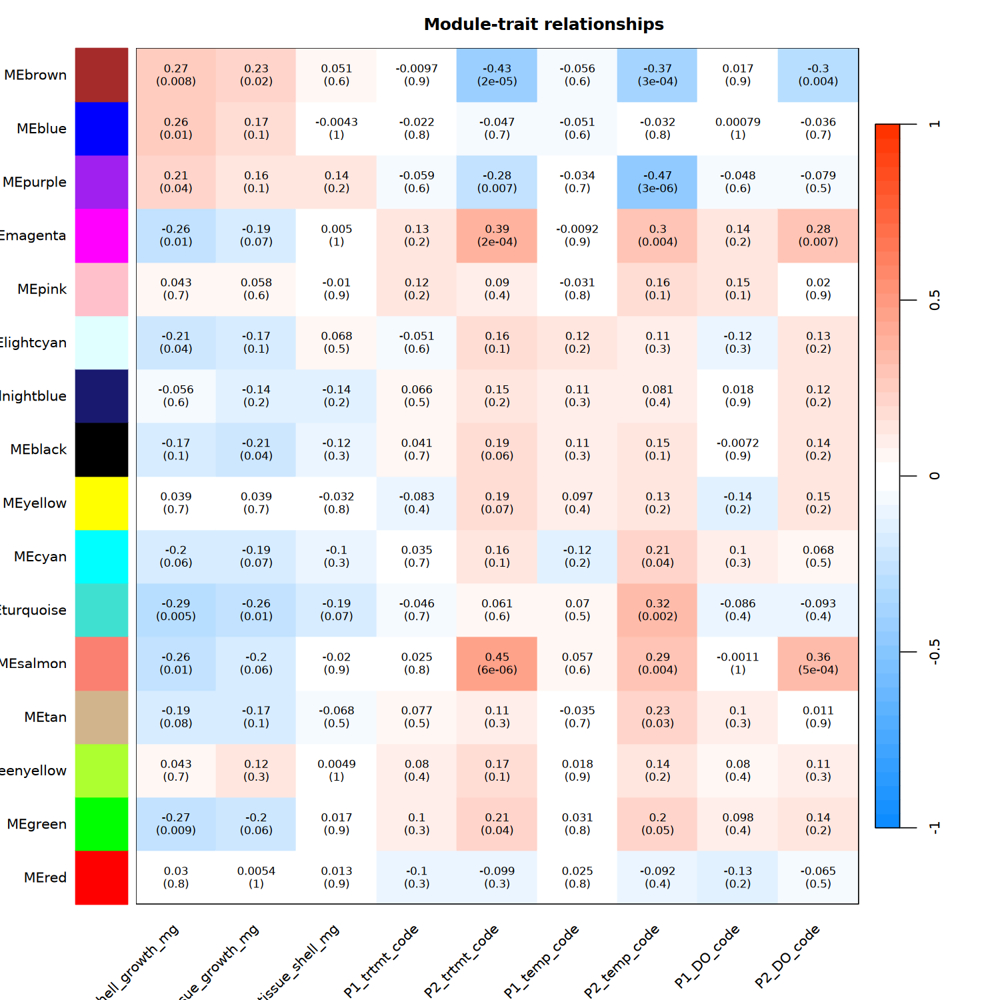

In [51]:
options(repr.plot.width = 12.5, repr.plot.height = 12.5)

# Will display correlations and their p-values
textMatrix = paste(signif(moduleTraitCor, 2), "\n(",
signif(moduleTraitPvalue, 1), ")", sep = "");
dim(textMatrix) = dim(moduleTraitCor)
par(mar = c(6, 8.5, 3, 3))

# Display the correlation values within a heatmap plot
labeledHeatmap(Matrix = moduleTraitCor, 
               xLabels = names(metaData_merge), 
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = FALSE,
               colors = blueWhiteRed(50),
               textMatrix = textMatrix,
               setStdMargins = FALSE,
               cex.text = 0.8,
               zlim = c(-1,1),
               main = paste("Module-trait relationships"))

each row corresponds to a module eigengene, column to a treatment

each cell contains the corresponding correlation and p-value and the table is colored by correlation (in my case, I've assigned numerical codes to categorical treatments, with the control/normoxic/ambient treatment always being 1)

red cells indicate positive correlation, blue cells a negative correlation - looking for dark cells with significant pvalues to identify module of interest

**specifically looking for...**:
- modules with opposing relationships between phase 1 and phase 2 (whether that's DO, temp, or treatment altogether; can also be growth as in red for tissue but blue for shell)
- modules with significant relationships (number within the paratheses)

**observations**:
- none of the modules have a significant relationship with p1_treatment or p1_DO, which makes sense since these samples were taken after p2 and we expect most GE to be short-term
    - there are 5 modules with a sig. relationship with p2_treatment (three red and two blue)
- there are 3 modules with a sig. relationship with a DO treatment (cols 8 and 9) and 7 modules with a significant relationship with a temp treatment (cols 6 and 7)
- there are a few modules with sig. relationships with tissue/shell growth, and they're in the same direction for tissue and shell
    - there are a few modules with a sig. relationship with the ratio of tissue to shell growth

based on this, **potentially interesting modules include**:
>I've *italicized* the module that is more correlated/significant to that treatment
- for **P2_trtmt_code**: salmon, magenta, purple, and brown
- for **P2_Temp_code**: *purple*, *brown*, salmon, turquoise, and magenta
- for **P2_DO_code**: brown, magenta, and *salmon*
- for **Actual_shell_growth_mg**: green, salmon, turquoise,magenta, purple, *brown*, and blue
- for **Actual_tissue_growth_mg**: turquoise, black, and brown

Ratio_tissue_shell_mg and all phase 1 treatments do not have significantly correlated modules


In [52]:
# write csv to save the module eigengenes
# write.csv(MEs, '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/p2.wgcna_ModuleEigengenes.csv')

#### module-trait relationship splitting phase 1 and 2 treatments

In [54]:
MEs <- read.csv('/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/outputs/p2.wgcna_ModuleEigengenes.csv')
rownames(MEs) <- MEs$X

MEs <- MEs %>% select(-X)

head(MEs)

,MEbrown,MEblue,MEpurple,MEmagenta,MEpink,MElightcyan,MEmidnightblue,MEblack,MEyellow,MEcyan,MEturquoise,MEsalmon,MEtan,MEgreenyellow,MEgreen,MEred
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,-0.05849966,-0.091507241,-0.046383222,0.029079895,-0.02910824,-0.026993807,-0.02027625,0.09527726,-0.009088363,-0.0222437823,-0.047011013,0.01407665,0.01790311,-0.01699436,0.087736548,0.02518399
B1_W5_O50,0.07065197,-0.024330329,-0.004833681,-0.007201007,0.08138226,-0.052993061,-0.03126938,-0.07475125,-0.039276498,0.0052880195,-0.010886001,-0.10857808,-0.05758283,-0.08493171,0.024283688,-0.09424424
B2_B5_O51,0.06883685,-0.001215575,0.013036663,0.075744188,0.13006898,-0.002711937,0.88157867,0.16184306,0.004918343,-0.0181069064,0.002249824,-0.06693028,0.02090901,-0.16106594,-0.028405348,-0.17605187
B2_C4_O40,-0.00435440,-0.061718316,0.048224681,-0.115524037,-0.07203764,-0.034267630,-0.03476630,-0.05850406,-0.029668494,-0.0119403310,-0.025606360,-0.11257028,-0.04230850,-0.04006237,0.044908345,0.09201965
B3_B4_O41,0.07461252,-0.005054312,-0.009744642,0.087575587,0.08023812,-0.043623150,-0.03280495,-0.07183334,-0.034049665,0.0004625755,-0.003941847,-0.11596153,-0.05558758,-0.04126399,0.004454491,-0.13799491
B3_C3_O30,0.09897571,0.130462677,0.112417710,-0.033174008,-0.01353279,-0.021421283,-0.03785542,-0.06721661,-0.017864185,-0.0252225845,-0.031919003,-0.02839301,-0.06667194,-0.01029188,-0.178031725,-0.09503888


In [55]:
meta <- read.csv('/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/wgcna/p2.wgcna_metadata.csv') %>%
select(-c(X, Phase1_TankRep, Phase2_TankRep, Actual_shell_growth_mg, Actual_tissue_growth_mg, Ratio_tissue_shell_mg)) %>% # remove cols we don't need like tank reps - not focusing on growth here either rn
distinct(Sample, .keep_all = TRUE) # at some point, rows got duplicated, so just keeping the distinct rows

# set rownames as sample names
rownames(meta) <- meta$Sample

# grab same samples as in dataExpr
meta <- meta[rownames(meta) %in% rownames(dataExpr),]

# check out df
dim(meta)
head(meta)

[1] 92  8

,Sample,Phase1_treatment,Phase1_temp,Phase1_DO,Phase2_treatment,Phase2_temp,Phase2_DO,combo_trtmt
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
B1_B1_O01,B1_B1_O01,both,warm,hypoxic,both,warm,hypoxic,both_both
B1_W5_O50,B1_W5_O50,both,warm,hypoxic,warm,warm,normoxic,both_warm
B2_B5_O51,B2_B5_O51,both,warm,hypoxic,both,warm,hypoxic,both_both
B2_C4_O40,B2_C4_O40,both,warm,hypoxic,control,ambient,normoxic,both_control
B3_B4_O41,B3_B4_O41,both,warm,hypoxic,both,warm,hypoxic,both_both
B3_C3_O30,B3_C3_O30,both,warm,hypoxic,control,ambient,normoxic,both_control


In [56]:
# add factors
meta$Phase1_DO <- factor(meta$Phase1_DO, c('normoxic', 'hypoxic'))
meta$Phase2_DO <- factor(meta$Phase2_DO, c('normoxic', 'hypoxic'))
meta$Phase1_temp <- factor(meta$Phase1_temp, c('ambient', 'warm'))
meta$Phase2_temp <- factor(meta$Phase2_temp, c('ambient', 'warm'))

will want to create dummy variables for WGCNA - basically 0/1 to denate yes or no to a treatment

In [57]:
# creating dummy variables

#### PHASE 1 ####
# phase 1 treatments
phase1.treatments <- meta %>%
  select(Sample, Phase1_treatment) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase1_treatment,
    values_from = value,
    values_fill = list(value = 0)
  )

head(phase1.treatments)

# phase 1 DO
phase1.DO <- meta %>%
  select(Sample, Phase1_DO) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase1_DO,
    values_from = value,
    values_fill = list(value = 0)
  )

# phase 1 temperature
phase1.temp <- meta %>%
  select(Sample, Phase1_temp) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase1_temp,
    values_from = value,
    values_fill = list(value = 0)
  )


#### PHASE 2 ####
# phase 2 treatments
phase2.treatments <- meta %>%
  select(Sample, Phase2_treatment) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase2_treatment,
    values_from = value,
    values_fill = list(value = 0)
  )

# phase 2 DO
phase2.DO <- meta %>%
  select(Sample, Phase2_DO) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase2_DO,
    values_from = value,
    values_fill = list(value = 0)
  )

# phase 2 temperature
phase2.temp <- meta %>%
  select(Sample, Phase2_temp) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = Phase2_temp,
    values_from = value,
    values_fill = list(value = 0)
  )

head(phase2.DO)

#### P1/P2 COMBO ####
combo.treatments <- meta %>%
  select(Sample, combo_trtmt) %>%
  mutate(value = 1) %>%
  pivot_wider(
    id_cols = Sample,
    names_from = combo_trtmt,
    values_from = value,
    values_fill = list(value = 0)
  )

head(combo.treatments)

Sample,both,control,hypoxic,warm
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,1,0,0,0
B1_W5_O50,1,0,0,0
B2_B5_O51,1,0,0,0
B2_C4_O40,1,0,0,0
B3_B4_O41,1,0,0,0
B3_C3_O30,1,0,0,0


Sample,hypoxic,normoxic
<chr>,<dbl>,<dbl>
B1_B1_O01,1,0
B1_W5_O50,0,1
B2_B5_O51,1,0
B2_C4_O40,0,1
B3_B4_O41,1,0
B3_C3_O30,0,1


Sample,both_both,both_warm,both_control,both_hypoxic,control_hypoxic,control_both,control_control,control_warm,hypoxic_both,hypoxic_control,hypoxic_warm,hypoxic_hypoxic,warm_control,warm_hypoxic,warm_warm,warm_both
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
B1_B1_O01,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
B1_W5_O50,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
B2_B5_O51,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
B2_C4_O40,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
B3_B4_O41,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
B3_C3_O30,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [58]:
nSamples <- nrow(dataExpr) # 92 samples
nGenes <- ncol(dataExpr) # 21,726 genes

In [59]:
# module trait correlation

## PHASE 1 ##
# phase 1 treatment
moduleTraitCor_p1 = cor(MEs, phase1.treatments[-1], use = "p")
moduleTraitPvalue_p1 = corPvalueStudent(moduleTraitCor_p1, nSamples)

# phase 1 DO
moduleTraitCor_p1.DO = cor(MEs, phase1.DO[-1], use = "p")
moduleTraitPvalue_p1.DO = corPvalueStudent(moduleTraitCor_p1.DO, nSamples)

# phase 1 temp
moduleTraitCor_p1.temp = cor(MEs, phase1.temp[-1], use = "p")
moduleTraitPvalue_p1.temp = corPvalueStudent(moduleTraitCor_p1.temp, nSamples)

## PHASE 2 ##
# phase 2 treatment
moduleTraitCor_p2 = cor(MEs, phase2.treatments[-1], use = "p")
moduleTraitPvalue_p2 = corPvalueStudent(moduleTraitCor_p2, nSamples)

# phase 2 DO
moduleTraitCor_p2.DO = cor(MEs, phase2.DO[-1], use = "p")
moduleTraitPvalue_p2.DO = corPvalueStudent(moduleTraitCor_p2.DO, nSamples)

# phase 2 temp
moduleTraitCor_p2.temp = cor(MEs, phase2.temp[-1], use = "p")
moduleTraitPvalue_p2.temp = corPvalueStudent(moduleTraitCor_p2.temp, nSamples)

## P1/P2 COMBO ##
moduleTraitCor_combo = cor(MEs, combo.treatments[-1], use = "p")
moduleTraitPvalue_combo = corPvalueStudent(moduleTraitCor_combo, nSamples)

#### phase 1 treatments

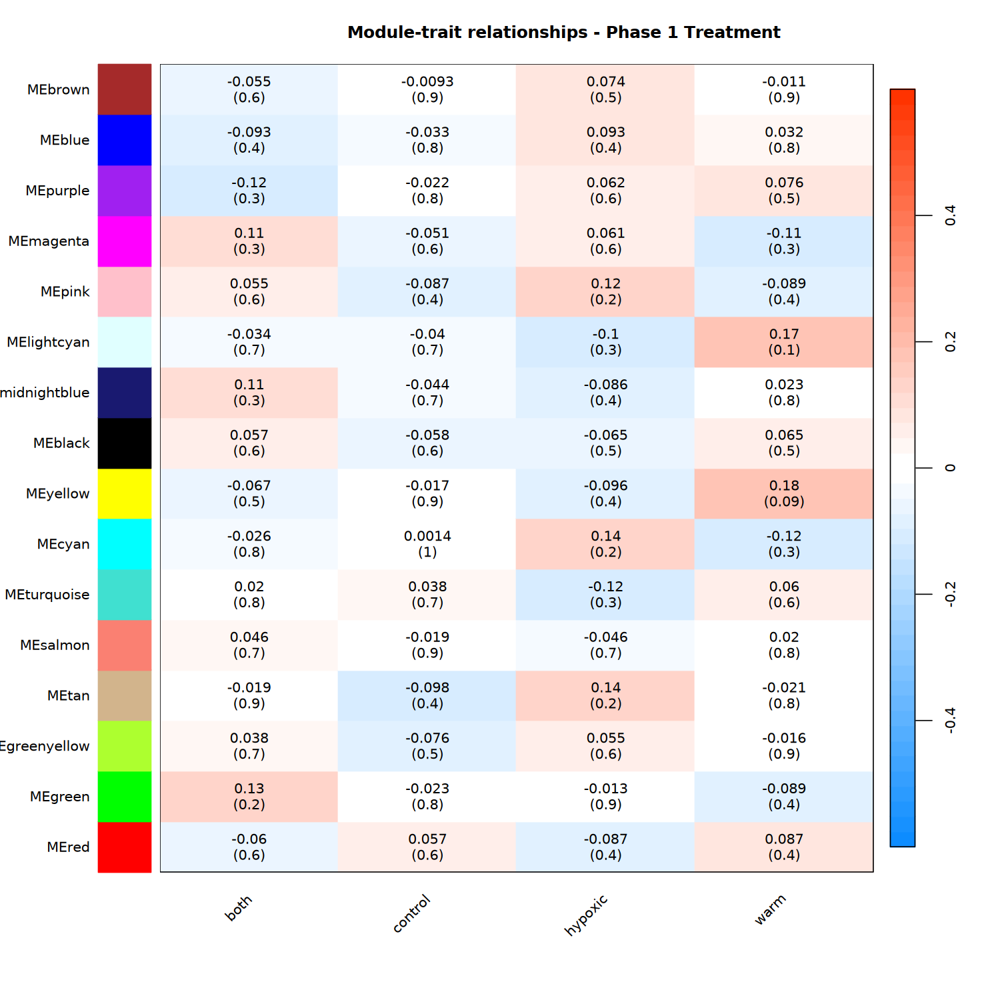

In [60]:
phase1.treatments.matrix <-  paste(signif(moduleTraitCor_p1, 2), "\n(",
                                      signif(moduleTraitPvalue_p1, 1), ")", sep = "")

par(mar = c(8, 10, 4, 2))  # increase bottom & left margins

labeledHeatmap(Matrix = moduleTraitCor_p1,
               xLabels = names(phase1.treatments[-1]),
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = TRUE,
               colors = blueWhiteRed(50),
               textMatrix = phase1.treatments.matrix,
               setStdMargins = FALSE,
               cex.text = 1,
               zlim = c(-0.6,0.6),
               main = paste("Module-trait relationships - Phase 1 Treatment"))

no significantly correlated modules with phase 1 treatment

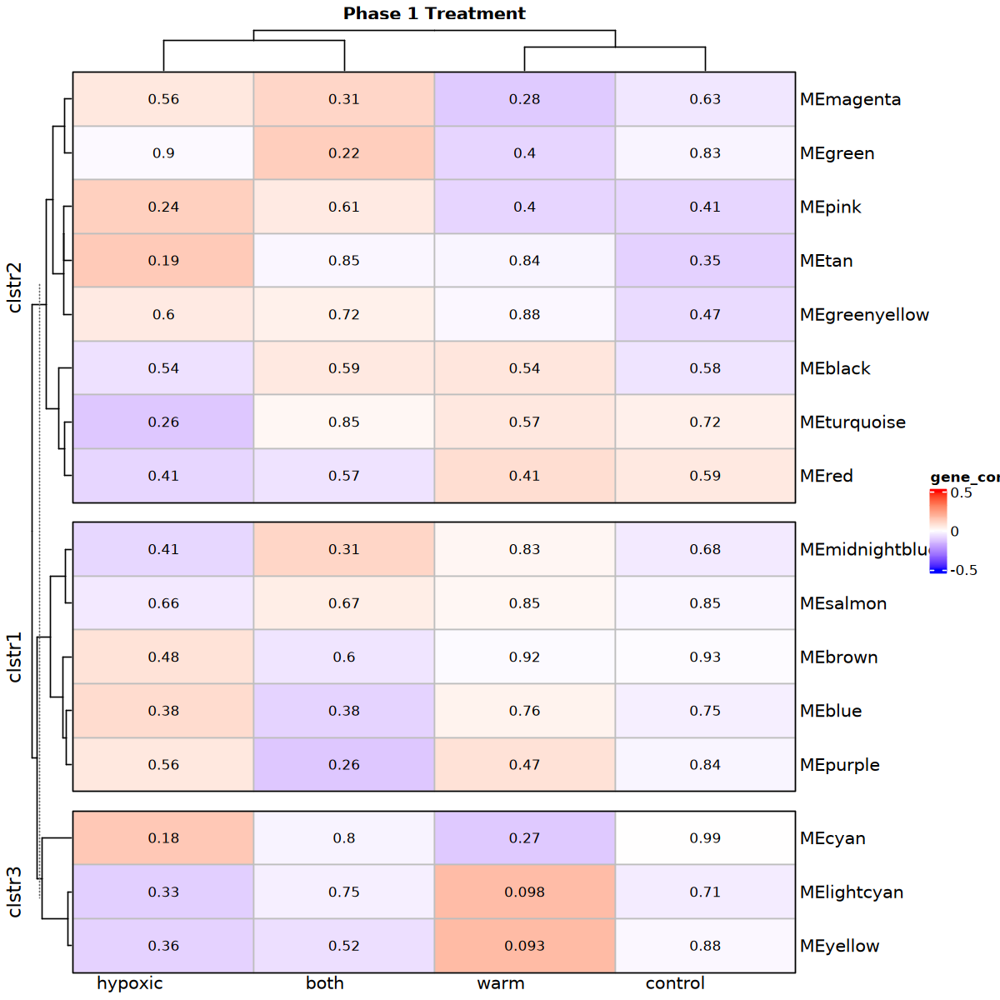

In [61]:
options(repr.plot.width = 10, repr.plot.height = 10)

p1.treatment.text <-  as.matrix(signif(moduleTraitPvalue_p1, 4))
# cluster modules based on p-value similarity
pa = cluster::pam(p1.treatment.text, k = 3)
col_fun = colorRamp2(c(-0.5, 0, 0.5), c("blue", "white", "red"))

p1_treatment.heatmap <- Heatmap(moduleTraitCor_p1, 
        name = "gene_cor", 
        rect_gp = gpar(col = "grey", lwd = 1),
        column_title = "Phase 1 Treatment", 
        column_title_gp = gpar(fontsize = 12, fontface = "bold"),
        # row_title = "WGCNA modules",
        #row_km = 4, 
        column_names_rot = 0,
        column_km = 1,
        row_split = paste0("clstr", pa$clustering),
        row_gap = unit(5, "mm"),
        column_gap = unit(5, "mm"),
        # grid.text(matrix(textMatrix)),
        # border = TRUE,
        border = TRUE,
        col = col_fun,
        cell_fun = function(j, i, x, y, width, height, fill) {
          grid.text(sprintf("%.2g", p1.treatment.text[i, j]), x, y,
          gp = gpar(fontsize = 10))
        })

p1_treatment.heatmap

so the color denotes the correlation, the text within the heatmap denotes the p-value

**higher module eigengene-treatment correlation = higher expression of the module with the given trait/treatment**
- red = lower expression in the given treatment
- blue = higher expression in the given treatment

**conclusions here:**
- only two significantly correlated modules: midnight blue and green
- midnight blue and green are neg. correlated with phase 1 warm (these genes have lower expression in phase 1 warm vs. everything else aka H,C,B)

#### phase 1 temp

In [ ]:
phase1.temp.matrix <-  paste(signif(moduleTraitCor_p1.temp, 2), "\n(",
                                      signif(moduleTraitPvalue_p1.temp, 1), ")", sep = "")

par(mar = c(8, 10, 4, 2))  # increase bottom & left margins

labeledHeatmap(Matrix = moduleTraitCor_p1.temp,
               xLabels = names(phase1.temp[-1]),
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = TRUE,
               colors = blueWhiteRed(50),
               textMatrix = phase1.temp.matrix,
               setStdMargins = FALSE,
               cex.text = 1,
               zlim = c(-0.6,0.6),
               main = paste("Module-trait relationships - Phase 1 Temp"))

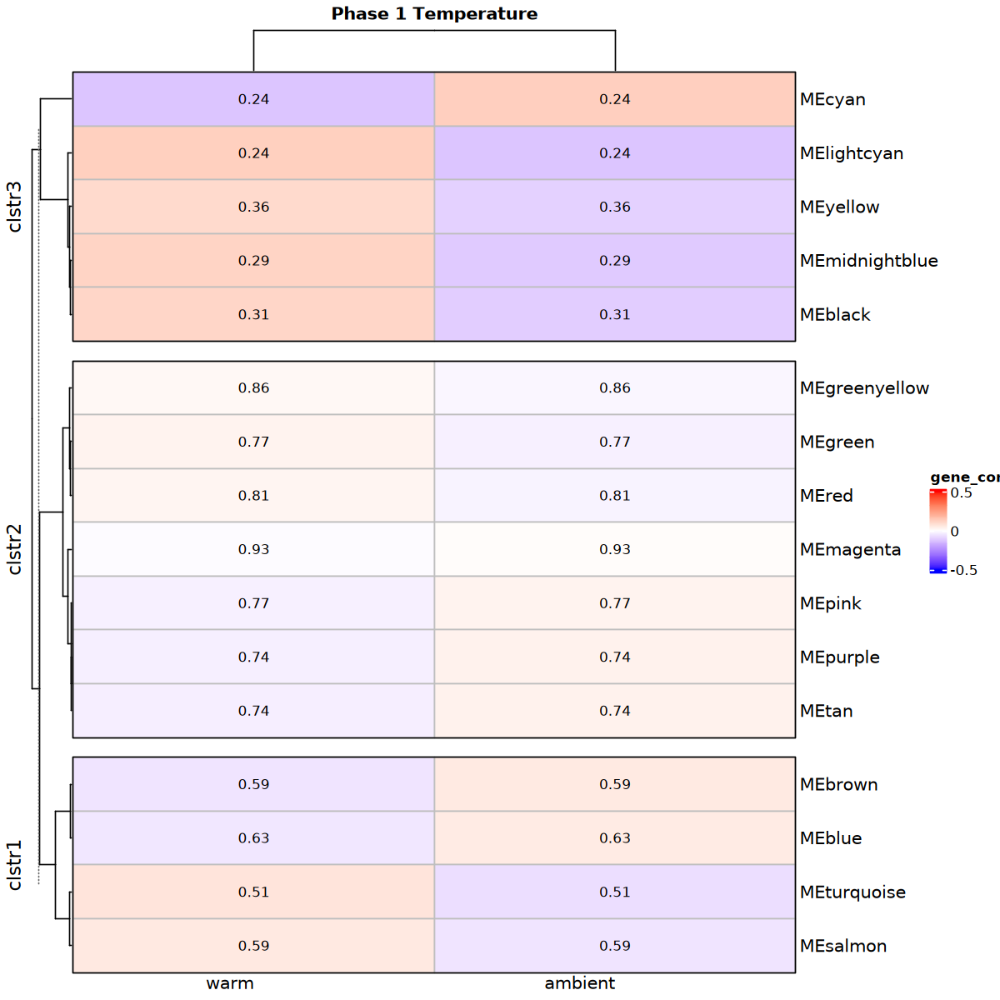

In [62]:
options(repr.plot.width = 10, repr.plot.height = 10)

p1.temp.text <-  as.matrix(signif(moduleTraitPvalue_p1.temp, 4))
# cluster modules based on p-value similarity
pa = cluster::pam(p1.temp.text, k = 3)
col_fun = colorRamp2(c(-0.5, 0, 0.5), c("blue", "white", "red"))

p1_temp.heatmap <- Heatmap(moduleTraitCor_p1.temp, 
        name = "gene_cor", 
        rect_gp = gpar(col = "grey", lwd = 1),
        column_title = "Phase 1 Temperature", 
        column_title_gp = gpar(fontsize = 12, fontface = "bold"),
        # row_title = "WGCNA modules",
        #row_km = 4, 
        column_names_rot = 0,
        column_km = 1,
        row_split = paste0("clstr", pa$clustering),
        row_gap = unit(5, "mm"),
        column_gap = unit(5, "mm"),
        # grid.text(matrix(textMatrix)),
        # border = TRUE,
        border = TRUE,
        col = col_fun,
        cell_fun = function(j, i, x, y, width, height, fill) {
          grid.text(sprintf("%.2g", p1.temp.text[i, j]), x, y,
          gp = gpar(fontsize = 10))
        })

p1_temp.heatmap

no significantly correlated modules

#### phase 1 DO

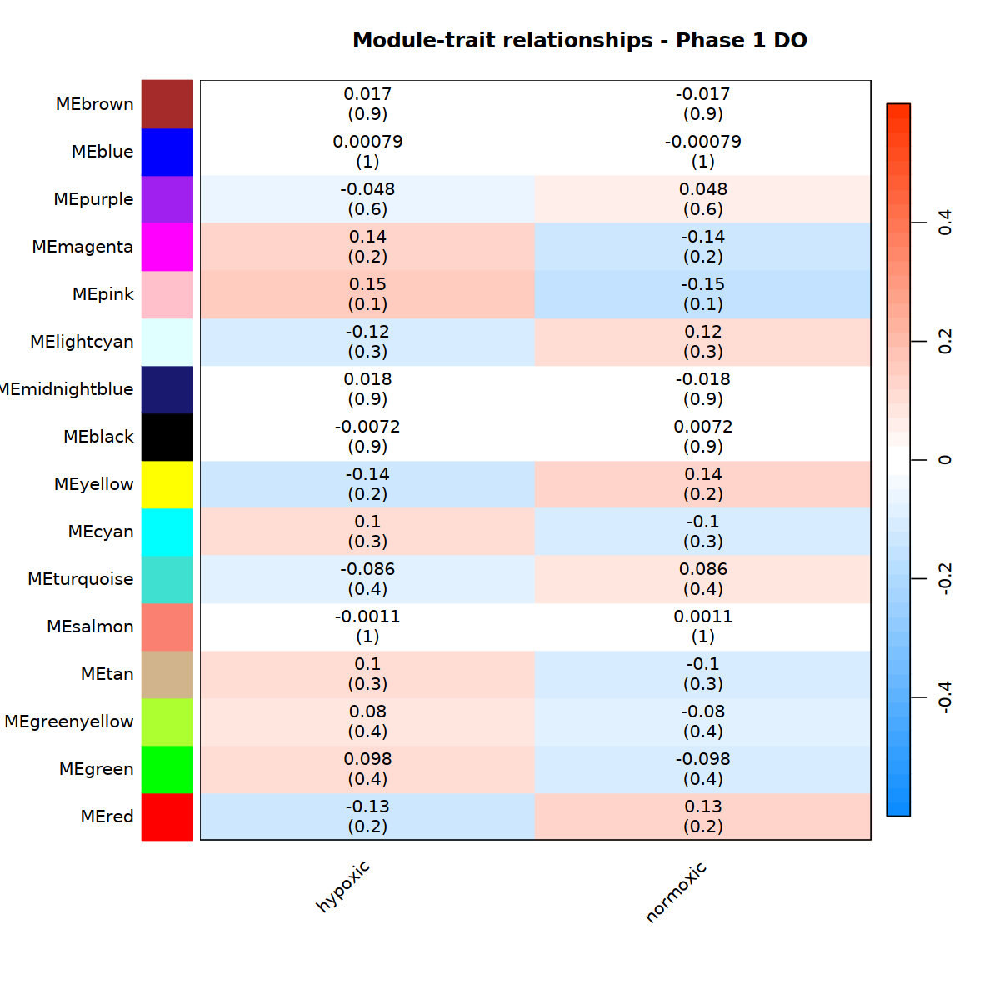

In [63]:
phase1.DO.matrix <-  paste(signif(moduleTraitCor_p1.DO, 2), "\n(",
                                      signif(moduleTraitPvalue_p1.DO, 1), ")", sep = "")

par(mar = c(8, 10, 4, 2))  # increase bottom & left margins

labeledHeatmap(Matrix = moduleTraitCor_p1.DO,
               xLabels = names(phase1.DO[-1]),
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = TRUE,
               colors = blueWhiteRed(50),
               textMatrix = phase1.DO.matrix,
               setStdMargins = FALSE,
               cex.text = 1,
               zlim = c(-0.6,0.6),
               main = paste("Module-trait relationships - Phase 1 DO"))

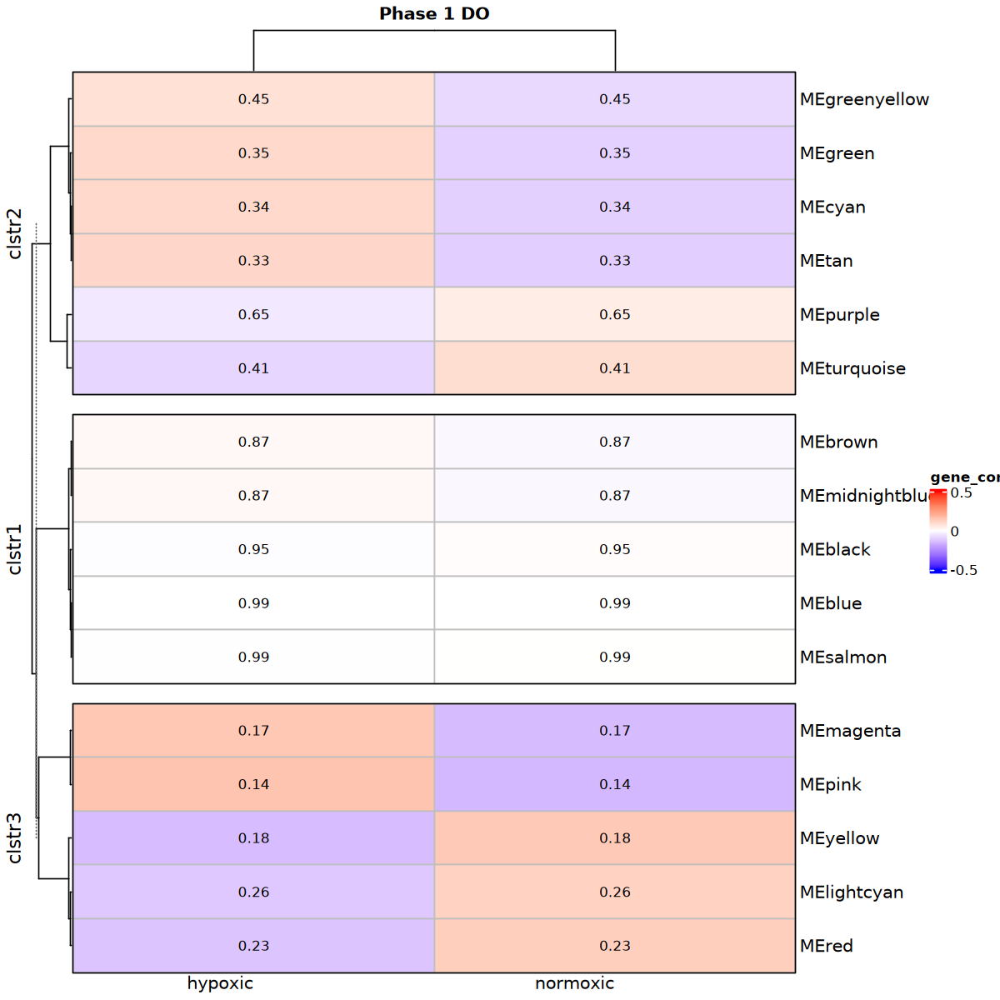

In [64]:
options(repr.plot.width = 10, repr.plot.height = 10)

p1.DO.text <-  as.matrix(signif(moduleTraitPvalue_p1.DO, 4))
# cluster modules based on p-value similarity
pa = cluster::pam(p1.DO.text, k = 3)
col_fun = colorRamp2(c(-0.5, 0, 0.5), c("blue", "white", "red"))

p1_DO.heatmap <- Heatmap(moduleTraitCor_p1.DO, 
        name = "gene_cor", 
        rect_gp = gpar(col = "grey", lwd = 1),
        column_title = "Phase 1 DO", 
        column_title_gp = gpar(fontsize = 12, fontface = "bold"),
        # row_title = "WGCNA modules",
        #row_km = 4, 
        column_names_rot = 0,
        column_km = 1,
        row_split = paste0("clstr", pa$clustering),
        row_gap = unit(5, "mm"),
        column_gap = unit(5, "mm"),
        # grid.text(matrix(textMatrix)),
        # border = TRUE,
        border = TRUE,
        col = col_fun,
        cell_fun = function(j, i, x, y, width, height, fill) {
          grid.text(sprintf("%.2g", p1.DO.text[i, j]), x, y,
          gp = gpar(fontsize = 10))
        })

p1_DO.heatmap

no significant modules for phase 1 DO

#### phase 2 treatment

Warning message in numbers2colors(data, signed, colors = colors, lim = zlim, naColor = naColor):
“Some values of 'x' are above given maximum and will be truncated to the maximum.”


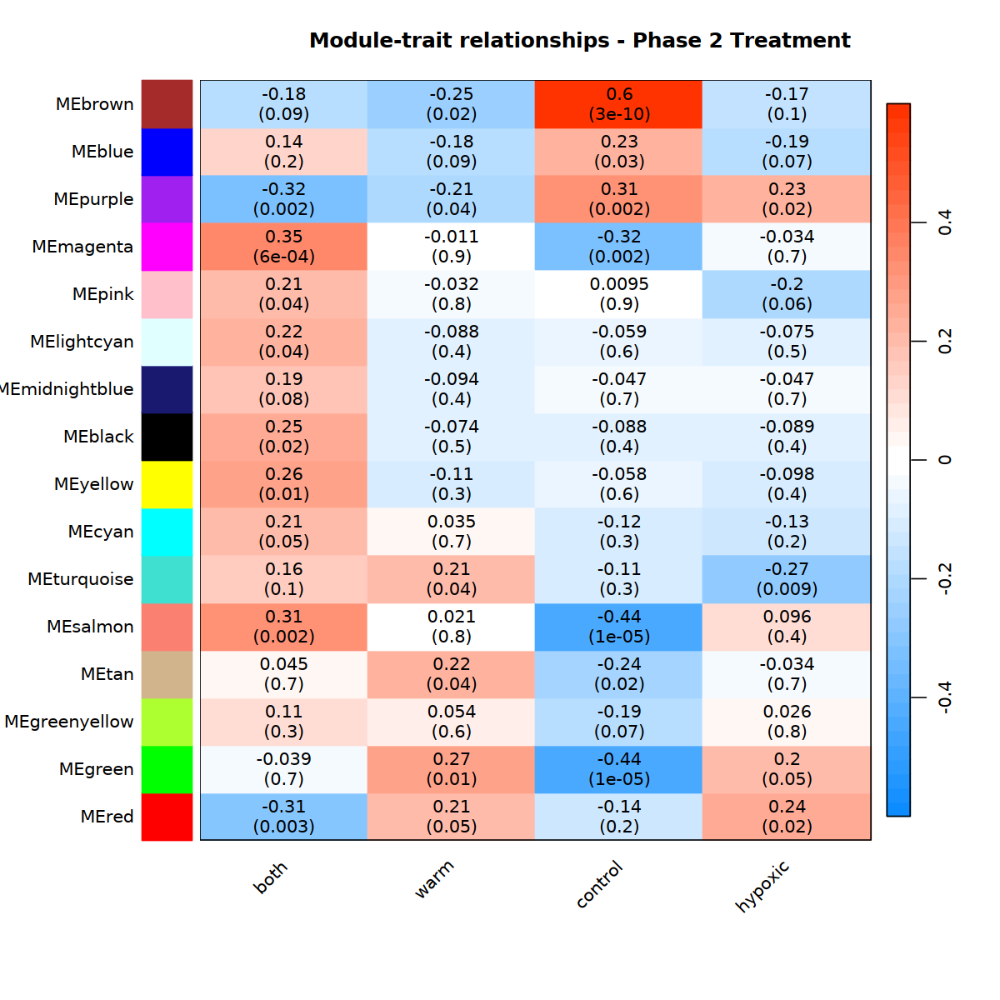

In [65]:
phase2.treatment.matrix <-  paste(signif(moduleTraitCor_p2, 2), "\n(",
                                      signif(moduleTraitPvalue_p2, 1), ")", sep = "")

par(mar = c(8, 10, 4, 2))  # increase bottom & left margins

labeledHeatmap(Matrix = moduleTraitCor_p2,
               xLabels = names(phase2.treatments[-1]),
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = TRUE,
               colors = blueWhiteRed(50),
               textMatrix = phase2.treatment.matrix,
               setStdMargins = FALSE,
               cex.text = 1,
               zlim = c(-0.6,0.6),
               main = paste("Module-trait relationships - Phase 2 Treatment"))

looking for modules with a correlation |r| > 0.6 and pvalue < 0.05 (values based on other papers)

so this would really only include MEbrown for upregulation in control conditions

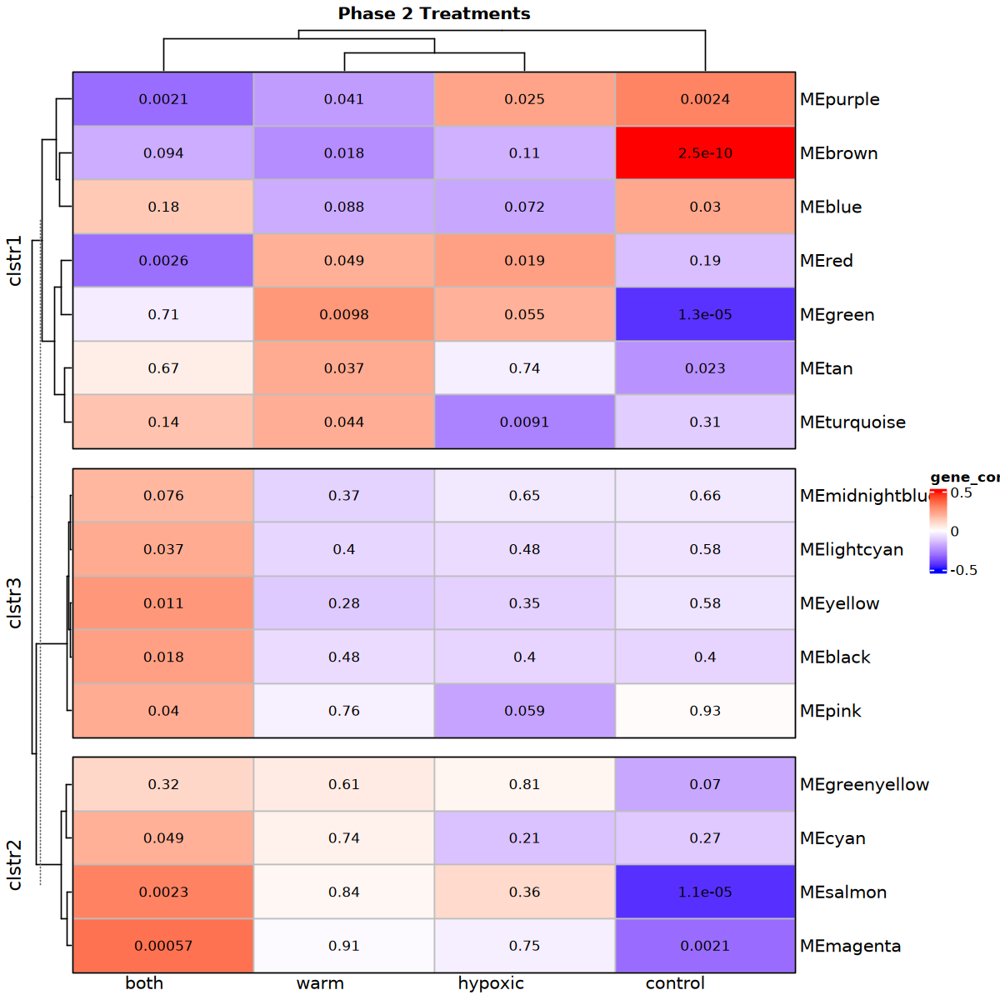

In [66]:
options(repr.plot.width = 10, repr.plot.height = 10)

p2.treatment.text <-  as.matrix(signif(moduleTraitPvalue_p2, 4))
# cluster modules based on p-value similarity
pa = cluster::pam(p2.treatment.text, k = 3)
col_fun = colorRamp2(c(-0.5, 0, 0.5), c("blue", "white", "red"))

p2_treatment.heatmap <- Heatmap(moduleTraitCor_p2, 
        name = "gene_cor", 
        rect_gp = gpar(col = "grey", lwd = 1),
        column_title = "Phase 2 Treatments", 
        column_title_gp = gpar(fontsize = 12, fontface = "bold"),
        # row_title = "WGCNA modules",
        #row_km = 4, 
        column_names_rot = 0,
        column_km = 1,
        row_split = paste0("clstr", pa$clustering),
        row_gap = unit(5, "mm"),
        column_gap = unit(5, "mm"),
        # grid.text(matrix(textMatrix)),
        # border = TRUE,
        border = TRUE,
        col = col_fun,
        cell_fun = function(j, i, x, y, width, height, fill) {
          grid.text(sprintf("%.2g", p2.treatment.text[i, j]), x, y,
          gp = gpar(fontsize = 10))
        })

p2_treatment.heatmap

**conclusions here::**
- lots of significantly correlated modules here!
    - red ~ phase 2 stressors (neg. cor with both, pos. cor with warm and hypoxic)
    - pink ~ pos. both
    - black ~ pos. both
    - magenta and salmon ~ neg. control, pos. both
    - brown ~ pos. control, neg. for warm
    - green ~ neg. for control, pos. for warm

#### phase 2 DO

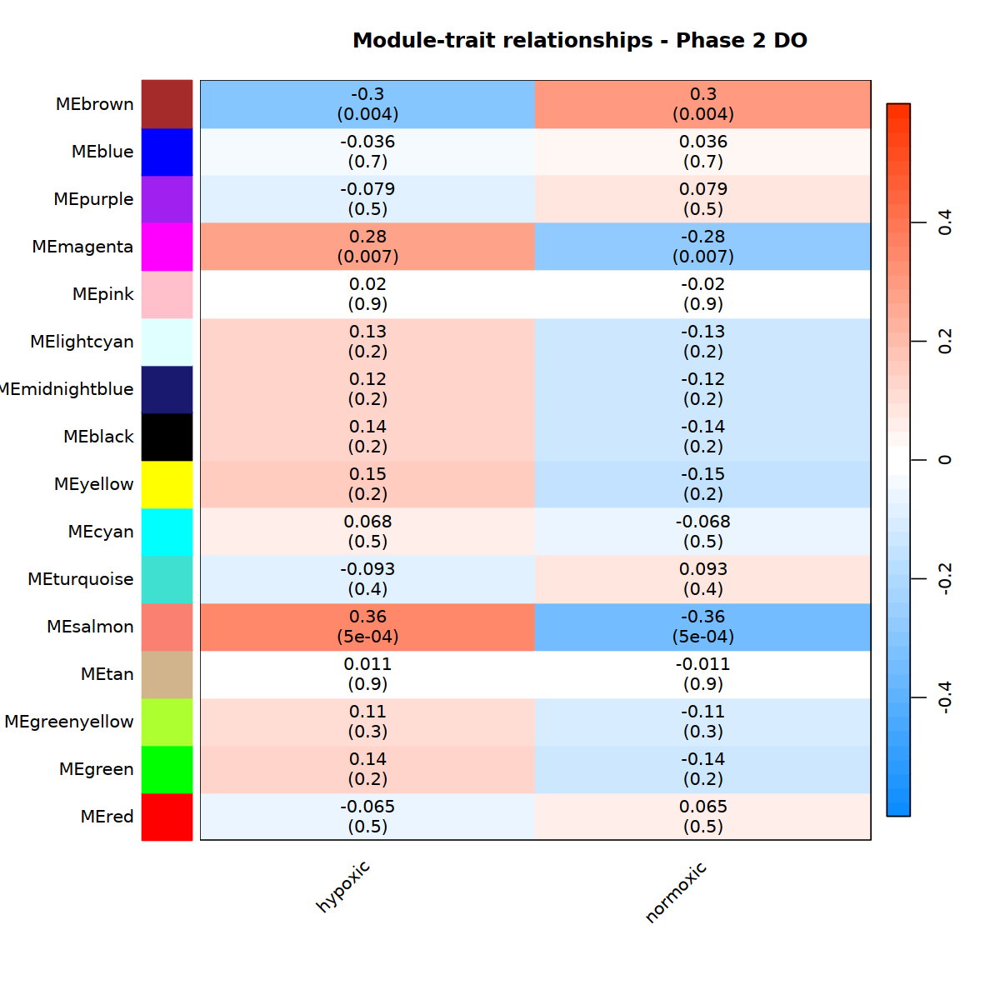

In [67]:
phase2.DO.matrix <-  paste(signif(moduleTraitCor_p2.DO, 2), "\n(",
                                      signif(moduleTraitPvalue_p2.DO, 1), ")", sep = "")

par(mar = c(8, 10, 4, 2))  # increase bottom & left margins

labeledHeatmap(Matrix = moduleTraitCor_p2.DO,
               xLabels = names(phase2.DO[-1]),
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = TRUE,
               colors = blueWhiteRed(50),
               textMatrix = phase2.DO.matrix,
               setStdMargins = FALSE,
               cex.text = 1,
               zlim = c(-0.6,0.6),
               main = paste("Module-trait relationships - Phase 2 DO"))

MEsalmon might be an interesting module but doesn't surpass the |r| > 0.6 threshold

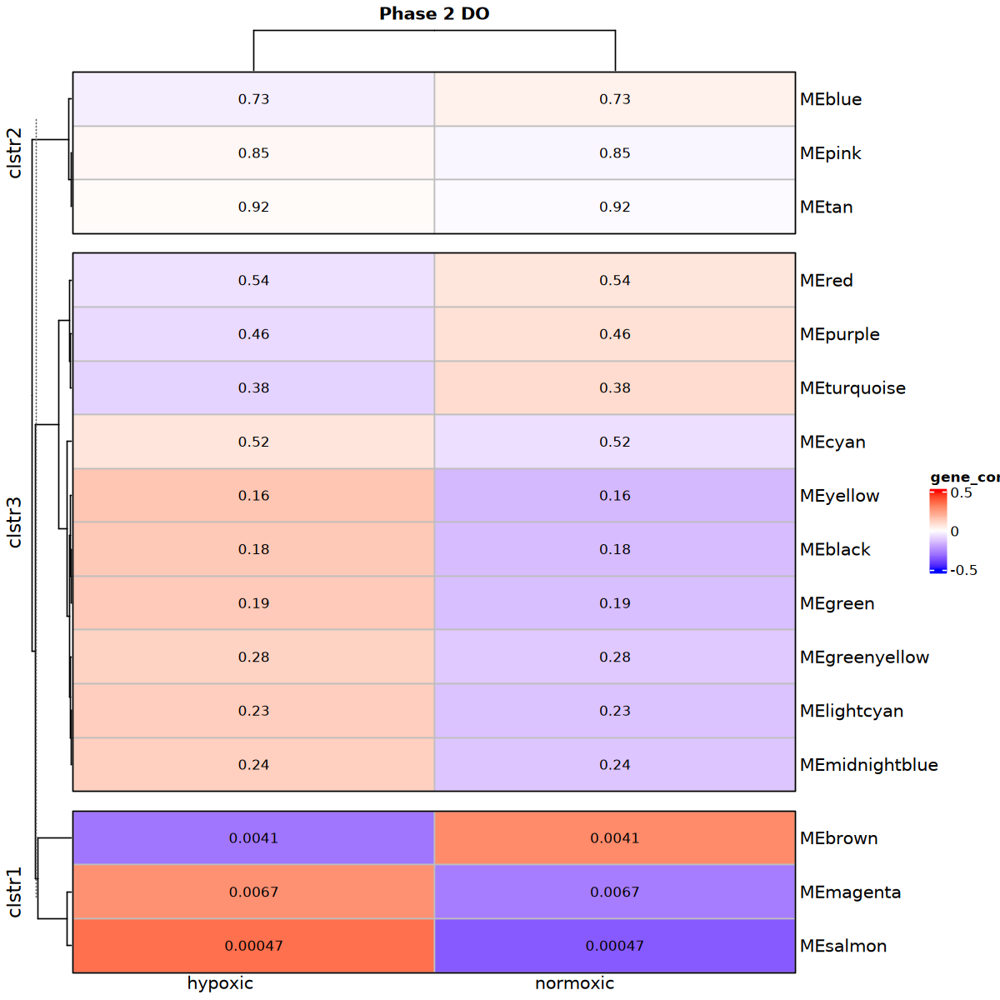

In [68]:
options(repr.plot.width = 10, repr.plot.height = 10)

p2.DO.text <-  as.matrix(signif(moduleTraitPvalue_p2.DO, 4))
# cluster modules based on p-value similarity
pa = cluster::pam(p2.DO.text, k = 3)
col_fun = colorRamp2(c(-0.5, 0, 0.5), c("blue", "white", "red"))

p2_DO.heatmap <- Heatmap(moduleTraitCor_p2.DO, 
        name = "gene_cor", 
        rect_gp = gpar(col = "grey", lwd = 1),
        column_title = "Phase 2 DO", 
        column_title_gp = gpar(fontsize = 12, fontface = "bold"),
        # row_title = "WGCNA modules",
        #row_km = 4, 
        column_names_rot = 0,
        column_km = 1,
        row_split = paste0("clstr", pa$clustering),
        row_gap = unit(5, "mm"),
        column_gap = unit(5, "mm"),
        # grid.text(matrix(textMatrix)),
        # border = TRUE,
        border = TRUE,
        col = col_fun,
        cell_fun = function(j, i, x, y, width, height, fill) {
          grid.text(sprintf("%.2g", p2.DO.text[i, j]), x, y,
          gp = gpar(fontsize = 10))
        })

p2_DO.heatmap

**conclusions here:**
- 3 significantly correlated modules: brown, magenta, salmon
- salmon and magenta are correlated in the same direction (neg. for normoxic, pos. for hypoxic) - meaning that the genes in those modules have higher expression in phase 2 hypoxia than normoxia (regardless of temperature treatment)
- brown is the opposite - higher expression in normoxia than hypoxia 

####  phase 2 temperature

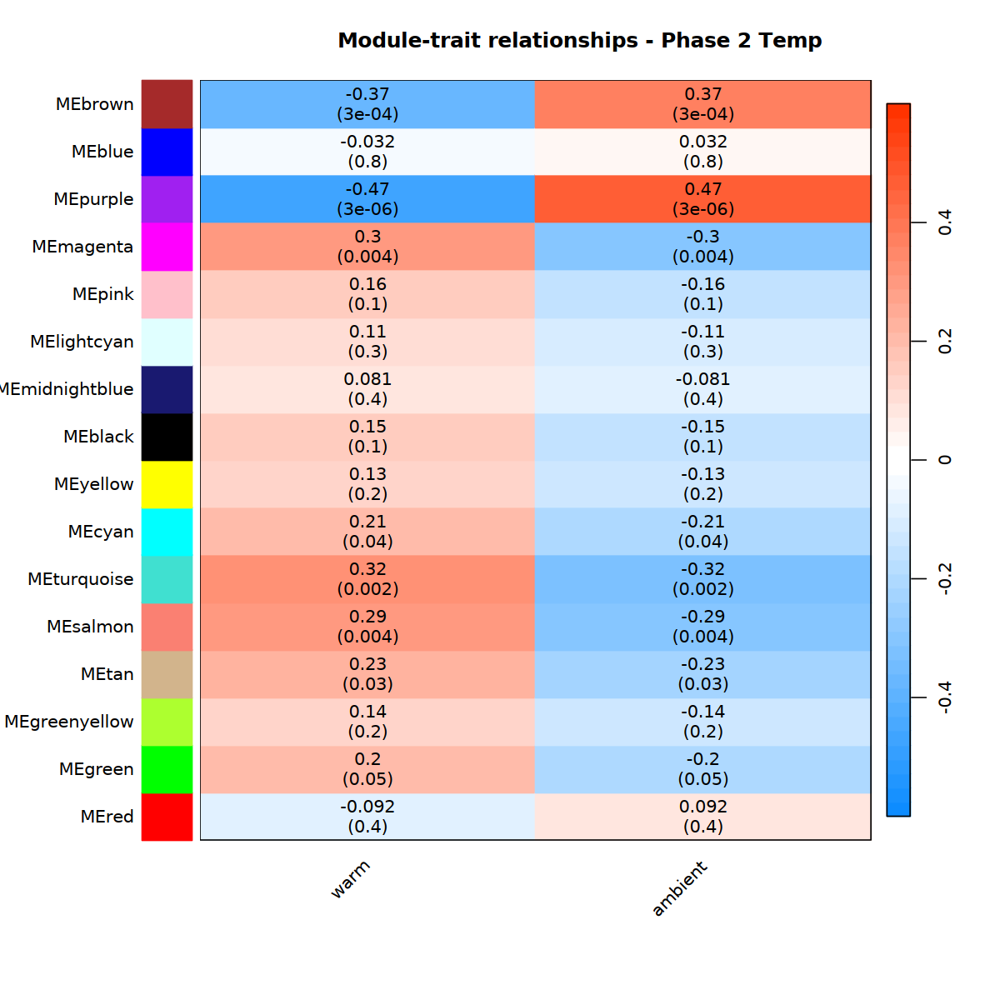

In [69]:
phase2.temp.matrix <-  paste(signif(moduleTraitCor_p2.temp, 2), "\n(",
                                      signif(moduleTraitPvalue_p2.temp, 1), ")", sep = "")

par(mar = c(8, 10, 4, 2))  # increase bottom & left margins

labeledHeatmap(Matrix = moduleTraitCor_p2.temp,
               xLabels = names(phase2.temp[-1]),
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = TRUE,
               colors = blueWhiteRed(50),
               textMatrix = phase2.temp.matrix,
               setStdMargins = FALSE,
               cex.text = 1,
               zlim = c(-0.6,0.6),
               main = paste("Module-trait relationships - Phase 2 Temp"))

MEpurple - upregulated in ambient conditions, downregulated in warm conditions in phase 2 (although still not over the 0.6 threshold but close enough!)

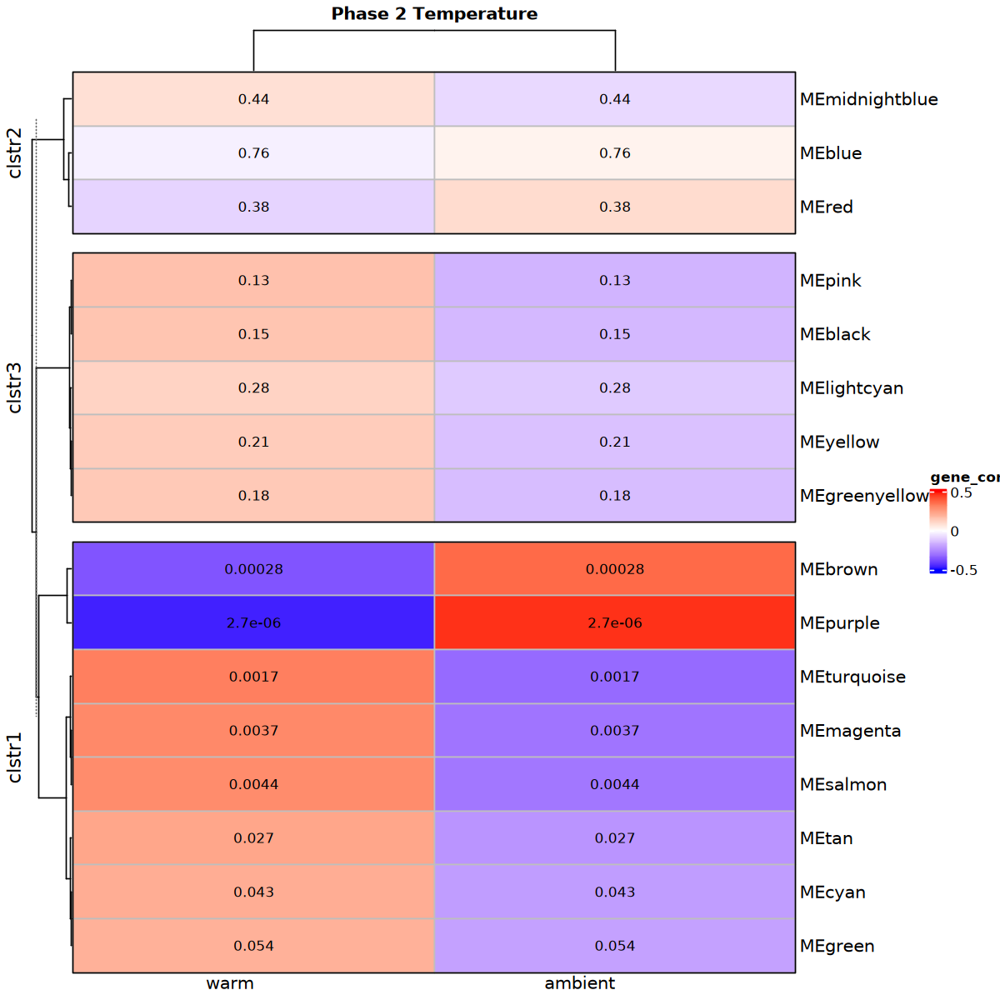

In [70]:
options(repr.plot.width = 10, repr.plot.height = 10)

p2.temp.text <-  as.matrix(signif(moduleTraitPvalue_p2.temp, 4))
# cluster modules based on p-value similarity
pa = cluster::pam(p2.temp.text, k = 3)
col_fun = colorRamp2(c(-0.5, 0, 0.5), c("blue", "white", "red"))

p2_temp.heatmap <- Heatmap(moduleTraitCor_p2.temp, 
        name = "gene_cor", 
        rect_gp = gpar(col = "grey", lwd = 1),
        column_title = "Phase 2 Temperature", 
        column_title_gp = gpar(fontsize = 12, fontface = "bold"),
        # row_title = "WGCNA modules",
        #row_km = 4, 
        column_names_rot = 0,
        column_km = 1,
        row_split = paste0("clstr", pa$clustering),
        row_gap = unit(5, "mm"),
        column_gap = unit(5, "mm"),
        # grid.text(matrix(textMatrix)),
        # border = TRUE,
        border = TRUE,
        col = col_fun,
        cell_fun = function(j, i, x, y, width, height, fill) {
          grid.text(sprintf("%.2g", p2.temp.text[i, j]), x, y,
          gp = gpar(fontsize = 10))
        })

p2_temp.heatmap

**conclusions here:**
- 7 significantly correlated modules - brown, purple, turquoise, magenta, salmon, tan, and cyan
- turquoise, magenta, salmon, tan, and cyan are all neg. correlated with ambient temperatures, meaning that they have lower expression in phase 2 ambient conditions (or higher expression in phase 2 warm conditions), regardless of DO treatment
- brown and purple are all neg. correlated with warm temps, meaning they have lower expression in phase 2 warm conditions

In [71]:
library(cowplot)
library(grid)

In [72]:
# 1. Create a helper function to convert ComplexHeatmap to a grob
as_grob_hm <- function(hm) {
  grid.grabExpr(draw(hm))
}

# 2. Convert all your heatmaps
p1_temp_g <- as_grob_hm(p1_temp.heatmap)
p1_DO_g <- as_grob_hm(p1_DO.heatmap)
p1_treatment_g <- as_grob_hm(p1_treatment.heatmap)
p2_temp_g <- as_grob_hm(p2_temp.heatmap)
p2_DO_g <- as_grob_hm(p2_DO.heatmap)
p2_treatment_g <- as_grob_hm(p2_treatment.heatmap)

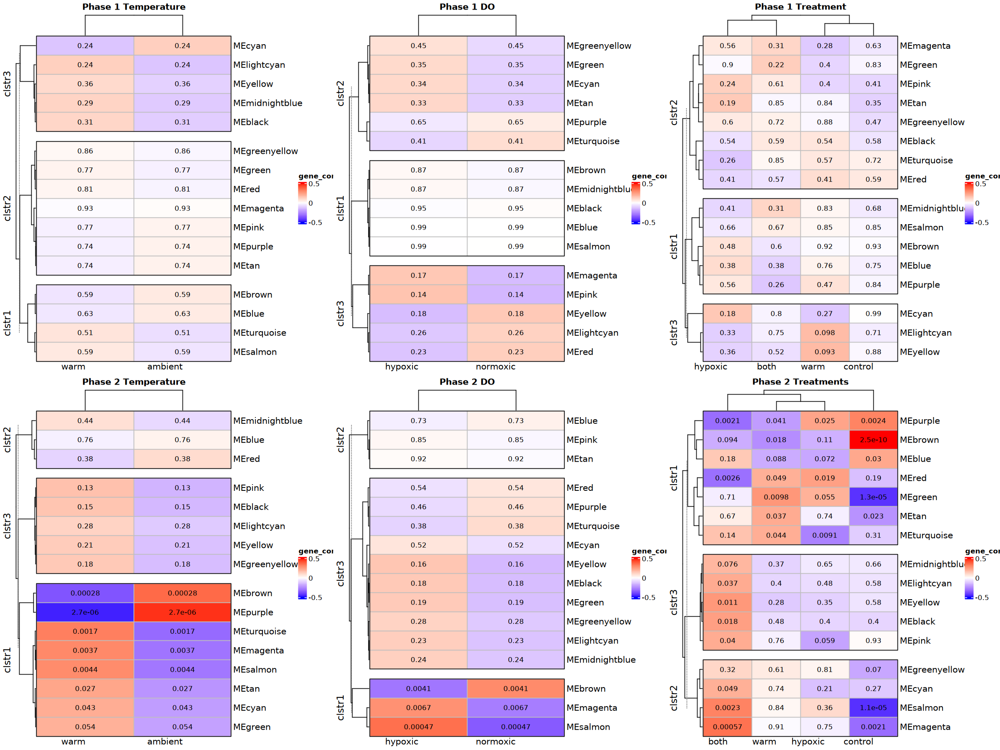

In [73]:
options(repr.plot.width = 20, repr.plot.height = 15)

# 3. Use plot_grid with the new grob objects
all_heatmaps <- plot_grid(p1_temp_g, p1_DO_g, p1_treatment_g, 
          p2_temp_g, p2_DO_g, p2_treatment_g,
          nrow = 2, ncol = 3)

all_heatmaps

some of the axes are not in the same order bc of clustering - I think I'm okay with that since it's informative for the treatments

In [ ]:
ggsave(
  filename = '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/plots/module_heatmaps_p2.png', 
  plot = all_heatmaps, 
  width = 20,       # Half the width
  height = 15,     # Roughly half the height
  units = "in", 
  dpi = 300         # High resolution for clarity
)

####  Combo of P1 & P2

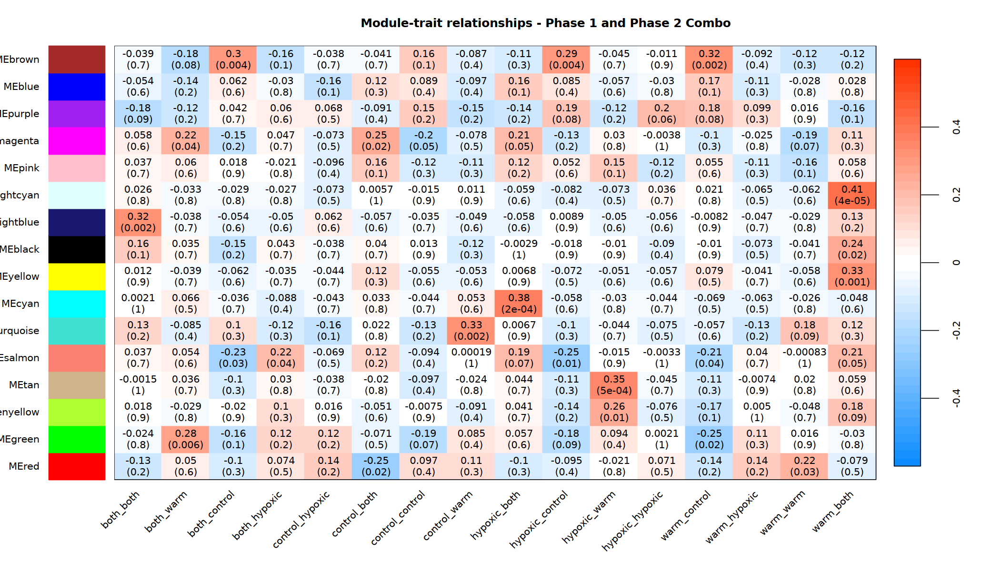

In [74]:
options(repr.plot.width = 17.5, repr.plot.height = 10)

combo_matrix <-  paste(signif(moduleTraitCor_combo, 2), "\n(",
                                      signif(moduleTraitPvalue_combo, 1), ")", sep = "")

par(mar = c(8, 10, 4, 2))  # increase bottom & left margins

labeledHeatmap(Matrix = moduleTraitCor_combo,
               xLabels = names(combo.treatments[-1]),
               yLabels = names(MEs),
               ySymbols = names(MEs),
               colorLabels = TRUE,
               colors = blueWhiteRed(50),
               textMatrix = combo_matrix,
               setStdMargins = FALSE,
               cex.text = 1,
               zlim = c(-0.6,0.6),
               main = paste("Module-trait relationships - Phase 1 and Phase 2 Combo"))

MElightcyan module is correlated with upregulation in the warm_both treatment (and downregulation with everything that is not specifically that treatment?)

idk it might be too confusing to look at it all like this though... like what does this actually provide? just really specific modules for treatment combos but I think that's too fine-scale to be useful

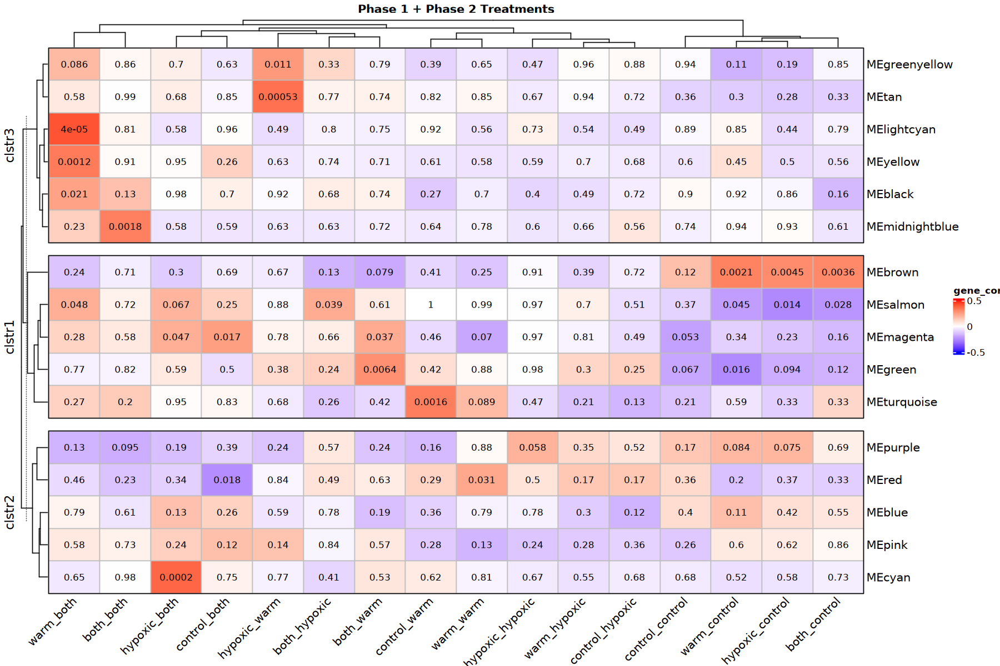

In [75]:
options(repr.plot.width = 15, repr.plot.height = 10)

combo.text <-  as.matrix(signif(moduleTraitPvalue_combo, 4))
# cluster modules based on p-value similarity
pa = cluster::pam(combo.text, k = 3)
col_fun = colorRamp2(c(-0.5, 0, 0.5), c("blue", "white", "red"))

Heatmap(moduleTraitCor_combo, 
        name = "gene_cor", 
        rect_gp = gpar(col = "grey", lwd = 1),
        column_title = "Phase 1 + Phase 2 Treatments", 
        column_title_gp = gpar(fontsize = 12, fontface = "bold"),
        # row_title = "WGCNA modules",
        #row_km = 4, 
        column_names_rot = 45,
        column_km = 1,
        row_split = paste0("clstr", pa$clustering),
        row_gap = unit(5, "mm"),
        column_gap = unit(5, "mm"),
        # grid.text(matrix(textMatrix)),
        # border = TRUE,
        border = TRUE,
        col = col_fun,
        cell_fun = function(j, i, x, y, width, height, fill) {
          grid.text(sprintf("%.2g", combo.text[i, j]), x, y,
          gp = gpar(fontsize = 10))
        })

column clustering = shows similarity of the treatments with similar correlation patterns across modules

## MEs boxplots by treatment group

inspo for this comes from [Gurr's code](https://github.com/SamGurr/Pgenerosa_OA_TagSeq/blob/main/TagSeq/Analysis/Scripts/Day21_WGCNA_all.R) - plotting every module's ME (module eigengene) for each treatment combination - this will allow me to take a closer look at the relationship between modules and phase 1 and 2 treatments

first - need to make sure the sample name mixup from above carries down here

In [119]:
# add missing rep number to sample name
rownames(metaData_merge)[rownames(metaData_merge) == 'C_W5_W52'] <- 'C2_W5_W52'
rownames(dataMeta)[rownames(dataMeta) == 'C_W5_W52'] <- 'C2_W5_W52'

# fix wrong rep number to sample name
rownames(metaData_merge)[rownames(metaData_merge) == 'W2_B2_G04'] <- 'W2_B1_G04'
rownames(dataMeta)[rownames(dataMeta) == 'W2_B2_G04'] <- 'W2_B1_G04'

# update sample column info
metaData_merge$Sample <- rownames(metaData_merge)
dataMeta$Sample <- rownames(dataMeta)

then create df to plot boxplots - want the metadata and module eigengene info in long format

In [120]:
# Create ME table
MEs_df <- as.data.frame(MEs)
MEs_df$Sample <- rownames(MEs_df)

# format metadata and merge with MEs
dataMeta2 <- dataMeta[,1:10]
meta_merge <- merge(dataMeta2, metaData_merge, by = 'Sample')
dim(meta_merge)

# merge MEs and metadata
MEsPlotting <- merge(MEs_df, meta_merge, by = 'Sample')

# Melt to long format
MEsPlotting_melt <- reshape2::melt(
  MEsPlotting,
  id.vars = c("Sample",
              "Phase1_treatment",
              "Phase1_temp",
              "Phase1_DO",
              "Phase1_TankRep",
              "Phase2_treatment",
              "Phase2_temp",
              "Phase2_DO",
              "Phase2_TankRep",
              "combo_trtmt",
              'Actual_shell_growth_mg',
              'Actual_tissue_growth_mg', 
              'Ratio_tissue_shell_mg'
             ),
  variable.name = "Module",
  value.name = "Eigengene"
)

MEsPlotting_melt <- MEsPlotting_melt %>%
filter(!grepl('code', Module)) # remove treatment code rows

head(MEsPlotting_melt)

[1] 92 27

,Sample,Phase1_treatment,Phase1_temp,Phase1_DO,Phase1_TankRep,Phase2_treatment,Phase2_temp,Phase2_DO,Phase2_TankRep,combo_trtmt,Actual_shell_growth_mg,Actual_tissue_growth_mg,Ratio_tissue_shell_mg,Module,Eigengene
,<chr>,<fct>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<int>,<chr>,<dbl>,<dbl>,<chr>,<fct>,<dbl>
1,B1_B1_O01,both,warm,hypoxic,1,both,warm,hypoxic,1,both_both,210.2755,120.72448,0.574125224,MEbrown,-0.05849966
2,B1_W5_O50,both,warm,hypoxic,1,warm,warm,normoxic,5,both_warm,315.8883,85.61170,0.271018901,MEbrown,0.07065197
3,B2_B5_O51,both,warm,hypoxic,2,both,warm,hypoxic,5,both_both,114.3215,44.47852,0.389065292,MEbrown,0.06883685
4,B2_C4_O40,both,warm,hypoxic,2,control,ambient,normoxic,4,both_control,164.9903,55.10972,0.33401798,MEbrown,-0.00435440
5,B3_B4_O41,both,warm,hypoxic,3,both,warm,hypoxic,4,both_both,197.9250,116.17500,0.586964759,MEbrown,0.07461252
6,B3_C3_O30,both,warm,hypoxic,3,control,ambient,normoxic,3,both_control,316.0466,241.35336,0.763663743,MEbrown,0.09897571


In [77]:
# save metadata in case I skip code above
# write.csv(MEsPlotting_melt[,1:13], '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/p2.wgcna_metadata.csv')

make boxplot!

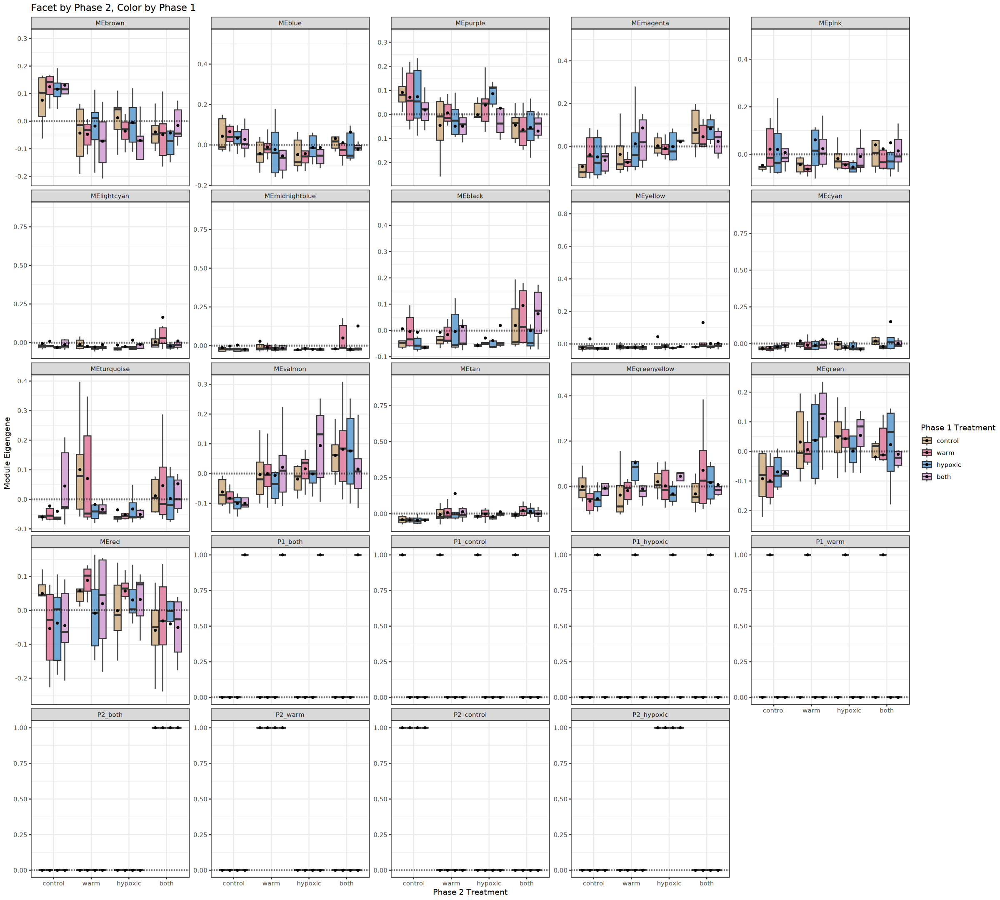

In [121]:
options(repr.plot.width = 20, repr.plot.hieght = 20)

MEs_boxplot <- ggplot(MEsPlotting_melt,
       aes(x = Phase2_treatment,
           y = Eigengene,
           fill = factor(Phase1_treatment))) +
# boxplot
  geom_boxplot(position = position_dodge(0.8),
               outlier.shape = NA,
               alpha = 0.8) +
# colors
scale_fill_manual(values = c("hypoxic" = "steelblue3", 
                             "warm" = "palevioletred", 
                             "control" = "burlywood3", 
                             "both" = "plum3")) +
  # point for mean
  stat_summary(fun = mean,
               geom = "point",
               color = "black",
               position = position_dodge(0.8),
               size = 1) +
  # horizontal line for 0
  geom_hline(yintercept = 0,
             linetype = "dotted",
             linewidth = 1) +
  # labels
  ylab("Module Eigengene") +
labs(fill = 'Phase 1 Treatment', 
     x = 'Phase 2 Treatment',
    title = 'Facet by Phase 2, Color by Phase 1') +
# theme
  theme_bw() +
# create grid
  facet_wrap(~ Module, scales = "free_y")

MEs_boxplot

x-axis: module eigengene - representative gene expression profile for that module

dotted line denotes no expression, pos = higher expr and neg = lower expr

**MEbrown** is interesting - expression of those genes are higher if oysters returned to control conditions - might be indicative of general stress response? since the gene cluster responds somewhat similarly in all the other treatments

**MEturquoise** is also interesting - we start to see some treatment specific expression based on phase 1 - higher expression in BC compared to all other oysters in control conditions later in life, regardless of phase 1 treatment - also see higher expression in CW and WW compared to HW and BW

In [79]:
ggsave(
  filename = '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/plots/MEs_boxplots_p2.png', 
  plot = MEs_boxplot, 
  width = 10,       # Half the width
  height = 8.5,     # Roughly half the height
  units = "in", 
  dpi = 300         # High resolution for clarity
)

just wondering what this looks like when we switch the faceting and coloring ...

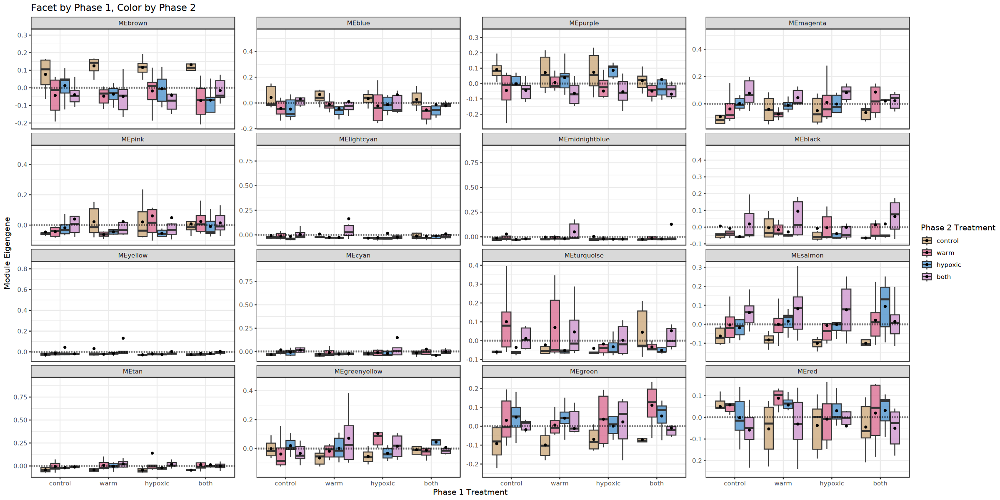

In [80]:
options(repr.plot.width = 20, repr.plot.hieght = 20)

MEs_boxplot <- ggplot(MEsPlotting_melt,
       aes(x = Phase1_treatment,
           y = Eigengene,
           fill = factor(Phase2_treatment))) +
# boxplot
  geom_boxplot(position = position_dodge(0.8),
               outlier.shape = NA,
               alpha = 0.8) +
# colors
scale_fill_manual(values = c("hypoxic" = "steelblue3", 
                             "warm" = "palevioletred", 
                             "control" = "burlywood3", 
                             "both" = "plum3")) +
  # point for mean
  stat_summary(fun = mean,
               geom = "point",
               color = "black",
               position = position_dodge(0.8),
               size = 1) +
  # horizontal line for 0
  geom_hline(yintercept = 0,
             linetype = "dotted",
             linewidth = 1) +
  # labels
  ylab("Module Eigengene") +
labs(fill = 'Phase 2 Treatment', 
     x = 'Phase 1 Treatment',
    title = 'Facet by Phase 1, Color by Phase 2') +
# theme
  theme_bw() +
# create grid
  facet_wrap(~ Module, scales = "free_y")

MEs_boxplot

**MEmagenta** looks interesting - you see this stepwise increase in expression of those genes depending on the phase 2 treatment (kinda regardless of what phase 1 was)

## ANOVA on MEs

In [123]:
# Create a storage list or data frame for results
anova_results <- list()

for(module in colnames(MEs)) {
  # Create a temporary formula: Module_Eigengene ~ Phase1 * Phase2
  # The '*' denotes Interaction (Phase1 + Phase2 + Phase1:Phase2)
  fit <- aov(MEs[[module]] ~ Phase1_temp * Phase1_DO * Phase2_temp * Phase2_DO, data = meta_merge)
  
  # Summarize and save
  anova_results[[module]] <- summary(fit)
}

#### MEbrown

module eigengenes are significantly driven by Phase 2 temperature, Phase 2 DO, and the interaction of Phase 2 temp and DO

In [124]:
anova_results$MEbrown

                                            Df Sum Sq Mean Sq F value   Pr(>F)
Phase1_temp                                  1 0.0032 0.00316   0.401  0.52824
Phase1_DO                                    1 0.0003 0.00026   0.033  0.85577
Phase2_temp                                  1 0.1374 0.13741  17.451 7.79e-05
Phase2_DO                                    1 0.0877 0.08774  11.143  0.00131
Phase1_temp:Phase1_DO                        1 0.0017 0.00171   0.217  0.64297
Phase1_temp:Phase2_temp                      1 0.0011 0.00107   0.136  0.71302
Phase1_DO:Phase2_temp                        1 0.0005 0.00046   0.059  0.80915
Phase1_temp:Phase2_DO                        1 0.0021 0.00213   0.270  0.60470
Phase1_DO:Phase2_DO                          1 0.0005 0.00046   0.059  0.80929
Phase2_temp:Phase2_DO                        1 0.1368 0.13681  17.375 8.05e-05
Phase1_temp:Phase1_DO:Phase2_temp            1 0.0033 0.00327   0.415  0.52128
Phase1_temp:Phase1_DO:Phase2_DO              1 0.004

#### MEpurple

In [125]:
anova_results$MEpurple

                                            Df Sum Sq Mean Sq F value  Pr(>F)
Phase1_temp                                  1 0.0012 0.00119   0.123   0.726
Phase1_DO                                    1 0.0024 0.00240   0.249   0.619
Phase2_temp                                  1 0.2169 0.21694  22.484 9.7e-06
Phase2_DO                                    1 0.0063 0.00635   0.658   0.420
Phase1_temp:Phase1_DO                        1 0.0119 0.01188   1.231   0.271
Phase1_temp:Phase2_temp                      1 0.0045 0.00454   0.471   0.495
Phase1_DO:Phase2_temp                        1 0.0019 0.00191   0.198   0.658
Phase1_temp:Phase2_DO                        1 0.0047 0.00466   0.483   0.489
Phase1_DO:Phase2_DO                          1 0.0040 0.00401   0.415   0.521
Phase2_temp:Phase2_DO                        1 0.0002 0.00015   0.016   0.900
Phase1_temp:Phase1_DO:Phase2_temp            1 0.0026 0.00259   0.268   0.606
Phase1_temp:Phase1_DO:Phase2_DO              1 0.0018 0.00175   

#### MEmagenta
MEs are sig. driven by Phase 2 temp

In [126]:
anova_results$MEmagenta

                                            Df Sum Sq Mean Sq F value  Pr(>F)
Phase1_temp                                  1 0.0001 0.00008   0.009 0.92464
Phase1_DO                                    1 0.0207 0.02068   2.211 0.14115
Phase2_temp                                  1 0.0881 0.08812   9.421 0.00297
Phase2_DO                                    1 0.0805 0.08048   8.604 0.00443
Phase1_temp:Phase1_DO                        1 0.0011 0.00113   0.121 0.72873
Phase1_temp:Phase2_temp                      1 0.0094 0.00937   1.001 0.32015
Phase1_DO:Phase2_temp                        1 0.0031 0.00315   0.336 0.56362
Phase1_temp:Phase2_DO                        1 0.0073 0.00729   0.779 0.38014
Phase1_DO:Phase2_DO                          1 0.0163 0.01625   1.738 0.19138
Phase2_temp:Phase2_DO                        1 0.0008 0.00081   0.087 0.76907
Phase1_temp:Phase1_DO:Phase2_temp            1 0.0110 0.01105   1.181 0.28052
Phase1_temp:Phase1_DO:Phase2_DO              1 0.0018 0.00176   

#### MEsalmon
MEs are sig. driven by Phase 2 temp and Phase 2 DO

In [127]:
anova_results$MEsalmon

                                            Df Sum Sq Mean Sq F value   Pr(>F)
Phase1_temp                                  1 0.0032 0.00324   0.353 0.554278
Phase1_DO                                    1 0.0000 0.00000   0.000 0.999056
Phase2_temp                                  1 0.0867 0.08666   9.443 0.002942
Phase2_DO                                    1 0.1277 0.12774  13.919 0.000366
Phase1_temp:Phase1_DO                        1 0.0001 0.00008   0.009 0.924769
Phase1_temp:Phase2_temp                      1 0.0036 0.00363   0.395 0.531398
Phase1_DO:Phase2_temp                        1 0.0010 0.00103   0.113 0.738064
Phase1_temp:Phase2_DO                        1 0.0038 0.00382   0.417 0.520567
Phase1_DO:Phase2_DO                          1 0.0040 0.00398   0.434 0.512061
Phase2_temp:Phase2_DO                        1 0.0140 0.01404   1.530 0.219967
Phase1_temp:Phase1_DO:Phase2_temp            1 0.0088 0.00878   0.957 0.331110
Phase1_temp:Phase1_DO:Phase2_DO              1 0.005

#### MEturquoise

In [128]:
anova_results$MEturquoise

                                            Df Sum Sq Mean Sq F value  Pr(>F)
Phase1_temp                                  1 0.0049 0.00494   0.510 0.47722
Phase1_DO                                    1 0.0072 0.00717   0.741 0.39192
Phase2_temp                                  1 0.1055 0.10545  10.897 0.00147
Phase2_DO                                    1 0.0090 0.00901   0.931 0.33769
Phase1_temp:Phase1_DO                        1 0.0022 0.00219   0.227 0.63543
Phase1_temp:Phase2_temp                      1 0.0031 0.00309   0.319 0.57384
Phase1_DO:Phase2_temp                        1 0.0464 0.04638   4.792 0.03166
Phase1_temp:Phase2_DO                        1 0.0010 0.00101   0.105 0.74713
Phase1_DO:Phase2_DO                          1 0.0172 0.01716   1.773 0.18695
Phase2_temp:Phase2_DO                        1 0.0021 0.00207   0.214 0.64533
Phase1_temp:Phase1_DO:Phase2_temp            1 0.0002 0.00025   0.026 0.87324
Phase1_temp:Phase1_DO:Phase2_DO              1 0.0036 0.00363   

interaction with phase 1 DO and phase 2 temp!

### post-hoc Tukey test

#### MEbrown

In [130]:
# Run Tukey on a specific module of interest
#specific_fit <- aov(MEs[MEblue] ~ Phase1_temp * Phase1_DO * Phase2_temp * Phase2_DO, data = meta_merge)
specific_fit <- aov(MEs$MEbrown ~ Phase1_temp * Phase1_DO * Phase2_temp * Phase2_DO, data = meta_merge)
tukey_out <- TukeyHSD(specific_fit)

# Look specifically at the interaction comparisons
head(tukey_out)

,diff,lwr,upr,p adj
warm-ambient,-0.01172305,-0.04857337,0.02512726,0.528242
,diff,lwr,upr,p adj
hypoxic-normoxic,0.003374475,-0.03348455,0.0402335,0.855802
,diff,lwr,upr,p adj
warm-ambient,-0.07734608,-0.1142313,-0.04046089,7.819725e-05
,diff,lwr,upr,p adj
hypoxic-normoxic,-0.06174891,-0.09859923,-0.0248986,0.001311355
,diff,lwr,upr,p adj
warm:normoxic-ambient:normoxic,-0.003226099,-0.07123927,0.06478708,0.9993026
ambient:hypoxic-ambient:normoxic,0.011978857,-0.05675405,0.08071177,0.9679034


In [131]:
# Extract p-values for different biological questions
anova_summary <- lapply(colnames(MEs), function(mod) {
  fit <- aov(MEs[[mod]] ~ Phase1_temp * Phase1_DO * Phase2_temp * Phase2_DO, data = meta_merge)
  pvals <- summary(fit)[[1]][["Pr(>F)"]]
  names(pvals) <- rownames(summary(fit)[[1]])
  return(pvals)
})

# Convert to a clean data frame
anova_df <- as.data.frame(do.call(rbind, anova_summary))
rownames(anova_df) <- colnames(MEs)

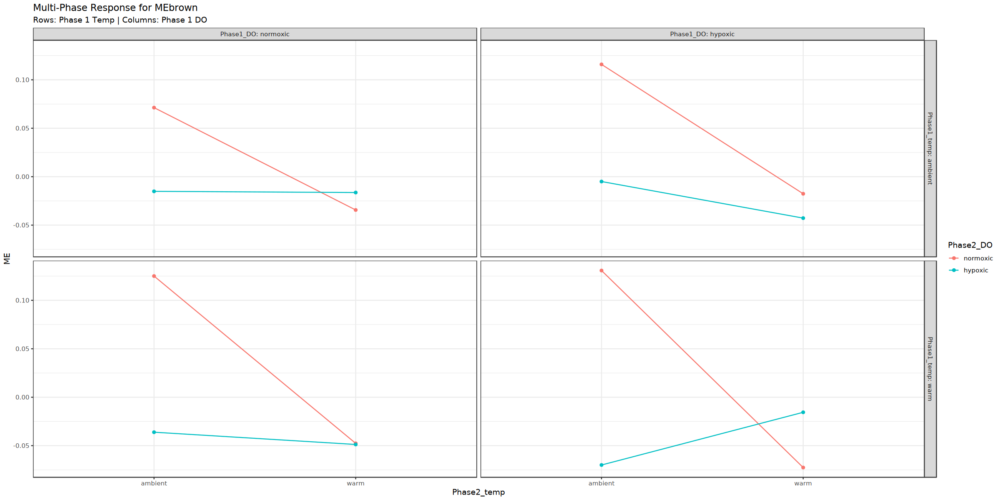

In [89]:
# Choose a module significant for the interaction
mod_to_plot <- "MEbrown" 

plot_data <- cbind(meta_merge, ME = MEs[[mod_to_plot]])

ggplot(plot_data, aes(x = Phase2_temp, y = ME, color = Phase2_DO, group = Phase2_DO)) +
  stat_summary(fun = mean, geom = "line") +
  stat_summary(fun = mean, geom = "point") +
  # This creates a grid: Phase 1 Temp vs Phase 1 DO
  facet_grid(Phase1_temp ~ Phase1_DO, labeller = label_both) + 
  theme_bw() +
  labs(title = paste("Multi-Phase Response for", mod_to_plot),
       subtitle = "Rows: Phase 1 Temp | Columns: Phase 1 DO")

so this is just showing how module eigengene changes in phase 2 treatments (all of the points within a box have the same phase 1 treatment) - the blue lines are phase 2 hypoxic and red are normoxic - so appears that phase 2 hypoxic conditions, regardless of phase 1, have higher eigengenes (in the salmon module) than normoxic samples - when in phase 2 warm temps, this pattern remains, but slightly increases, *except* for when oysters experience phase 1 both (bottom right panel) - we actually see an interaction, where BW has higher eigengene expression than BB

I think there are better, more logical setups for this type of plot though

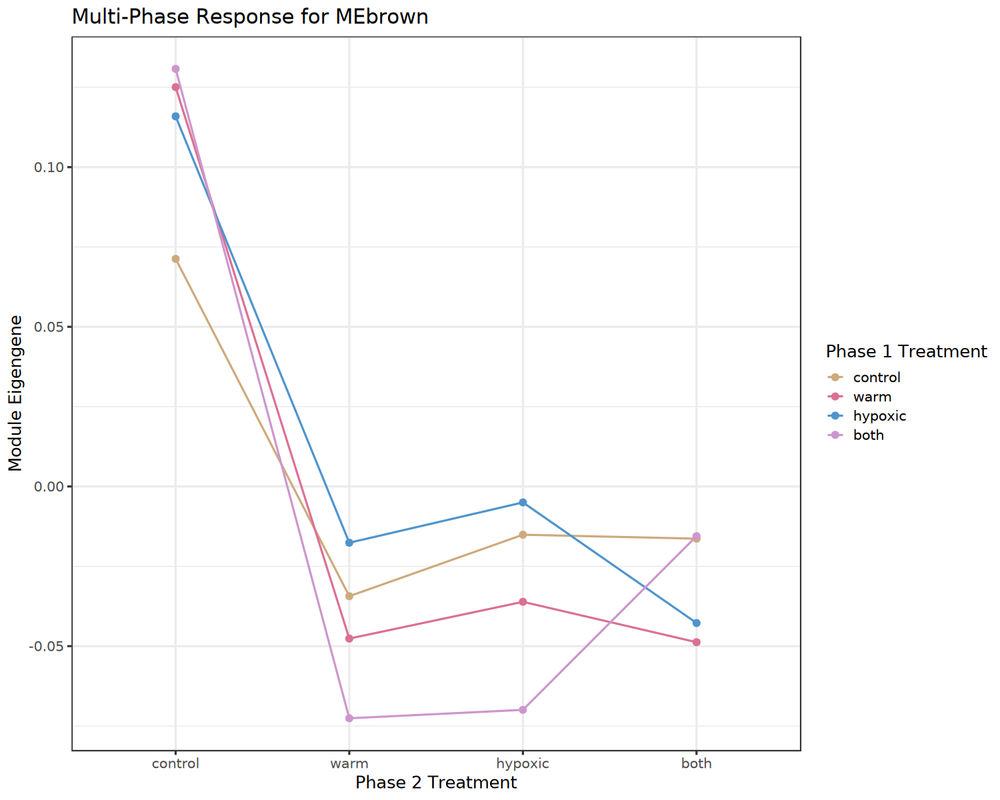

In [90]:
options(repr.plot.width = 12.5, repr.plot.height = 10)
# Choose a module significant for the interaction
mod_to_plot <- "MEbrown" 

plot_data <- cbind(meta_merge, ME = MEs[[mod_to_plot]])

ggplot(plot_data, aes(x = Phase2_treatment, y = ME, color = Phase1_treatment, group = Phase1_treatment)) +
  stat_summary(fun = mean, geom = "line") +
  stat_summary(fun = mean, geom = "point") +
  # This creates a grid: Phase 1 Temp vs Phase 1 DO
 # facet_grid(Phase1_temp ~ Phase1_DO, labeller = label_both) + 
scale_color_manual(values = c("hypoxic" = "steelblue3", 
                             "warm" = "palevioletred", 
                             "control" = "burlywood3", 
                             "both" = "plum3")) +
  theme_bw(base_size = 15) +
  labs(title = paste("Multi-Phase Response for", mod_to_plot),
      x = 'Phase 2 Treatment',
      y = 'Module Eigengene',
      color = 'Phase 1 Treatment')

this is really just another way to look at the ME boxplots

for MEbrown:
- all MEs are larger in phase 2 controls than phase 2 treatments - 
- phase 1 both seems to have higher ME when in phase 2 hypoxia or warm, but not control or both
- from heatmap - WC, HC, and BC had a sig neg. corr and HB has sig. pos. corr - can see that here

what if we change the color and x axis ...

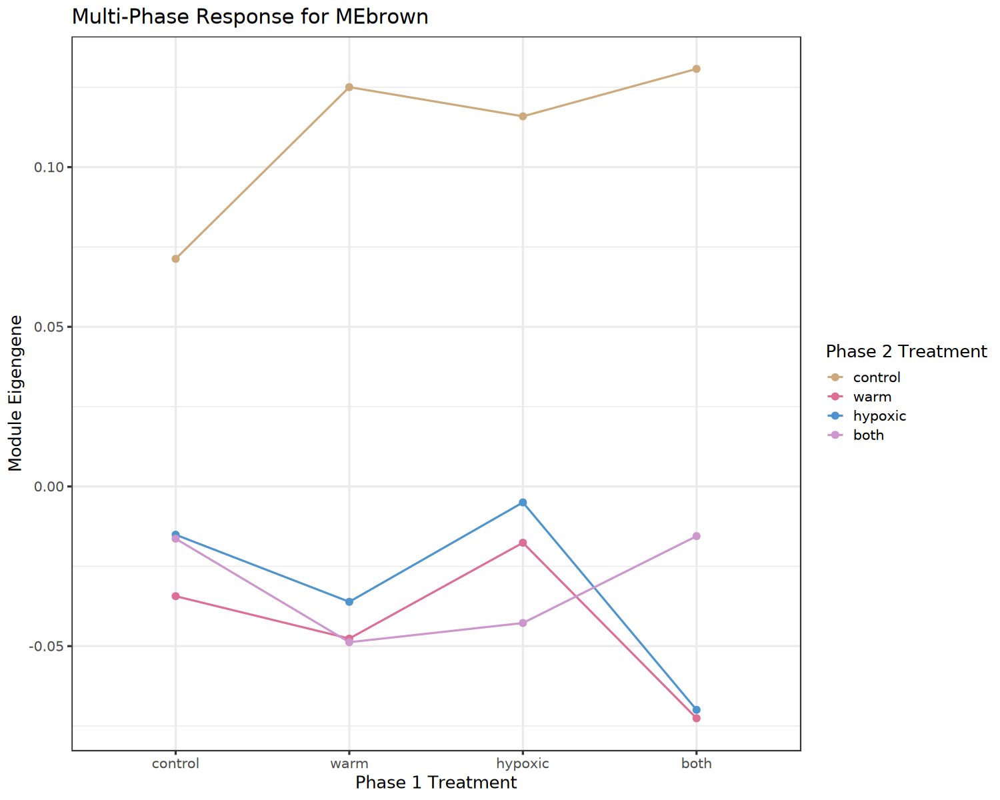

In [91]:
options(repr.plot.width = 12.5, repr.plot.height = 10)
# Choose a module significant for the interaction
mod_to_plot <- "MEbrown" 

plot_data <- cbind(meta_merge, ME = MEs[[mod_to_plot]])

ggplot(plot_data, aes(x = Phase1_treatment, y = ME, color = Phase2_treatment, group = Phase2_treatment)) +
  stat_summary(fun = mean, geom = "line") +
  stat_summary(fun = mean, geom = "point") +
  # This creates a grid: Phase 1 Temp vs Phase 1 DO
 # facet_grid(Phase1_temp ~ Phase1_DO, labeller = label_both) + 
scale_color_manual(values = c("hypoxic" = "steelblue3", 
                             "warm" = "palevioletred", 
                             "control" = "burlywood3", 
                             "both" = "plum3")) +
  theme_bw(base_size = 15) +
  labs(title = paste("Multi-Phase Response for", mod_to_plot),
      x = 'Phase 1 Treatment',
      y = 'Module Eigengene',
      color = 'Phase 2 Treatment')

it does appear that the response differs slightly depending on the early life experience (if early life had no impact, then the lines would be straight) 

we especially see this when the first exposure is to both - the most different from the other points

#### MEturquoise

#### MEpurple

In [139]:
# Run Tukey on a specific module of interest
specific_fit <- aov(MEs$MEpurple ~ Phase1_temp * Phase1_DO * Phase2_temp * Phase2_DO, data = meta_merge)
tukey_out <- TukeyHSD(specific_fit)

# Look specifically at the interaction comparisons
head(tukey_out)

,diff,lwr,upr,p adj
warm-ambient,-0.00719297,-0.04798538,0.03359944,0.7264147
,diff,lwr,upr,p adj
hypoxic-normoxic,-0.01022387,-0.05102592,0.03057818,0.6191798
,diff,lwr,upr,p adj
warm-ambient,-0.09718555,-0.1380166,-0.05635453,9.741997e-06
,diff,lwr,upr,p adj
hypoxic-normoxic,-0.01660748,-0.05739989,0.02418493,0.4199819
,diff,lwr,upr,p adj
warm:normoxic-ambient:normoxic,0.014812204,-0.06047673,0.09010114,0.9548288
ambient:hypoxic-ambient:normoxic,0.012471755,-0.06361391,0.08855742,0.9730475


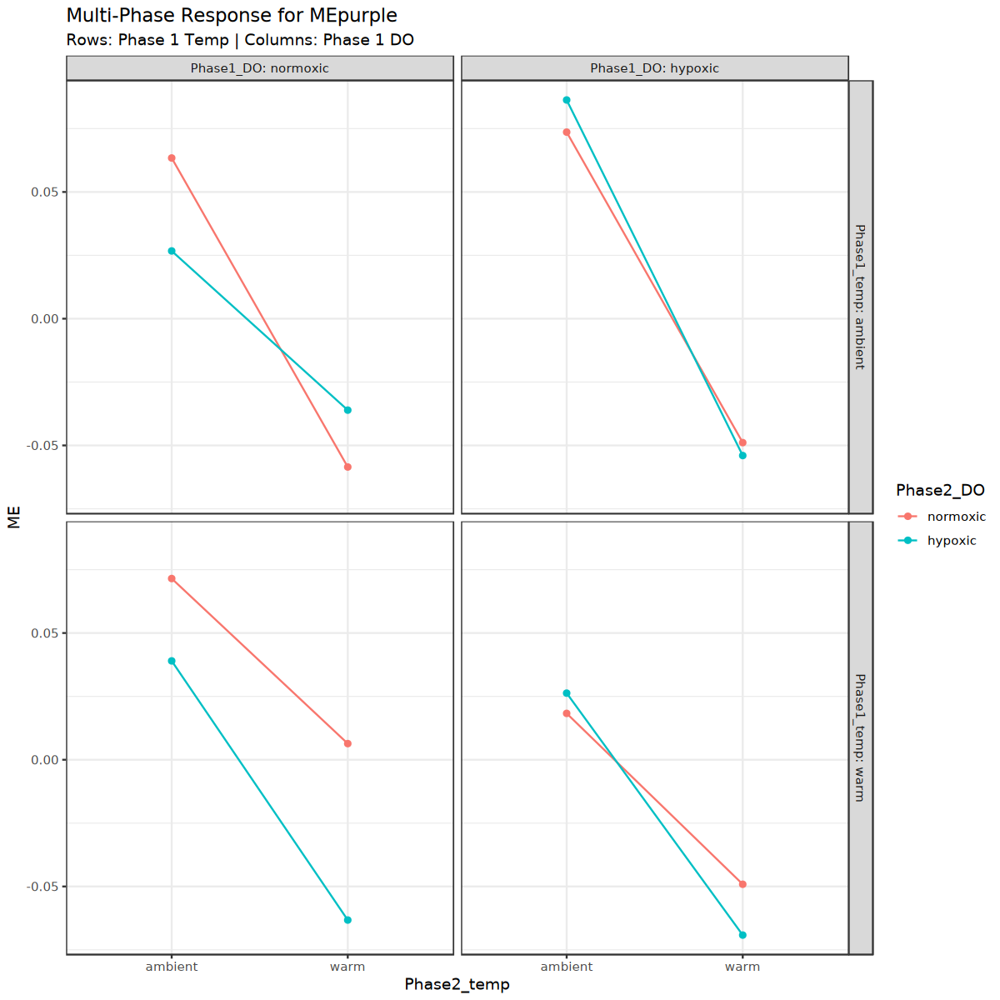

In [140]:
options(repr.plot.height = 10, repr.plot.width = 10)

# Choose a module significant for the interaction
mod_to_plot <- "MEpurple" 

plot_data <- cbind(meta_merge, ME = MEs[[mod_to_plot]])

ggplot(plot_data, aes(x = Phase2_temp, y = ME, color = Phase2_DO, group = Phase2_DO)) +
  stat_summary(fun = mean, geom = "line") +
  stat_summary(fun = mean, geom = "point") +
  # This creates a grid: Phase 1 Temp vs Phase 1 DO
  facet_grid(Phase1_temp ~ Phase1_DO, labeller = label_both) + 
  theme_bw() +
  labs(title = paste("Multi-Phase Response for", mod_to_plot),
       subtitle = "Rows: Phase 1 Temp | Columns: Phase 1 DO")

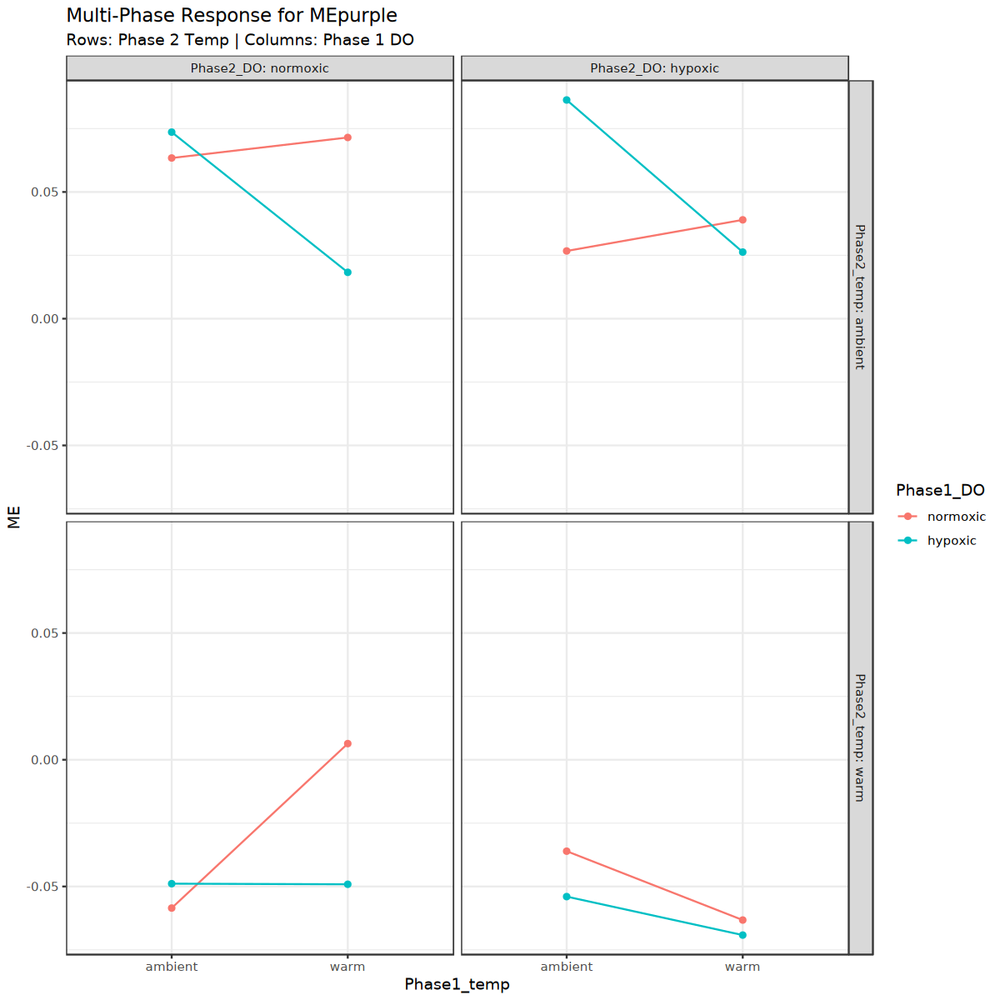

In [141]:
options(repr.plot.height = 10, repr.plot.width = 10)

# Choose a module significant for the interaction
mod_to_plot <- "MEpurple" 

plot_data <- cbind(meta_merge, ME = MEs[[mod_to_plot]])

ggplot(plot_data, aes(x = Phase1_temp, y = ME, color = Phase1_DO, group = Phase1_DO)) +
  stat_summary(fun = mean, geom = "line") +
  stat_summary(fun = mean, geom = "point") +
  # This creates a grid: Phase 2 Temp vs Phase 2 DO
  facet_grid(Phase2_temp ~ Phase2_DO, labeller = label_both) + 
  theme_bw() +
  labs(title = paste("Multi-Phase Response for", mod_to_plot),
       subtitle = "Rows: Phase 2 Temp | Columns: Phase 1 DO")

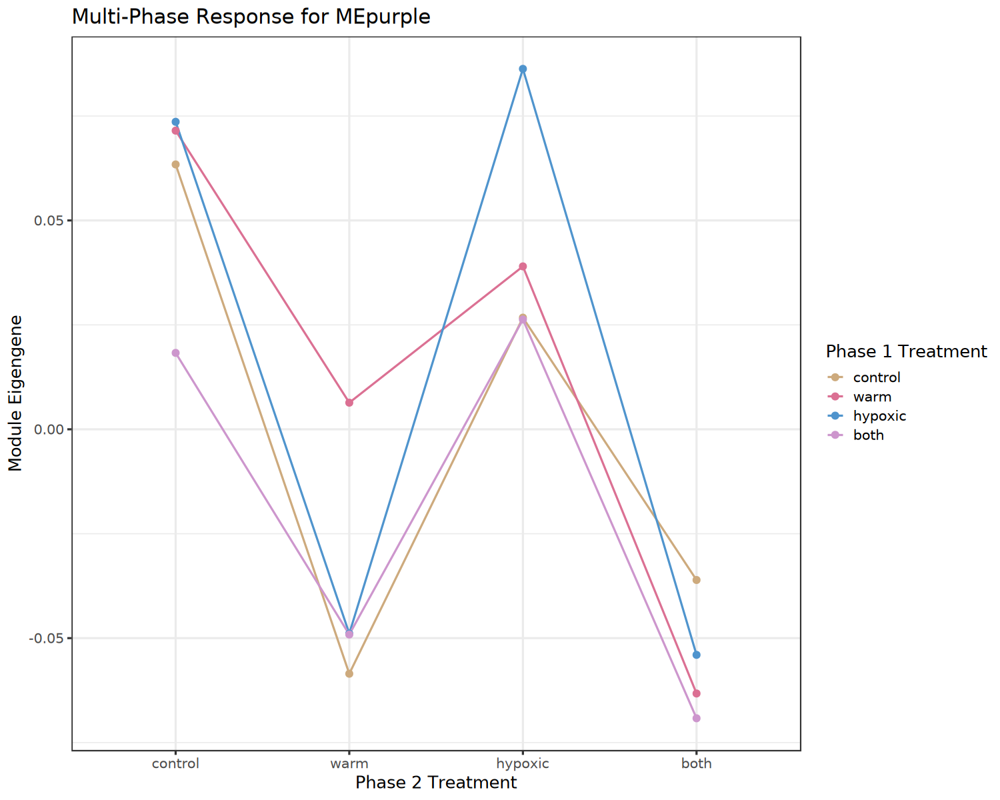

In [142]:
options(repr.plot.width = 12.5, repr.plot.height = 10)
# Choose a module significant for the interaction
mod_to_plot <- "MEpurple" 

plot_data <- cbind(meta_merge, ME = MEs[[mod_to_plot]])

ggplot(plot_data, aes(x = Phase2_treatment, y = ME, color = Phase1_treatment, group = Phase1_treatment)) +
  stat_summary(fun = mean, geom = "line") +
  stat_summary(fun = mean, geom = "point") +
  # This creates a grid: Phase 1 Temp vs Phase 1 DO
 # facet_grid(Phase1_temp ~ Phase1_DO, labeller = label_both) + 
scale_color_manual(values = c("hypoxic" = "steelblue3", 
                             "warm" = "palevioletred", 
                             "control" = "burlywood3", 
                             "both" = "plum3")) +
  theme_bw(base_size = 15) +
  labs(title = paste("Multi-Phase Response for", mod_to_plot),
      x = 'Phase 2 Treatment',
      y = 'Module Eigengene',
      color = 'Phase 1 Treatment')

this is really just another way to look at the ME boxplots


what if we change the color and x axis ...

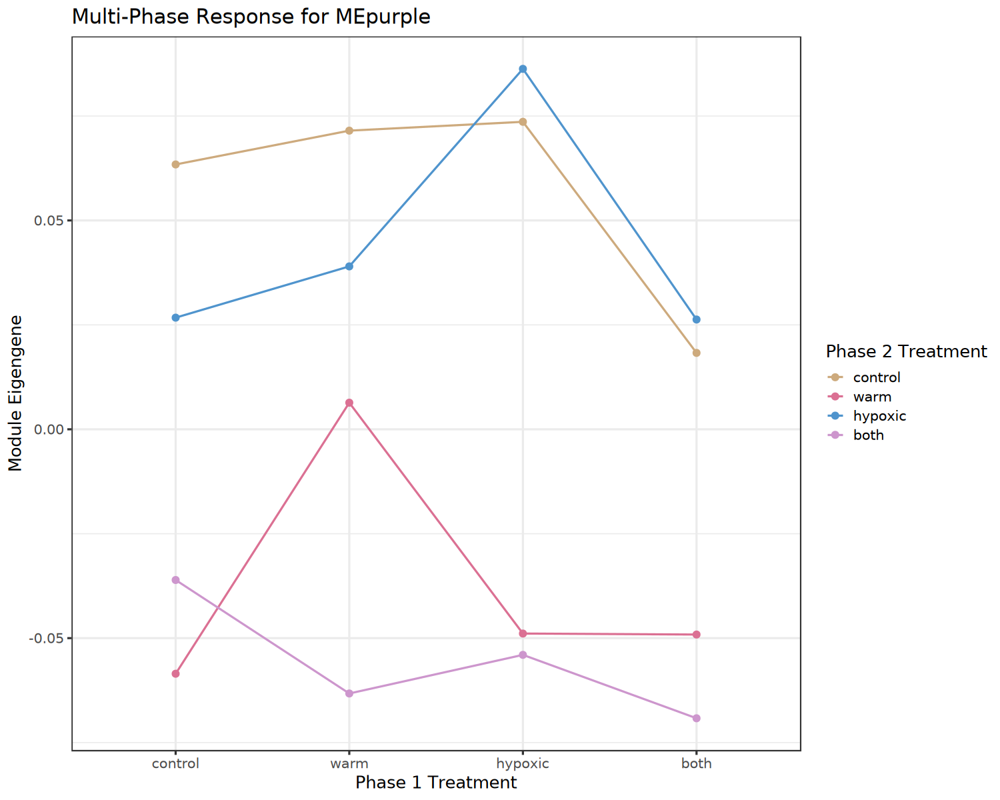

In [143]:
options(repr.plot.width = 12.5, repr.plot.height = 10)
# Choose a module significant for the interaction
mod_to_plot <- "MEpurple" 

plot_data <- cbind(meta_merge, ME = MEs[[mod_to_plot]])

ggplot(plot_data, aes(x = Phase1_treatment, y = ME, color = Phase2_treatment, group = Phase2_treatment)) +
  stat_summary(fun = mean, geom = "line") +
  stat_summary(fun = mean, geom = "point") +
  # This creates a grid: Phase 1 Temp vs Phase 1 DO
 # facet_grid(Phase1_temp ~ Phase1_DO, labeller = label_both) + 
scale_color_manual(values = c("hypoxic" = "steelblue3", 
                             "warm" = "palevioletred", 
                             "control" = "burlywood3", 
                             "both" = "plum3")) +
  theme_bw(base_size = 15) +
  labs(title = paste("Multi-Phase Response for", mod_to_plot),
      x = 'Phase 1 Treatment',
      y = 'Module Eigengene',
      color = 'Phase 2 Treatment')

## Identify hub genes
hub genes = gene with the most connectivity within its module 

In [92]:
hubGenes <- chooseTopHubInEachModule(dataExpr, # vst expr. matrix
                         mergedColors_sign, # from dendogram above
                         omitColors = "grey", # grey module = genes not assigned to any module
                         power = 5, 
                         type = "signed")

# make into df, assign modules in column
hubGenes.df <- as.data.frame(hubGenes) %>%
mutate(module = rownames(.))
# remove row names
rownames(hubGenes.df) <- NULL

hubGenes.df

hubGenes,module
<chr>,<chr>
LOC111118036,black
LOC111133766,blue
LOC111106458,brown
LOC111128146,cyan
LOC111135975,green
LOC111111121,greenyellow
LOC111099072,lightcyan
LOC111119101,magenta
LOC111099205,midnightblue


from the heatmap and boxplots above, the modules I'm most interested is:
- **brown**: [LOC111106458](https://www.ncbi.nlm.nih.gov/gene/?term=LOC111106458) 26S proteasome non-ATPase regulatory subunit 6-like
  >negatively correlated with P2 treatment and P2 temperature
  >AOV - P2 temp, P2 DO, P2 temp:P2 DO
    - proteasome-mediated ubiquitin-dependent protein catabolic process
    - part of proteasome regulatory particle
- **purple**: [LOC111118145](https://www.ncbi.nlm.nih.gov/gene/?term=LOC111118145) nucleoside diphosphate kinase homolog 5-like
  >negatively correlated with P2 temp
  >p2 warm and hypoxia have opposing correlations
  >AOV - P2 temp
    - enables nucloeside diphosphate kinase activity
    - involved in CTP, GTP, and UTP biosynthetic process
    - involved in cilium movement
    - involved in negative regulation of oxidative stress-induced intrinsic apoptotic signaling pathway
    - involved in spermatid differentiation
- **magenta**: [LOC111119101](https://www.ncbi.nlm.nih.gov/gene/?term=LOC111119101) putative E3 ubiquitin-protein ligase UNKL
  >positively correlated with P2 treatment and P2 DO
  >AOV - P2 temp, P2 DO
    - enables metal ion binding
- **salmon**: [LOC111099585](https://www.ncbi.nlm.nih.gov/gene/?term=LOC111099585) lys-63-specific deubiquitinase BRCC36-like
  >positively correlated with P2 treatment and P2 temp and P2 DO
    - enables cysteine-type deubquitinase activity
    - enables metallopeptidase activity
    - enables protein binding
    - involved in DNA repair
    - involved in protein K63-linked deubiquitination
    - part of BRCA1-A complex
    - part of BRISC complex
- **turquoise**: [LOC111109534](https://www.ncbi.nlm.nih.gov/gene/?term=LOC111109534) uncharacterized
>p2 warm and hypoxia have opposing correlations
    - enables calcium ion binding
    - involved in cell communication
    - located in membrane

## Gene significance (GS) and module membership (MM)
both are critical metrics for identifying hub genes within modules that are associated with specific treatment/traits
- GS = correlates gene expression with treatment/trait
- MM = how well a gene belongs to a module

basically select a module of interest and validate with GS and MM - combine GS and MM to find genes that are highly connected *and* strongly associated with the treatment/trait

In [93]:
modNames <- substring(names(MEs), 3)
modNames

[1] "brown"        "blue"         "purple"       "magenta"      "pink"        
 [6] "lightcyan"    "midnightblue" "black"        "yellow"       "cyan"        
[11] "turquoise"    "salmon"       "tan"          "greenyellow"  "green"       
[16] "red"

#### module membership
MM is the same across all treatments

In [94]:
geneModuleMembership = as.data.frame(cor(dataExpr, MEs, use = "p"))
MMPvalue = as.data.frame(corPvalueStudent(as.matrix(geneModuleMembership), nSamples))

names(geneModuleMembership) = paste("MM", modNames, sep="")
names(MMPvalue) = paste("p.MM", modNames, sep="")

In [95]:
head(geneModuleMembership)

,MMbrown,MMblue,MMpurple,MMmagenta,MMpink,MMlightcyan,MMmidnightblue,MMblack,MMyellow,MMcyan,MMturquoise,MMsalmon,MMtan,MMgreenyellow,MMgreen,MMred
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC144621260,-0.2061515,-0.20689824,-0.1671147,-0.17832148,-0.18603769,0.283566729,0.122696269,0.58690535,0.19666139,0.162919972,0.41149690,0.06262393,-0.05981010,-0.22610500,0.09516079,0.17761562
LOC144621269,-0.0808058,0.02327823,-0.4015339,-0.04856626,-0.05523191,0.099450233,-0.037128074,-0.05003084,-0.08291282,0.416337119,0.96096426,0.12258955,-0.03245621,-0.07354163,-0.06242349,-0.09745916
LOC111120925,-0.2159744,-0.09518553,-0.1775402,0.10581905,-0.01841688,0.283541887,0.245136772,0.82775595,0.48802441,0.488335532,0.06499592,0.27019554,0.10325852,-0.15672187,0.01501662,-0.04220669
LOC144621283,0.2663416,0.50154897,0.2481213,-0.08706705,-0.01219176,-0.001333717,0.044917417,-0.08734874,0.08411783,0.018243423,-0.02059033,0.01957229,0.01371603,-0.06367909,-0.52736647,-0.16430806
LOC144621276,0.3101271,0.83047779,0.2223816,0.15950759,0.07603540,0.344195070,-0.003319712,-0.04234777,-0.05057665,-0.001740781,0.26896317,0.11485779,-0.19396233,-0.37782670,-0.66076493,-0.43107947
LOC111115920,-0.1298255,-0.30906699,-0.1195040,-0.05774590,0.03120045,-0.140888126,-0.013836467,0.02346761,-0.07962624,-0.062748356,-0.15495603,-0.04786271,0.18101295,0.25835117,0.34977759,0.13961536


#### gene significance
calculated for each treatment combination

In [96]:
# List all trait sets you want to process
trait_sets <- list(
  Combo_treatments = combo.treatments[-1],  # exclude first column 
  phase1_temp = phase1.temp[-1],
  phase1_DO = phase1.DO[-1],
    phase2_temp = phase2.temp[-1],
    phase2_DO = phase2.DO[-1],
    phase1_treatment = phase1.treatments[-1],
    phase2_treatment = phase2.treatments[-1]
)

# Initialize lists to store results
geneTraitSignificance_all <- list()
GSPvalue_all <- list()

# Loop over each trait set
for(set_name in names(trait_sets)){
  traits_df <- trait_sets[[set_name]]
  
  # Get trait names
  trait_names <- colnames(traits_df)
  
  # Initialize lists for this set
  gs_list <- list()
  gs_p_list <- list()
  
  for(trt in trait_names){
    trt_df <- as.data.frame(traits_df[[trt]])
    names(trt_df) <- trt
    
    # Compute gene-trait significance and p-values
    gs <- as.data.frame(cor(dataExpr, trt_df, use = "p"))
    gs_p <- as.data.frame(corPvalueStudent(as.matrix(gs), nSamples))
    
    # Rename columns
    names(gs) <- paste0("GS.", trt)
    names(gs_p) <- paste0("p.GS.", trt)
    
    # Store in lists
    gs_list[[trt]] <- gs
    gs_p_list[[trt]] <- gs_p
  }
  
  # Combine into data frames for this set
  geneTraitSignificance_all[[set_name]] <- do.call(cbind, gs_list)
  GSPvalue_all[[set_name]] <- do.call(cbind, gs_p_list)
}

# Optional: combine all sets into one big data frame each
geneTraitSignificance_df <- do.call(cbind, geneTraitSignificance_all)
GSPvalue_df <- do.call(cbind, GSPvalue_all)

In [97]:
head(geneTraitSignificance_df) 
head(GSPvalue_df)

,Combo_treatments.GS.both_both,Combo_treatments.GS.both_warm,Combo_treatments.GS.both_control,Combo_treatments.GS.both_hypoxic,Combo_treatments.GS.control_hypoxic,Combo_treatments.GS.control_both,Combo_treatments.GS.control_control,Combo_treatments.GS.control_warm,Combo_treatments.GS.hypoxic_both,Combo_treatments.GS.hypoxic_control,⋯,phase2_DO.GS.hypoxic,phase2_DO.GS.normoxic,phase1_treatment.GS.both,phase1_treatment.GS.control,phase1_treatment.GS.hypoxic,phase1_treatment.GS.warm,phase2_treatment.GS.both,phase2_treatment.GS.warm,phase2_treatment.GS.control,phase2_treatment.GS.hypoxic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC144621260,0.04188559,0.092703247,-0.08477037,-0.001618186,-0.071062154,-0.056055407,-0.007770435,0.19396922,-0.074372138,-0.09947300,⋯,-0.11805066,0.11805066,0.03199296,0.03405143,-0.18125393,0.11408075,-0.01643940,0.20272043,-0.07031026,-0.1214543
LOC144621269,0.09157179,-0.054265935,0.11692154,-0.111069224,-0.157140988,-0.001447872,-0.136822237,0.34913855,0.071976608,-0.10693088,⋯,-0.11617298,0.11617298,0.02470478,0.03702077,-0.09132950,0.02955641,0.11572949,0.22876461,-0.09932208,-0.2553128
LOC111120925,0.06775900,-0.001225189,-0.10346832,-0.055307427,-0.091355621,0.156499610,-0.018227069,-0.10947653,0.120637759,-0.03889762,⋯,0.18855995,-0.18855995,-0.04587266,-0.03482169,0.01910932,0.06005516,0.33153966,-0.10724096,-0.11063001,-0.1202713
LOC144621283,0.05094742,-0.092204786,0.07575908,-0.196461924,-0.082347276,0.085639019,0.180630809,-0.06847086,0.002971852,0.10046935,⋯,-0.03866571,0.03866571,-0.08803250,0.05740291,0.11428815,-0.08379225,0.01915600,-0.15395507,0.20381053,-0.0650434
LOC144621276,0.02574203,-0.133634592,0.07488754,-0.095662256,-0.237967981,0.185898631,0.033311222,-0.01445328,0.251801246,0.06080315,⋯,0.04800379,-0.04800379,-0.07349466,-0.02049199,0.12048223,-0.02720898,0.30898971,-0.19583743,0.14533278,-0.2618159
LOC111115920,-0.10697690,-0.049060204,-0.07267421,0.096231367,0.005736008,-0.039425712,-0.109574407,-0.10320735,-0.086601971,-0.06156875,⋯,0.03548306,-0.03548306,-0.07780168,-0.13542777,0.02646166,0.18303024,-0.09894752,0.04534309,-0.08827069,0.1434531


,Combo_treatments.p.GS.both_both,Combo_treatments.p.GS.both_warm,Combo_treatments.p.GS.both_control,Combo_treatments.p.GS.both_hypoxic,Combo_treatments.p.GS.control_hypoxic,Combo_treatments.p.GS.control_both,Combo_treatments.p.GS.control_control,Combo_treatments.p.GS.control_warm,Combo_treatments.p.GS.hypoxic_both,Combo_treatments.p.GS.hypoxic_control,⋯,phase2_DO.p.GS.hypoxic,phase2_DO.p.GS.normoxic,phase1_treatment.p.GS.both,phase1_treatment.p.GS.control,phase1_treatment.p.GS.hypoxic,phase1_treatment.p.GS.warm,phase2_treatment.p.GS.both,phase2_treatment.p.GS.warm,phase2_treatment.p.GS.control,phase2_treatment.p.GS.hypoxic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC144621260,0.6917853,0.3794471,0.4217324,0.98778575,0.50086038,0.5956053,0.94139754,0.0639271989,0.48107432,0.3454718,⋯,0.2623966,0.2623966,0.7620823,0.7472726,0.0837895,0.27889599,0.876398956,0.05262152,0.50541335,0.24878887
LOC144621269,0.3853163,0.6074179,0.2670204,0.29186555,0.13466769,0.9890712,0.19341764,0.0006471581,0.49535202,0.3103280,⋯,0.2701159,0.2701159,0.8151746,0.7260716,0.3865801,0.77972298,0.271961285,0.02827811,0.34620785,0.01403971
LOC111120925,0.5210202,0.9907520,0.3263455,0.60053030,0.38644375,0.1362864,0.86308232,0.2988832540,0.25200827,0.7127755,⋯,0.0718513,0.0718513,0.6641375,0.7417542,0.8565241,0.56958237,0.001245019,0.30891893,0.29378983,0.25346222
LOC144621283,0.6295911,0.3820260,0.4729098,0.06052245,0.43517037,0.4169740,0.08487675,0.5166411361,0.97757017,0.3406376,⋯,0.7144138,0.7144138,0.4040247,0.5867789,0.2780172,0.42712782,0.856177389,0.14285382,0.05133614,0.53789640
LOC144621276,0.8075613,0.2040998,0.4780315,0.36435537,0.02235861,0.0760305,0.75258781,0.8912342377,0.01546419,0.5647757,⋯,0.6495389,0.6495389,0.4862785,0.8462657,0.2526247,0.79682463,0.002727369,0.06136125,0.16688739,0.01170035
LOC111115920,0.3101186,0.6423506,0.4911714,0.36149565,0.95672320,0.7090496,0.29844884,0.3275737533,0.41173549,0.5598759,⋯,0.7370262,0.7370262,0.4610234,0.1980399,0.8022897,0.08075088,0.348038700,0.66778492,0.40274911,0.17250216


In [98]:
colnames(geneTraitSignificance_df)
colnames(GSPvalue_df)

[1] "Combo_treatments.GS.both_both"       "Combo_treatments.GS.both_warm"      
 [3] "Combo_treatments.GS.both_control"    "Combo_treatments.GS.both_hypoxic"   
 [5] "Combo_treatments.GS.control_hypoxic" "Combo_treatments.GS.control_both"   
 [7] "Combo_treatments.GS.control_control" "Combo_treatments.GS.control_warm"   
 [9] "Combo_treatments.GS.hypoxic_both"    "Combo_treatments.GS.hypoxic_control"
[11] "Combo_treatments.GS.hypoxic_warm"    "Combo_treatments.GS.hypoxic_hypoxic"
[13] "Combo_treatments.GS.warm_control"    "Combo_treatments.GS.warm_hypoxic"   
[15] "Combo_treatments.GS.warm_warm"       "Combo_treatments.GS.warm_both"      
[17] "phase1_temp.GS.warm"                 "phase1_temp.GS.ambient"             
[19] "phase1_DO.GS.hypoxic"                "phase1_DO.GS.normoxic"              
[21] "phase2_temp.GS.warm"                 "phase2_temp.GS.ambient"             
[23] "phase2_DO.GS.hypoxic"                "phase2_DO.GS.normoxic"              
[25] "phase1_treatment.GS.both"            "phase1_treatment.GS.control"        
[27] "phase1_treatment.GS.hypoxic"         "phase1_treatment.GS.warm"           
[29] "phase2_treatment.GS.both"            "phase2_treatment.GS.warm"           
[31] "phase2_treatment.GS.control"         "phase2_treatment.GS.hypoxic"

[1] "Combo_treatments.p.GS.both_both"      
 [2] "Combo_treatments.p.GS.both_warm"      
 [3] "Combo_treatments.p.GS.both_control"   
 [4] "Combo_treatments.p.GS.both_hypoxic"   
 [5] "Combo_treatments.p.GS.control_hypoxic"
 [6] "Combo_treatments.p.GS.control_both"   
 [7] "Combo_treatments.p.GS.control_control"
 [8] "Combo_treatments.p.GS.control_warm"   
 [9] "Combo_treatments.p.GS.hypoxic_both"   
[10] "Combo_treatments.p.GS.hypoxic_control"
[11] "Combo_treatments.p.GS.hypoxic_warm"   
[12] "Combo_treatments.p.GS.hypoxic_hypoxic"
[13] "Combo_treatments.p.GS.warm_control"   
[14] "Combo_treatments.p.GS.warm_hypoxic"   
[15] "Combo_treatments.p.GS.warm_warm"      
[16] "Combo_treatments.p.GS.warm_both"      
[17] "phase1_temp.p.GS.warm"                
[18] "phase1_temp.p.GS.ambient"             
[19] "phase1_DO.p.GS.hypoxic"               
[20] "phase1_DO.p.GS.normoxic"              
[21] "phase2_temp.p.GS.warm"                
[22] "phase2_temp.p.GS.ambient"             
[23] "phase2_DO.p.GS.hypoxic"               
[24] "phase2_DO.p.GS.normoxic"              
[25] "phase1_treatment.p.GS.both"           
[26] "phase1_treatment.p.GS.control"        
[27] "phase1_treatment.p.GS.hypoxic"        
[28] "phase1_treatment.p.GS.warm"           
[29] "phase2_treatment.p.GS.both"           
[30] "phase2_treatment.p.GS.warm"           
[31] "phase2_treatment.p.GS.control"        
[32] "phase2_treatment.p.GS.hypoxic"

In [99]:
annot <- read.csv('//work/pi_sarah_gignouxwolfsohn_uml_edu/julia_mcdonough_student_uml_edu/ref_files/annotations/newRef_geneGO.csv')
colnames(annot)[1] <- 'Gene'
colnames(annot)[2] <- 'GO.terms'
head(annot)

,Gene,GO.terms
,<chr>,<chr>
1,LOC111099029,GO:0005261;GO:0005886;GO:0030001;GO:0098655
2,LOC111099032,GO:0004930;GO:0005886;GO:0007186
3,LOC111099037,GO:0000978;GO:0000981;GO:0006355
4,LOC111099039,GO:0004930;GO:0005886;GO:0007189
5,LOC111099040,GO:0005515;GO:0007169;GO:0035556
6,LOC111099041,GO:0016020;GO:0022857;GO:0055085


In [100]:
# 1. Create a data frame for gene information
# Ensure the names of the vector match your gene names
gene_info <- data.frame(
  Gene = colnames(dataExpr),
  ModuleColor = mergedColors_sign
)

# 2. Bind it with  MM and GS dataframes
# (Assuming these have genes as row names in the same order)
final_results <- cbind(gene_info, geneTraitSignificance_df,GSPvalue_df, geneModuleMembership)

# 3. Add GO terms
final_res <- merge(annot, final_results, by = 'Gene')

# 3. Take a look
head(final_res)

,Gene,GO.terms,ModuleColor,Combo_treatments.GS.both_both,Combo_treatments.GS.both_warm,Combo_treatments.GS.both_control,Combo_treatments.GS.both_hypoxic,Combo_treatments.GS.control_hypoxic,Combo_treatments.GS.control_both,Combo_treatments.GS.control_control,⋯,MMmidnightblue,MMblack,MMyellow,MMcyan,MMturquoise,MMsalmon,MMtan,MMgreenyellow,MMgreen,MMred
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,LOC111099029,GO:0005261;GO:0005886;GO:0030001;GO:0098655,yellow,-0.01495044,0.009030399,-0.04316368,-0.085413908,-0.04374884,-0.0729733470,-0.00471465,⋯,0.065460089,-0.018296558,0.06646763,-0.13317516,-0.031858336,-0.01124888,0.02333575,0.06322218,0.2211404,0.12461204
2,LOC111099037,GO:0000978;GO:0000981;GO:0006355,midnightblue,0.14459247,-0.064829675,-0.06181353,-0.061718773,0.15599740,0.1040893959,-0.06447848,⋯,0.748900339,0.327570333,0.39804191,-0.04937016,-0.078146300,-0.10142873,-0.01492029,-0.24537144,-0.1083778,-0.21658264
3,LOC111099040,GO:0005515;GO:0007169;GO:0035556,greenyellow,0.11681949,0.006899984,0.18134237,0.313437234,0.20532184,0.0718962563,-0.11146323,⋯,-0.115310362,-0.117876698,0.05946136,-0.13105088,-0.064554246,0.04518120,0.09161650,0.35226238,0.2200053,-0.04466655
4,LOC111099041,GO:0016020;GO:0022857;GO:0055085,green,0.14136041,0.065349310,-0.10640160,0.128461971,-0.07462762,-0.0004772388,-0.15790529,⋯,0.006388863,0.229504381,0.02044144,0.13357465,-0.005118615,0.33307009,0.24671309,0.21709977,0.4433002,0.15647982
5,LOC111099043,GO:0005222;GO:0005223;GO:0005886;GO:0017071;GO:0030553;GO:0044877;GO:0098655,green,0.04364955,0.145555981,-0.08304872,0.155151519,0.03698424,0.2778968873,-0.21252303,⋯,-0.112655485,-0.008789098,-0.01210893,0.01072442,0.152950645,0.05420974,0.28229826,0.14856114,0.3971374,0.14279690
6,LOC111099050,GO:0005515;GO:0006886;GO:0031462;GO:0043161;GO:1990756,red,-0.04705534,-0.010491654,-0.08949085,0.002778676,0.09915982,-0.0823056472,0.05071313,⋯,-0.098692689,0.158466514,0.09721454,0.19773948,0.192763544,0.29045733,0.40240572,0.22677789,0.3603098,0.55047256


In [101]:
#write.csv(final_res, '/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/new_refGenome/wgcna/p2.wgcna_GeneInfo.csv', row.names = FALSE)

## vst expression of modules

In [102]:
final_res <- read.csv('/project/pi_sarah_gignouxwolfsohn_uml_edu/julia/CE_2024/CE24_RNA-seq/analysis/diff_expression/phase2_v_phase2/wgcna/p2.wgcna_GeneInfo.csv')

In [103]:
# convert vst matrix to df
vst_expr <- as.data.frame(dataExpr)
# add sample column from rowname
vst_expr$Sample <- rownames(vst_expr)

head(vst_expr)

,LOC144621260,LOC144621269,LOC111120925,LOC144621283,LOC144621276,LOC111115920,LOC144621308,LOC111112629,LOC111102827,LOC111102829,⋯,LOC111110910,LOC111110817,LOC111111216,LOC111111215,LOC111111213,LOC111114497,LOC111114498,LOC111112304,LOC144621888,Sample
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
B1_B1_O01,2495.692,52.27077,66.526433,540.7649,10722.16,160.61382,56.072279,201.4801,1169.9148,329.7810,⋯,604.4402,349.73896,135.9040,320.2773,11318.047,100.7400,2457.676,1218.3841,3.801510,B1_B1_O01
B1_W5_O50,2092.463,1648.11743,23.227145,870.5130,11074.30,182.78753,9.088883,429.1972,577.6490,353.4566,⋯,1483.5077,81.79995,238.3307,194.9060,9510.001,120.1752,2850.880,1188.6239,7.069131,B1_W5_O50
B2_B5_O51,2064.163,2375.98692,448.606226,891.4734,12546.63,151.12960,59.304021,175.0425,1866.1636,397.9109,⋯,1660.5126,724.08297,186.5207,231.4770,12999.059,181.7381,3033.114,917.2993,18.173813,B2_B5_O51
B2_C4_O40,1825.307,889.77116,9.680992,740.1558,11113.78,108.25109,17.601803,638.0654,639.8256,314.1922,⋯,684.7102,57.20586,189.2194,148.7352,9537.537,136.4140,2025.087,1159.0788,17.601803,B2_C4_O40
B3_B4_O41,1404.294,2454.89589,17.451866,819.0743,13593.84,89.58625,86.095875,550.3155,1090.1599,326.9316,⋯,779.5167,65.15363,30.2499,52.3556,11200.608,303.6625,2493.290,969.1603,17.451866,B3_B4_O41
B3_C3_O30,1381.734,1036.59320,8.189788,1091.5818,14838.73,78.38797,44.458851,168.4756,914.9163,353.3309,⋯,834.1884,64.34834,219.9543,142.7363,9548.123,226.9741,2579.783,790.8996,7.019819,B3_C3_O30


creating plots showing vst expression of significantly correlated modules and treatments - 

plot vst expression +- standard error
- SE = estimates the precision or uncertainty of the sample mean relative to the true population mean
- SD = measures dispersion or spread of individual data points within a single sample - reflecting data variability

#### brown module

In [104]:
brown_genes <- final_res %>%
  filter(ModuleColor == "brown") %>%
  pull(Gene) # This returns just the vector of gene names

head(brown_genes)
length(brown_genes) # 1266 genes in the brown module

[1] "COX1"         "COX2"         "COX3"         "CYTB"         "LOC111099081"
[6] "LOC111099097"

[1] 1702

In [105]:
# pull out vst expr for genes in module of interest
brown_genes_vst <- vst_expr[,colnames(vst_expr) %in% brown_genes] %>%
mutate(Sample = row.names(.)) %>%
  pivot_longer(
    cols = c(1:152), # select gene columns
    names_to = "Gene",
    values_to = "vst"
  ) 

brown_genes_vst <- merge(brown_genes_vst, meta_merge, by = 'Sample')
    
head(brown_genes_vst)
dim(brown_genes_vst)

,Sample,LOC111127468,LOC111125975,LOC111127219,LOC111123735,LOC111123969,LOC111123965,LOC111126179,LOC111123897,LOC111122875,⋯,combo_trtmt,Actual_shell_growth_mg,Actual_tissue_growth_mg,Ratio_tissue_shell_mg,P1_trtmt_code,P2_trtmt_code,P1_temp_code,P2_temp_code,P1_DO_code,P2_DO_code
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,B1_B1_O01,3585.775,4596.976,1990.091,2354.085,147.3085,506.5513,549.3183,551.219,277.5103,⋯,both_both,210.2755,120.7245,0.574125224,4,4,2,2,2,2
2,B1_B1_O01,3585.775,4596.976,1990.091,2354.085,147.3085,506.5513,549.3183,551.219,277.5103,⋯,both_both,210.2755,120.7245,0.574125224,4,4,2,2,2,2
3,B1_B1_O01,3585.775,4596.976,1990.091,2354.085,147.3085,506.5513,549.3183,551.219,277.5103,⋯,both_both,210.2755,120.7245,0.574125224,4,4,2,2,2,2
4,B1_B1_O01,3585.775,4596.976,1990.091,2354.085,147.3085,506.5513,549.3183,551.219,277.5103,⋯,both_both,210.2755,120.7245,0.574125224,4,4,2,2,2,2
5,B1_B1_O01,3585.775,4596.976,1990.091,2354.085,147.3085,506.5513,549.3183,551.219,277.5103,⋯,both_both,210.2755,120.7245,0.574125224,4,4,2,2,2,2
6,B1_B1_O01,3585.775,4596.976,1990.091,2354.085,147.3085,506.5513,549.3183,551.219,277.5103,⋯,both_both,210.2755,120.7245,0.574125224,4,4,2,2,2,2


[1] 13984   973

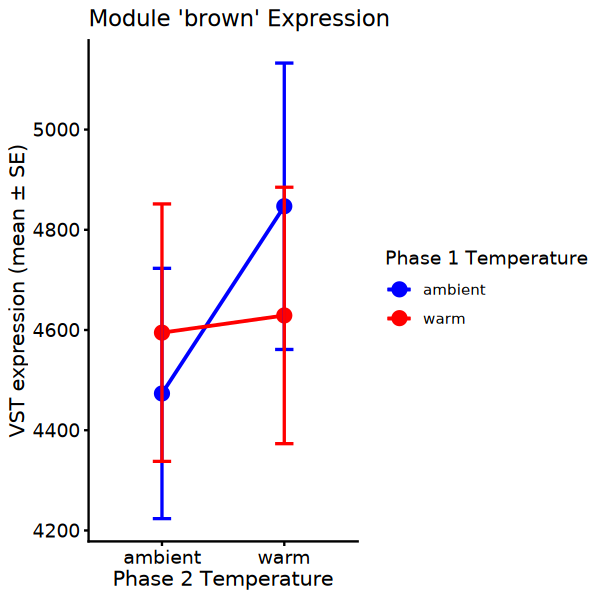

In [106]:
options(repr.plot.width = 5, repr.plot.height = 5)

# 1. Summarise by treatment factors
mb.sd <- brown_genes_vst %>%
  group_by(Phase1_temp, Phase2_temp) %>% 
  summarise(
    meanExp = mean(vst),
    n = n(),
    seExp = sd(vst) / sqrt(n()), # Calculating SE 
    .groups = "drop"
  )

# 2. Plot
ggplot(mb.sd, aes(x = Phase2_temp, y = meanExp, group = Phase1_temp, color = Phase1_temp)) +
  # Lines: 'group' tells ggplot which points to connect
  geom_line(linewidth = 0.8) +
  # Points
  geom_point(size = 3.5) +
  # Error bars
  geom_errorbar(aes(ymin = meanExp - seExp, ymax = meanExp + seExp),
                width = 0.15,
                linewidth = 0.7) +
# color of points
scale_color_manual(values = c("warm" = "red", 
                             "ambient" = "blue")) +
  # Labels
  labs(
    title = "Module 'brown' Expression", 
    x = "Phase 2 Temperature",
    y = "VST expression (mean ± SE)",
    color = "Phase 1 Temperature"
  ) +
  theme_classic() +
  theme(
    axis.text = element_text(size = 11),
    axis.title = element_text(size = 12)
  )

# I STOPPED HERE

in the midnightblue module, phase 1 temperature is correlated with expression of these genes - phase 1 warming is lower than phase 1 ambient temps, regardless of any DO treatment, and regardless of a second (more recent) temperature treatment

taking a closer look at this - splitting apart the samples by DO treatments

In [107]:
options(repr.plot.width = 7.5, repr.plot.height = 5)

# 1. Summarise by treatment factors
mb.sd <- midnightblue_vst %>%
  group_by(Phase1_temp, Phase2_temp, Phase1_DO, Phase2_DO) %>% 
  summarise(
    meanExp = mean(vst),
    n = n(),
    seExp = sd(vst) / sqrt(n()), # Calculating SE 
    .groups = "drop"
  )

# 2. Plot
ggplot(mb.sd, aes(x = Phase2_temp, y = meanExp, group = Phase1_temp, color = Phase1_temp)) +
  # Lines: 'group' tells ggplot which points to connect
  geom_line(linewidth = 0.8) +
  # Points
  geom_point(size = 3.5) +
facet_grid(Phase1_DO ~ Phase2_DO,
           labeller = labeller(
             Phase1_DO = label_both, 
             Phase2_DO = label_both
           )) + # rows ~ columns
  # Error bars
  geom_errorbar(aes(ymin = meanExp - seExp, ymax = meanExp + seExp),
                width = 0.15,
                linewidth = 0.7) +
scale_color_manual(values = c("warm" = "red", 
                             "ambient" = "blue")) +
  # Labels
  labs(
    title = "Module 'midnightblue' Expression", 
    x = "Phase 2 Temperature",
    y = "VST expression (mean ± SE)",
    color = "Phase 1 Temperature"
  ) +
  theme_bw() +
  theme(
    axis.text = element_text(size = 11),
    axis.title = element_text(size = 12),
      strip.text = element_text(size = 11)
  )

ERROR: Error in eval(expr, envir, enclos): object 'midnightblue_vst' not found


when phase 2 DO is hypoxic, we see this shift in expression for the phase 1 warming

when phase 1 DO is hypoxic, phase 1 warming changes depending on the second temperature treatment (increases in warming)

when phase 1 DO is normoxic, phase 1 warming decreases in phase 2 warming

looking at this in another, different way - taking a step back and looking at phase 1 and phase 2 treatments as a whole, facetted by phase 1 temperature)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 5)

# 1. Summarise by treatment factors
mb.sd <- midnightblue_vst %>%
  group_by(Phase1_treatment, Phase2_treatment, Phase1_temp) %>% 
  summarise(
    meanExp = mean(vst),
    n = n(),
    seExp = sd(vst) / sqrt(n()), # Calculating SE 
    .groups = "drop"
  )

# 2. Plot
ggplot(mb.sd, aes(x = Phase2_treatment, y = meanExp, group = Phase1_treatment, color = Phase1_treatment)) +
  # Lines: 'group' tells ggplot which points to connect
  geom_line(linewidth = 0.8) +
  # Points
  geom_point(size = 3.5) +
facet_wrap(~Phase1_temp, 
          labeller = label_both
          ) +
  # Error bars
  geom_errorbar(aes(ymin = meanExp - seExp, ymax = meanExp + seExp),
                width = 0.15,
                linewidth = 0.7) +
# colors
scale_color_manual(values = c("hypoxic" = "steelblue3", 
                             "warm" = "palevioletred", 
                             "control" = "burlywood3", 
                             "both" = "plum3")) +
  # Labels
  labs(
    title = "Module 'midnightblue' Expression", 
    x = "Phase 2 Treatment",
    y = "VST expression (mean ± SE)",
    color = "Phase 1 Treatment"
  ) +
  theme_bw() +
  theme(
    axis.text = element_text(size = 11),
    axis.title = element_text(size = 12),
      strip.text = element_text(size=11)
  )

so it looks like what's driving warming to be lower is BH and WB treatments - both of these are phase 1 temp = warm, phase 2 DO = hypoxia